# Comparison of results for different methods

## Helper Functions

In [2]:
%matplotlib inline
# commonroad
from commonroad.geometry.shape import Polygon, ShapeGroup, Shape, Rectangle
from commonroad.scenario.lanelet import LaneletNetwork
from commonroad.scenario.obstacle import StaticObstacle, ObstacleType
from commonroad.scenario.scenario import Scenario
from commonroad.scenario.trajectory import State, Trajectory
from commonroad.prediction.prediction import TrajectoryPrediction, SetBasedPrediction

#commonroad-io
from commonroad.common.file_reader import CommonRoadFileReader
from commonroad_dc.collision.visualization.draw_dispatch import draw_object

import numpy as np
import matplotlib.pyplot as plt
from time import time

# commonroad-cc
import commonroad_dc.pycrcc as pycrcc
from commonroad_dc.collision.collision_detection.pycrcc_collision_dispatch import create_collision_checker, create_collision_object
from commonroad_dc.boundary import boundary
import commonroad_dc.collision.trajectory_queries.trajectory_queries as trajectory_queries
from commonroad_dc.pycrcc.Util import trajectory_enclosure_polygons_static


import commonroad_dc.pycrcc.Util as Util

import os

def load_trajectories(scenario_name):
    import pickle
    from time import time
    
    
    directory_trajectories='trajectories/'
    try:
        with open(directory_trajectories+'trajectories_1000_'+scenario_name+'.pickle','rb') as file_load:
            list_trajectories=pickle.load(file_load)
            
        with open(directory_trajectories+'trajectories_1000_'+scenario_name+'_shape.pickle','rb') as file_load:
            (box_length,box_width)=pickle.load(file_load)    

    except:
        return None

    trajectories=list()
    trajectories_cc=list()
    egoShape=Rectangle(length=box_length, width=box_width)
    
    start_step=0
    
    
    for traj in list_trajectories:
        
        #print(traj)
        #for el in traj:
        #    el.time_step=el.time_step-traj[0].time_step
        
        traj_co = Trajectory(traj[0].time_step, traj)
        
        traj_pred = TrajectoryPrediction(trajectory=traj_co, shape=egoShape)
        co=create_collision_object(traj_pred)
        
        trajectories_cc.append(co)
            
    for traj_cc in trajectories_cc:
        co,err=trajectory_queries.trajectory_preprocess_obb_sum(traj_cc)
        err=False
        if(err):
            print("preprocessing error")
    
    for traj in list_trajectories:
        traj_list=list()
        for el in traj[start_step:]:

            new_el=list()
            new_el.append(el.position[0])
            new_el.append(el.position[1])
            new_el.append(el.orientation)
            traj_list.append(new_el)
            

        trajectories.append(traj_list)
    
    
    return trajectories, trajectories_cc, box_length, box_width


def create_dynamic_obstacles_ccd_collision_checker(scenario):
    cc=pycrcc.CollisionChecker()
    start_step=0


    for dyn_obst in scenario.dynamic_obstacles:
        if isinstance(dyn_obst.prediction,TrajectoryPrediction):
            co=create_collision_object(dyn_obst.prediction)
            co, err=trajectory_queries.trajectory_preprocess_obb_sum(co)
            cc.add_collision_object(co)  
        else:
            if isinstance(dyn_obst.prediction,SetBasedPrediction):
                co=create_collision_object(dyn_obst.prediction)
                cc.add_collision_object(co)    
            else:
                if(dyn_obst.prediction is None):
                    continue
                raise Exception('Unknown dynamic obstacle prediction type: ' + str(type(dyn_obst.prediction))) 
    return cc

def get_scenario_tv_dyn_obstacles_list(scenario):
    tv_dyn_obstacles_list=list()

    for dyn_obst in scenario.dynamic_obstacles:
        if isinstance(dyn_obst.prediction,TrajectoryPrediction):
            #box_length_sc=scenario.dynamic_obstacles[0].prediction.shape.length/2
            #box_width_sc=scenario.dynamic_obstacles[0].prediction.shape.width/2
            #co=create_tvobstacle(dyn_obst.prediction.trajectory.state_list,box_length_sc,box_width_sc)
            co=create_collision_object(dyn_obst.prediction)
            co, err=trajectory_queries.trajectory_preprocess_obb_sum(co)
            #if(err==False):
            tv_dyn_obstacles_list.append(co)
        else:
            return list()

    return tv_dyn_obstacles_list

def scenario_init(scenario_name, poly_creation_settings=None, aligned_tri_creation_settings=None):
    
    def open_scenario(scenario_filename):
        crfr = CommonRoadFileReader(scenario_filename)
        scenario, planning_problem_set = crfr.open()
        return scenario, planning_problem_set
    
    directory = 'scenarios/exercise/'
    traj_ret = load_trajectories(scenario_name)
    if traj_ret is None:
        return None
    
    trajectories, list_trajectories, box_length, box_width = traj_ret
    scenario, planning_problem_set = open_scenario(directory + scenario_name + '.xml')
    
    cur_time_1 = time()
    road_boundary_sg_triangles = boundary.create_road_boundary_obstacle(scenario,method='triangulation', return_scenario_obstacle=False)
    cur_time_2 = time()
    time_triangles = cur_time_2-cur_time_1
    
    if aligned_tri_creation_settings is None:

        cur_time_1 = time()
        road_boundary_sg_aligned_triangles = boundary.create_road_boundary_obstacle(scenario, method='aligned_triangulation', return_scenario_obstacle=False, axis='auto')
        cur_time_2 = time()
        time_aligned_triangles = cur_time_2-cur_time_1

    else:
        cur_time_1 = time()
        road_boundary_sg_aligned_triangles = boundary.create_road_boundary_obstacle(scenario, method='aligned_triangulation', return_scenario_obstacle=False, axis=aligned_tri_creation_settings['axis'])
        cur_time_2 = time()
        time_aligned_triangles = cur_time_2-cur_time_1
        
    cur_time_1 = time()
    road_boundary_sg_rectangles = boundary.create_road_boundary_obstacle(scenario, method='obb_rectangles', return_scenario_obstacle=False)
    cur_time_2 = time()
    time_rectangles = cur_time_2-cur_time_1
    

    if poly_creation_settings is None:
        cur_time_1 = time()
        road_boundary_sg_polygons_lanes = boundary.create_road_polygons(scenario, method='lane_polygons', buffer=1,resample=1, triangulate=False)
        cur_time_2 = time()
        time_polygons_lanes = cur_time_2-cur_time_1
        
        cur_time_1 = time()

        road_boundary_sg_polygons_grid = boundary.create_road_polygons(scenario, method='whole_polygon_tiled', max_cell_width=box_length*3, max_cell_height=box_length*10,triangulate=False)

        cur_time_2 = time()
        time_polygons_grid = cur_time_2-cur_time_1
            
        cur_time_1 = time()
        road_boundary_sg_polygons_whole = boundary.create_road_polygons(scenario, method='whole_polygon', triangulate=False)
        cur_time_2 = time()
        time_polygons_whole = cur_time_2-cur_time_1  
    else:
        cur_time_1 = time()
        road_boundary_sg_polygons_lanes = boundary.create_road_polygons(scenario, method='lane_polygons', **poly_creation_settings)
        cur_time_2 = time()
        time_polygons_lanes = cur_time_2-cur_time_1
        
        cur_time_1 = time()

        road_boundary_sg_polygons_grid = boundary.create_road_polygons(scenario, method='whole_polygon_tiled', max_cell_width=box_length*3, max_cell_height=box_length*10,triangulate=poly_creation_settings['triangulate'])

        cur_time_2 = time()
        time_polygons_grid = cur_time_2-cur_time_1
        
        cur_time_1 = time()
        road_boundary_sg_polygons_whole = boundary.create_road_polygons(scenario, method='whole_polygon', triangulate=poly_creation_settings['triangulate'])
        cur_time_2 = time()
        time_polygons_whole = cur_time_2-cur_time_1  
    
    cc2 = create_dynamic_obstacles_ccd_collision_checker(scenario)
    tv_dyn_obstacles_list=get_scenario_tv_dyn_obstacles_list(scenario)
           
    return scenario, cc2, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid, road_boundary_sg_polygons_lanes, road_boundary_sg_polygons_whole,(time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole )


def get_result_triangles(trajectories, trajectories_cc, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_polygons, broadphase="grid"):
    candidate_trajectories=list()
    
    for ind,el in enumerate(trajectories):
        if trajectory_enclosure_polygons_static(road_boundary_sg_polygons,box_length, box_width, el[0:0])==-1:    
            candidate_trajectories.append(trajectories_cc[ind])
    result=trajectory_queries.trajectories_collision_static_obstacles(candidate_trajectories, road_boundary_sg_triangles, method=broadphase)

    np_result=np.asarray(result)

    return np_result

def get_result_triangles_bruteforce(trajectories, trajectories_cc, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_polygons):
    result=list()
    for traj in trajectories_cc:
        col_time=-1
        for ts in range(traj.time_start_idx(),traj.time_end_idx()+1):
            obst=traj.obstacle_at_time(ts)
            if road_boundary_sg_triangles.collide(obst):
                col_time=ts
                break
        result.append(col_time)
    
    np_result=np.asarray(result)

    return np_result
    

def get_result_rectangles(trajectories, trajectories_cc, box_length, box_width, road_boundary_sg_rectangles, road_boundary_sg_polygons, broadphase="grid"):
    
    candidate_trajectories=list()
    
    for ind,el in enumerate(trajectories):
        if trajectory_enclosure_polygons_static(road_boundary_sg_polygons,box_length, box_width, el[0:0])==-1:    
            candidate_trajectories.append(trajectories_cc[ind])
    result=trajectory_queries.trajectories_collision_static_obstacles(candidate_trajectories, road_boundary_sg_rectangles, method=broadphase)

    np_result=np.asarray(result)

    return np_result

def get_result_polygons(trajectories_cc, road_boundary_sg_polygons):
    
    candidate_trajectories=list()
    
    for el in trajectories_cc:
        candidate_trajectories.append(el)
        
    result=trajectory_queries.trajectories_enclosure_polygons_static(candidate_trajectories, road_boundary_sg_polygons, method='grid')

    
    np_result=np.asarray(result)
    
    return np_result

def get_result_dynamic_obstacles(scenario, cc, list_trajectories,tv_dyn_obstacles_list, broadphase='grid'):

    result = trajectory_queries.trajectories_collision_dynamic_obstacles(list_trajectories, tv_dyn_obstacles_list, method=broadphase)

    np_result=np.asarray(result)
    
    return np_result

def get_result_dynamic_obstacles_bruteforce(scenario, cc, list_trajectories,tv_dyn_obstacles_list):

    def get_gt_result_dynamic(traj_list, dyn_obstacles):
        if len(traj_list)==0: return []

        ret=[]
        for traj in traj_list:
            collision_time = -1
            for i in range(traj.time_start_idx(),traj.time_end_idx()+1):
                subj_obj = traj.obstacle_at_time(i)
                if subj_obj is None:
                    continue
                for obst in dyn_obstacles:
                    obj=obst.obstacle_at_time(i)
                    if obj is None:
                        continue
                    else:
                        res=obj.collide(subj_obj)
                        if res==True:
                            collision_time=i
                            break
                if collision_time!=-1: break
            ret.append(collision_time)
        return ret

    result = get_gt_result_dynamic(list_trajectories, tv_dyn_obstacles_list)

    np_result=np.asarray(result)
    
    return np_result



## 1 Benchmark Pre-Processing and Road Compliance Checks

In [3]:
directory = 'scenarios/exercise/'

dict_res = dict()
dict_ct = dict()
dict_obst_num = dict()
for ind, el in enumerate(os.listdir(directory)):
    # open scenario
    scenario_name = os.path.splitext(el)[0]
    
    # pre-processes scenario for all different methods for road compliance checking
    init_list = scenario_init(scenario_name)
    if init_list is None:
        pass
    else:
        print(str(ind) + ' ' + scenario_name)
        #print(scenario_name)
        
        # extract all return values
        scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
        
        # time measurements for pre-processing for road-compliance check, e.g., construction of road boundaries
        #print("Pre-processing time: triangulation: {}, axis-aligned triangulation: {}, orientated-bounding boxes: {}, occupancy inclusion(Grid): {}".format(time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid))
        dict_ct[scenario_name] = (time_triangles, time_aligned_triangles, time_rectangles, time_polygons_grid, time_polygons_lanes, time_polygons_whole)
        #print("Number of objects: triangulation: {}, axis-aligned triangulation: {}, orientated-bounding boxes: {}, occupancy inclusion (Grid): {}".format(road_boundary_sg_triangles.size(), road_boundary_sg_aligned_triangles.size(), road_boundary_sg_rectangles.size(), road_boundary_sg_polygons_grid.size()))
        dict_obst_num[scenario_name] = (road_boundary_sg_triangles.size(), road_boundary_sg_aligned_triangles.size(), road_boundary_sg_rectangles.size(), road_boundary_sg_polygons_grid.size(), road_boundary_sg_polygons_lanes.size(), road_boundary_sg_polygons_whole.size() )
        
        road_boundary_triangles_obst,_=boundary.create_road_boundary_obstacle(scenario,method='triangulation', return_scenario_obstacle=True)
        
        road_boundary_sg_triangles_obst=create_collision_object(road_boundary_triangles_obst.obstacle_shape)
        
        road_boundary_rectangles_obst,_=boundary.create_road_boundary_obstacle(scenario,method='obb_rectangles', return_scenario_obstacle=True)
        
        road_boundary_sg_rectangles_obst=create_collision_object(road_boundary_rectangles_obst.obstacle_shape)
        
        
        # time measurements for road compliance check with multiple trajectories
        res_tri = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid, broadphase='grid'))
        res_tri_fcl = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid, broadphase='fcl'))
        res_tri_box2d = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid, broadphase='box2d'))
        
        res_tri_obst = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles_obst,road_boundary_sg_polygons_grid, broadphase='grid'))
        res_tri_gt=get_result_triangles_bruteforce(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid)
        
        res_aligned_tri = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_aligned_triangles,road_boundary_sg_polygons_grid))
        
        res_rect = (get_result_rectangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid, broadphase='grid'))
        res_rect_fcl = (get_result_rectangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_rectangles,road_boundary_sg_polygons_grid, broadphase='fcl'))
        res_rect_box2d = (get_result_rectangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_rectangles,road_boundary_sg_polygons_grid, broadphase='box2d'))
        
        res_rect_obst = (get_result_rectangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_rectangles_obst, road_boundary_sg_polygons_grid, broadphase='grid'))
        
        
        res_poly_grid = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_grid))
        res_poly_lanes = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_lanes))
        res_poly_whole = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_whole))
        
        print('tri=rect: '+str((res_tri==res_rect).sum()))
        print('tri=poly_whole: '+str((res_tri==res_poly_whole).sum()))
        print('tri=poly_lanes: '+str((res_tri==res_poly_lanes).sum()))
        print('tri=poly_grid: '+str((res_tri==res_poly_grid).sum()))
        print('fcl tri=GT tri: ' + str((res_tri_fcl==res_tri_gt).sum()))
        print('tri=tri obst: ' + str((res_tri==res_tri_obst).sum()))
        print('fcl tri=grid tri: ' + str((res_tri_fcl==res_tri).sum()))
        print('box2d tri=grid tri: ' + str((res_tri_box2d==res_tri).sum()))
        print('fcl obb=grid obb: ' + str((res_rect_fcl==res_rect).sum()))
        print('box2d obb=grid obb: ' + str((res_rect_box2d==res_rect).sum()))
        print('box2d obb=grid obb obst: ' + str((res_rect==res_rect_obst).sum()))
                
        dict_res[scenario_name] = (res_tri, res_tri_fcl, res_tri_box2d, res_tri_gt, res_aligned_tri, res_rect, res_rect_fcl, res_rect_box2d, res_poly_grid, res_poly_lanes, res_poly_whole )
        

10 USA_Peach-2_1_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
16 USA_Lanker-2_12_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
21 USA_US101-21_1_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
35 USA_Lanker-2_11_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb:

tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
128 USA_US101-28_1_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
131 USA_US101-12_1_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
138 DEU_Muc-24_1_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid o

tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
231 USA_Peach-4_2_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
235 CHN_Sha-2_8_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1000
box2d obb=grid obb obst: 1000
238 DEU_Muc-1_1_T-1
tri=rect: 1000
tri=poly_whole: 1000
tri=poly_lanes: 1000
tri=poly_grid: 1000
fcl tri=GT tri: 1000
tri=tri obst: 1000
fcl tri=grid tri: 1000
box2d tri=grid tri: 1000
fcl obb=grid obb: 1000
box2d obb=grid obb: 1

In [4]:
directory = 'scenarios/exercise/'

dict_res = dict()
dict_ct = dict()
dict_obst_num = dict()
for ind, el in enumerate(os.listdir(directory)):
    # open scenario
    scenario_name = os.path.splitext(el)[0]
    
    # pre-processes scenario for all different methods for road compliance checking
    init_list = scenario_init(scenario_name)
    if init_list is None:
        pass
    else:
        print(str(ind) + ' ' + scenario_name)
        #print(scenario_name)
        
        # extract all return values
        scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
        
        # time measurements for pre-processing for road-compliance check, e.g., construction of road boundaries
        #print("Pre-processing time: triangulation: {}, axis-aligned triangulation: {}, orientated-bounding boxes: {}, occupancy inclusion(Grid): {}".format(time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid))
        dict_ct[scenario_name] = (time_triangles, time_aligned_triangles, time_rectangles, time_polygons_grid, time_polygons_lanes, time_polygons_whole)
        #print("Number of objects: triangulation: {}, axis-aligned triangulation: {}, orientated-bounding boxes: {}, occupancy inclusion (Grid): {}".format(road_boundary_sg_triangles.size(), road_boundary_sg_aligned_triangles.size(), road_boundary_sg_rectangles.size(), road_boundary_sg_polygons_grid.size()))
        dict_obst_num[scenario_name] = (road_boundary_sg_triangles.size(), road_boundary_sg_aligned_triangles.size(), road_boundary_sg_rectangles.size(), road_boundary_sg_polygons_grid.size(), road_boundary_sg_polygons_lanes.size(), road_boundary_sg_polygons_whole.size() )
        
        # time measurements for road compliance check with multiple trajectories
        res_tri = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid, broadphase='grid'))

        res_poly_grid = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_grid))
        res_poly_lanes = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_lanes))
        res_poly_whole = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_whole))
        
        
        aligned_triangles_settings_list=[{'axis':0}, \
                                           {'axis':1}, \
                                           {'axis': 'auto'} \
                                        ]
        
        for ind,el in enumerate(aligned_triangles_settings_list):
            init_list = scenario_init(scenario_name, aligned_tri_creation_settings=el)
            scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
            cur_res_tri = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid, broadphase='grid'))

            print('tri=aligned_tri axis='+ str(el['axis']) + ': '+str((res_tri==cur_res_tri).sum()))
        
        polygon_settings_list=[{'buffer':1,'resample':1,'triangulate':True}, \
                               {'buffer':1,'resample':0,'triangulate':True}, \
                               {'buffer':1,'resample':1,'triangulate':False}, \
                               {'buffer':1,'resample':0,'triangulate':False}, \
                               {'buffer':0,'resample':0,'triangulate':False}, \
                               {'buffer':0,'resample':0,'triangulate':True} 
                              ]
        res_poly_lanes_list=list()
        for ind,el in enumerate(polygon_settings_list):
            init_list = scenario_init(scenario_name, poly_creation_settings=el)
            scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
            cur_res=get_result_polygons(list_trajectories, road_boundary_sg_polygons_lanes)
            res_poly_lanes_list.append(cur_res)
            print('tri=poly_lanes '+ str(ind) + ': '+str((res_tri==cur_res).sum()))
        polygon_settings_list=[{'buffer':1,'resample':1,'triangulate':False}, \
                       {'buffer':1,'resample':1,'triangulate':True} \
                      ]
        for ind,el in enumerate(polygon_settings_list):
            init_list = scenario_init(scenario_name, poly_creation_settings=el)
            scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
            cur_res_whole=get_result_polygons(list_trajectories, road_boundary_sg_polygons_whole)
            cur_res_grid=get_result_polygons(list_trajectories, road_boundary_sg_polygons_grid)
            
            print('tri=poly_whole '+ str(ind) + ': '+str((res_tri==cur_res_whole).sum()))
            print('tri=poly_grid '+ str(ind) + ': '+str((res_tri==cur_res_grid).sum()))
            

      

10 USA_Peach-2_1_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 0
tri=poly_lanes 5: 0
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
16 USA_Lanker-2_12_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 1000
tri=poly_lanes 5: 1000
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
21 USA_US101-21_1_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 691
tri=poly_lanes 5: 691
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_g

tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 880
tri=poly_lanes 5: 880
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
112 USA_Lanker-1_17_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 0
tri=poly_lanes 5: 0
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
113 CHN_Sha-3_2_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 998
tri=poly_lanes 1: 998
tri=poly_lanes 2: 998
tri=poly_lanes 3: 998
tri=poly_lanes 4: 1000
tri=poly_lanes 5: 1000
tri=poly_whole 0: 998
tri=poly_grid 0: 1000
tri=poly_whole 1: 998
tri=poly_grid 1: 1000
118 CHN_Sha-6_4_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1

tri=poly_lanes 4: 210
tri=poly_lanes 5: 210
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
191 CHN_Sha-6_3_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 1000
tri=poly_lanes 5: 1000
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
192 USA_Lanker-2_22_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 890
tri=poly_lanes 5: 890
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
193 USA_US101-25_1_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=po

tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
275 DEU_Muc-11_1_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 1000
tri=poly_lanes 5: 1000
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
283 DEU_Muc-18_2_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 1000
tri=poly_lanes 5: 1000
tri=poly_whole 0: 1000
tri=poly_grid 0: 1000
tri=poly_whole 1: 1000
tri=poly_grid 1: 1000
284 USA_Lanker-2_23_T-1
tri=aligned_tri axis=0: 1000
tri=aligned_tri axis=1: 1000
tri=aligned_tri axis=auto: 1000
tri=poly_lanes 0: 1000
tri=poly_lanes 1: 1000
tri=poly_lanes 2: 1000
tri=poly_lanes 3: 1000
tri=poly_lanes 4: 0
tri=poly_lanes 5: 0
tri=poly_whole 0: 1000
tri=poly

10 USA_Peach-2_1_T-1


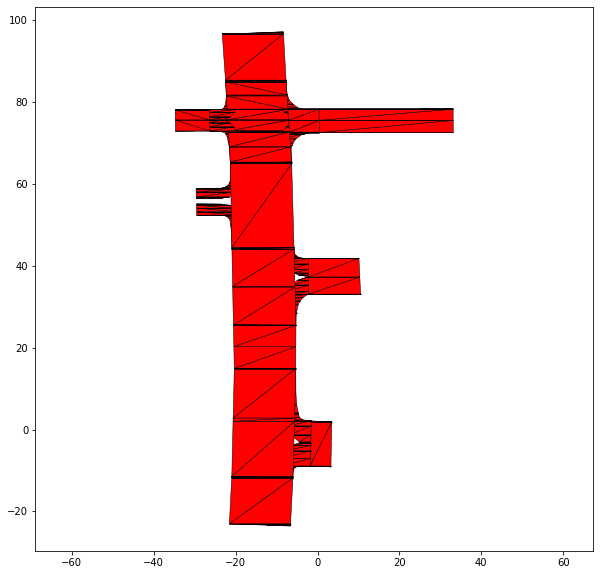

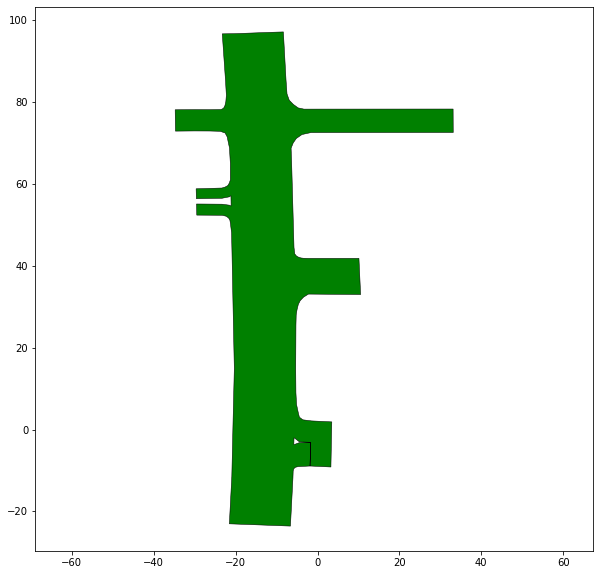

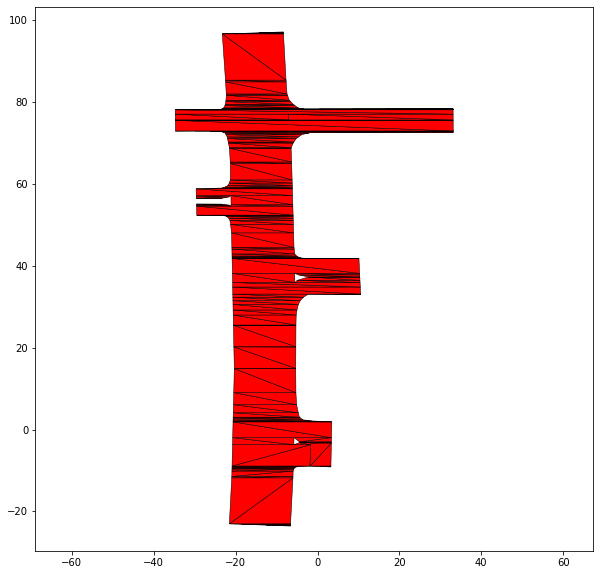

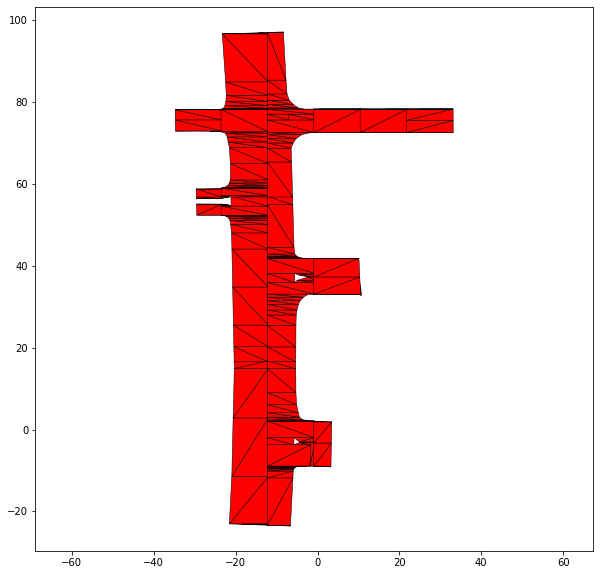

16 USA_Lanker-2_12_T-1


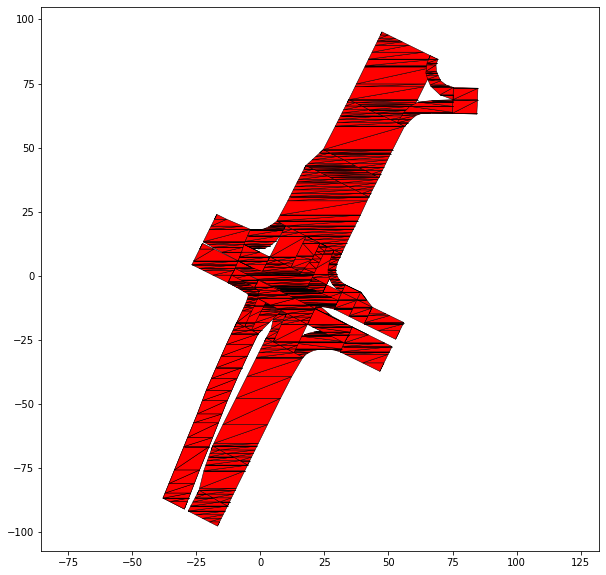

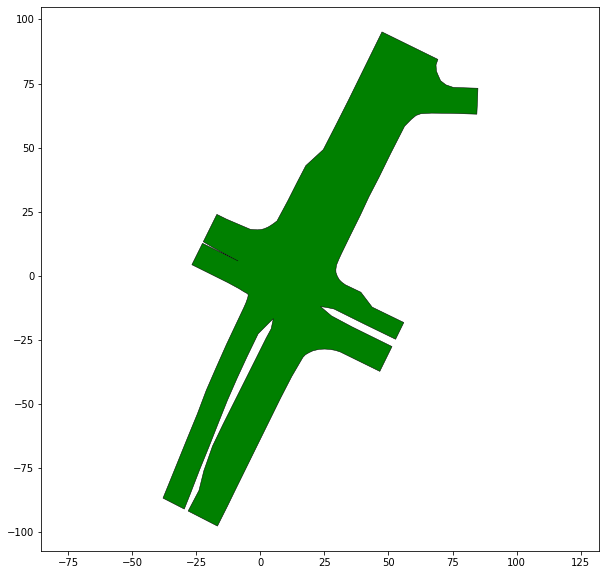

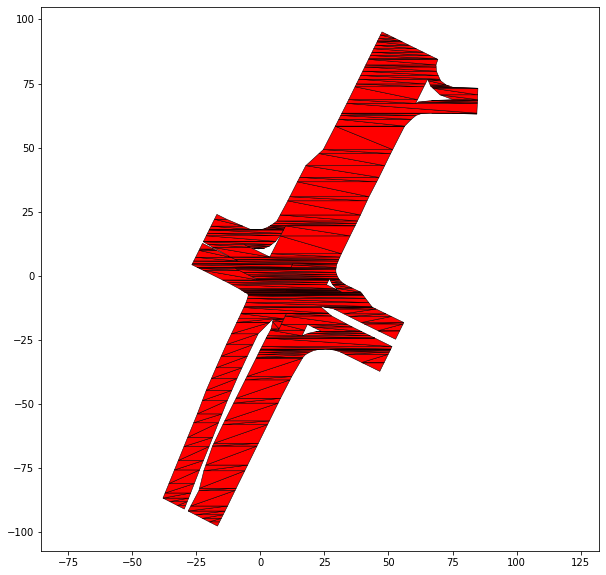

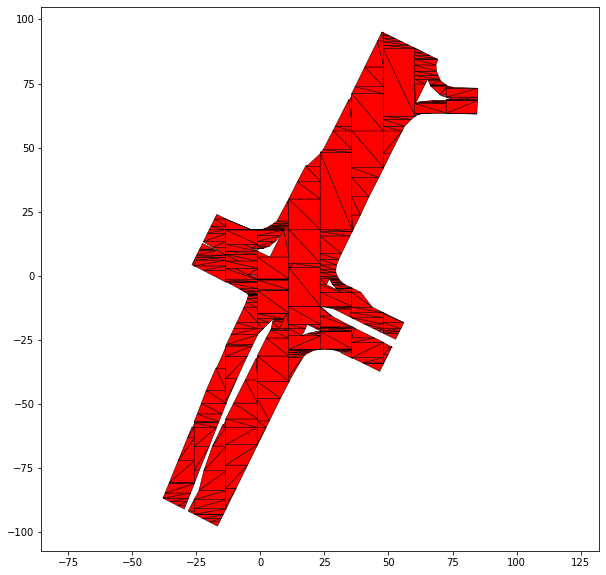

21 USA_US101-21_1_T-1


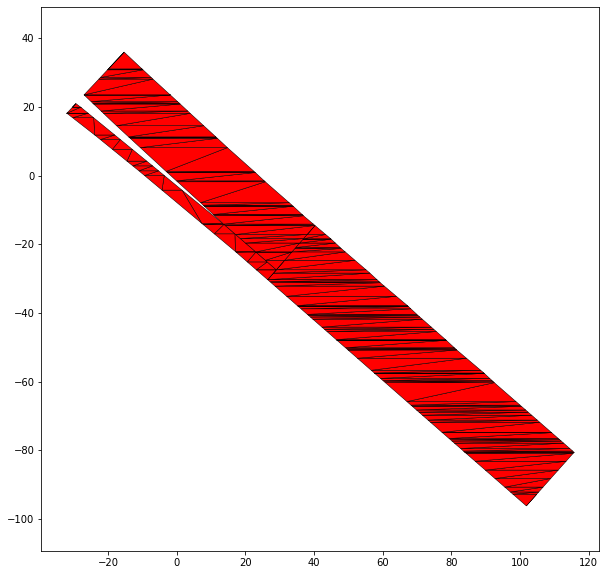

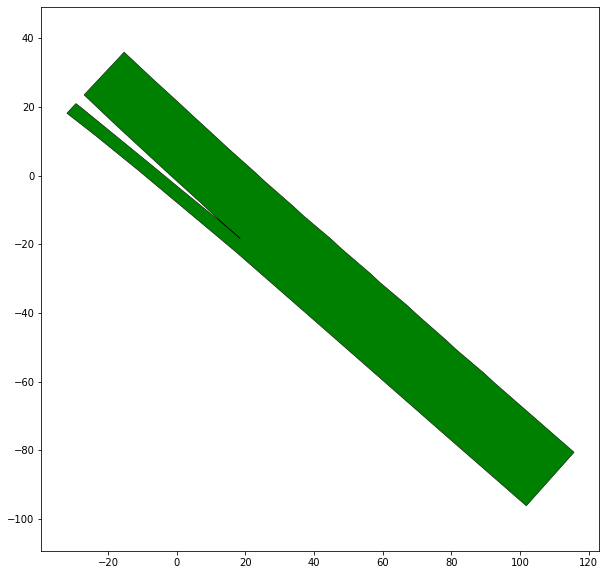

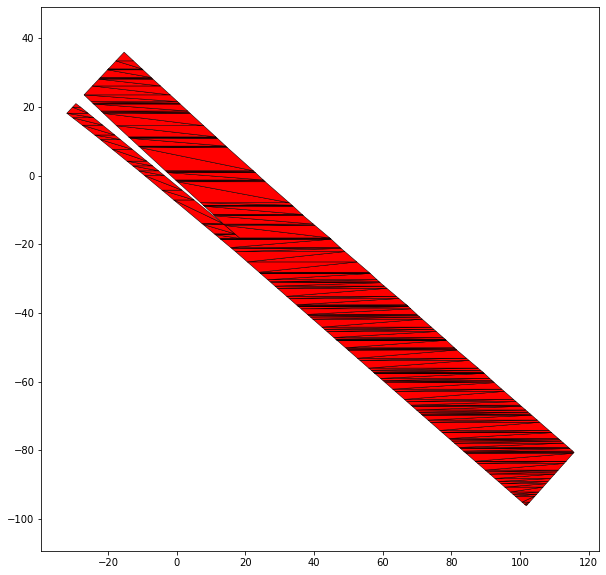

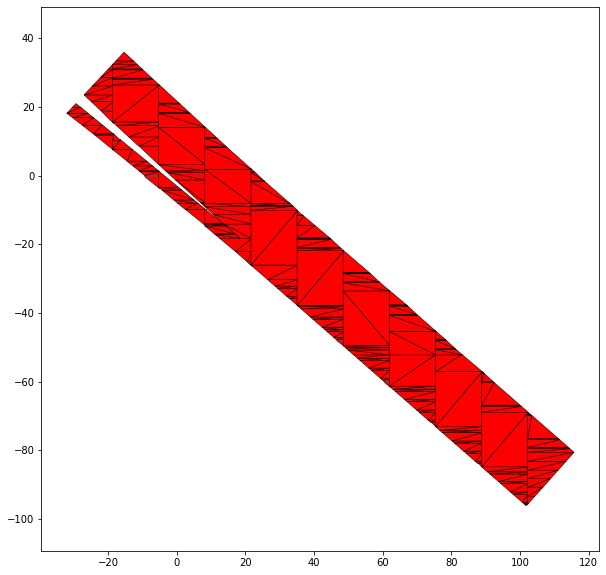

35 USA_Lanker-2_11_T-1


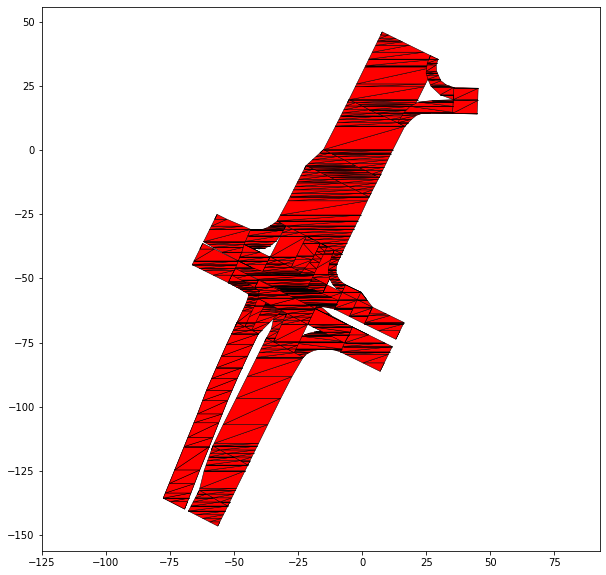

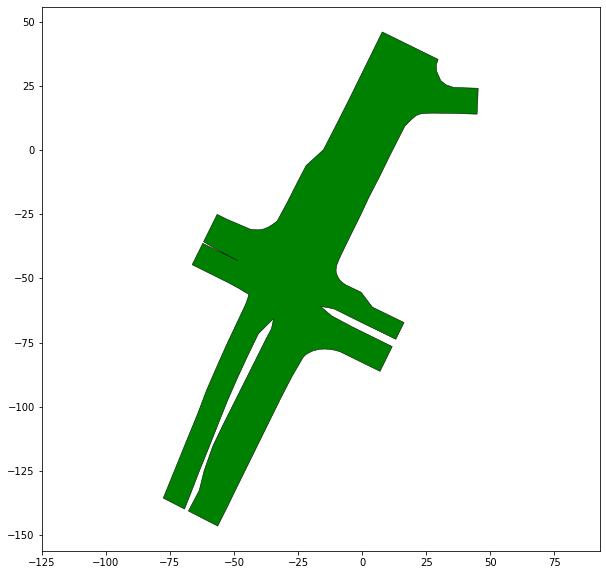

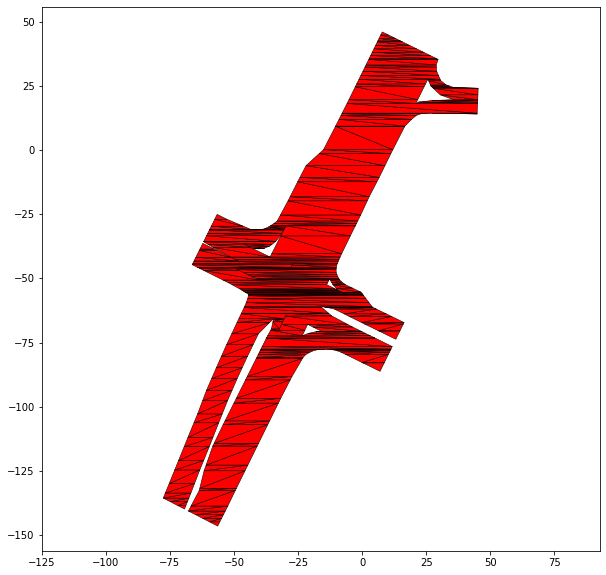

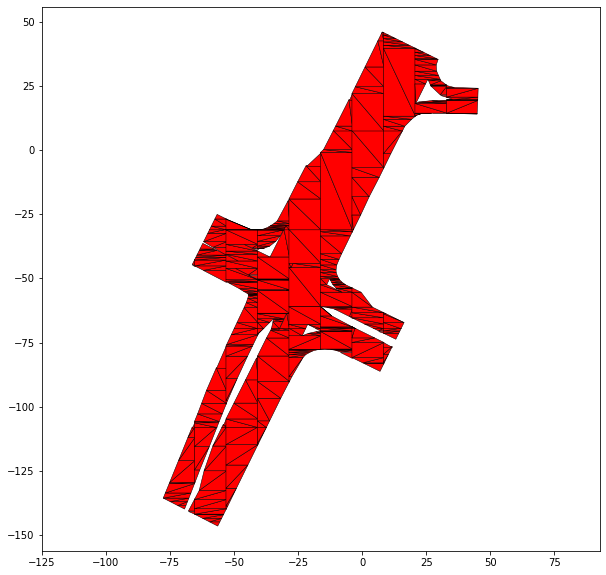

40 CHN_Sha-13_2_T-1


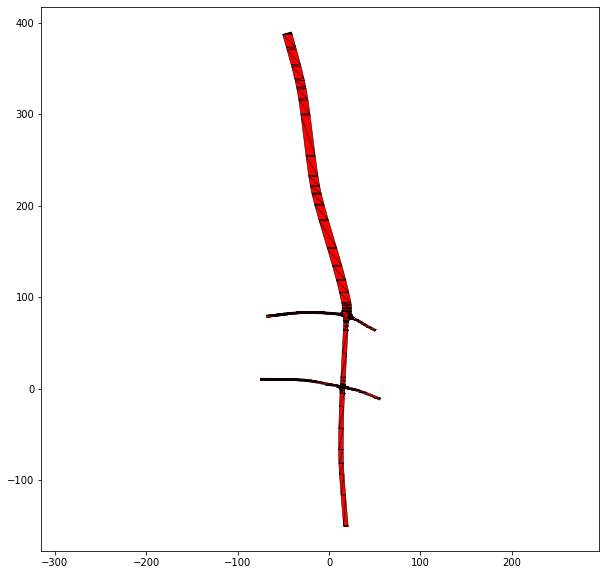

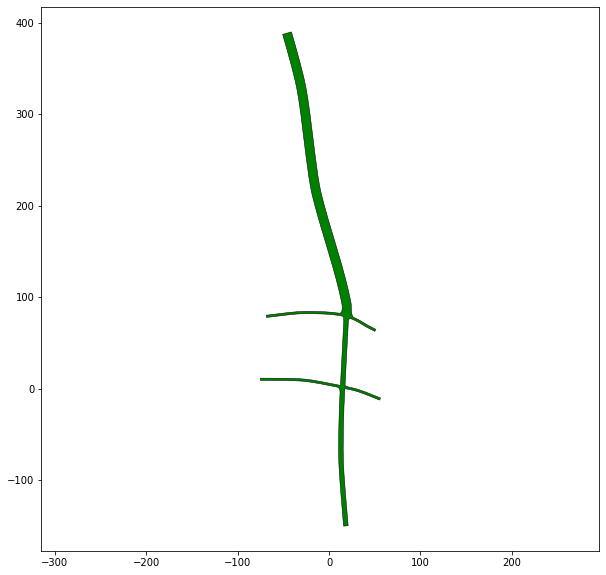

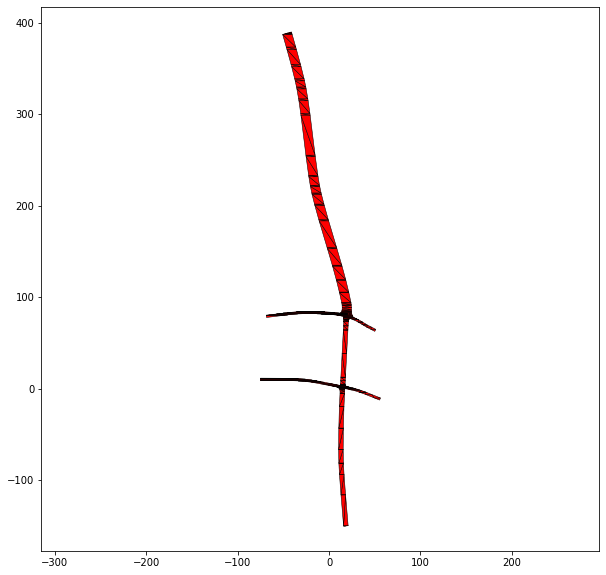

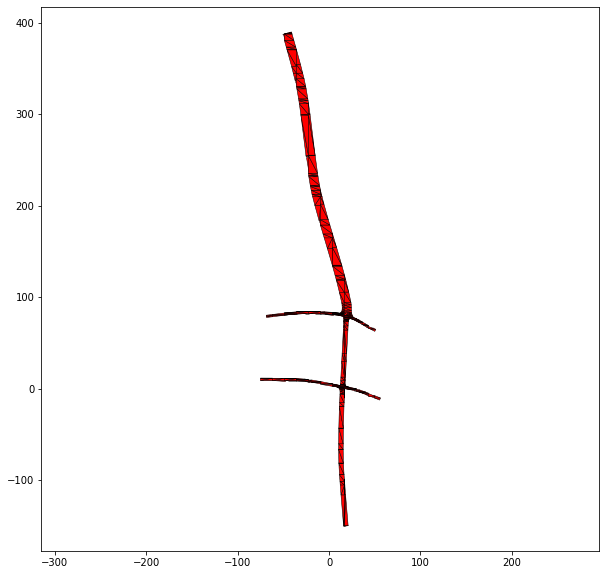

42 RUS_Bicycle-1_2_T-1


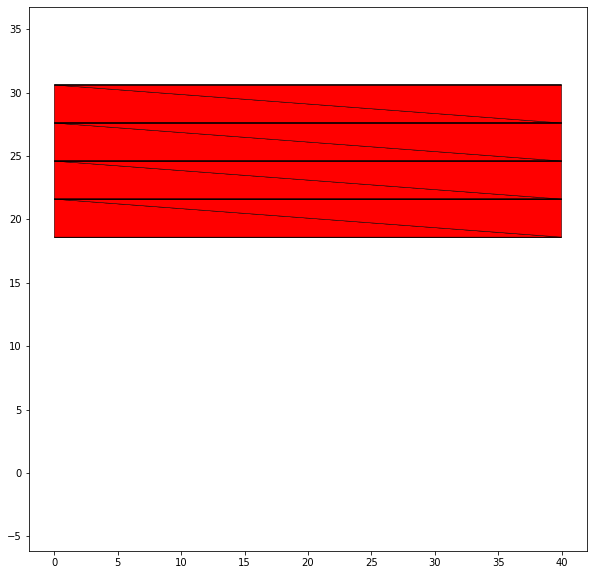

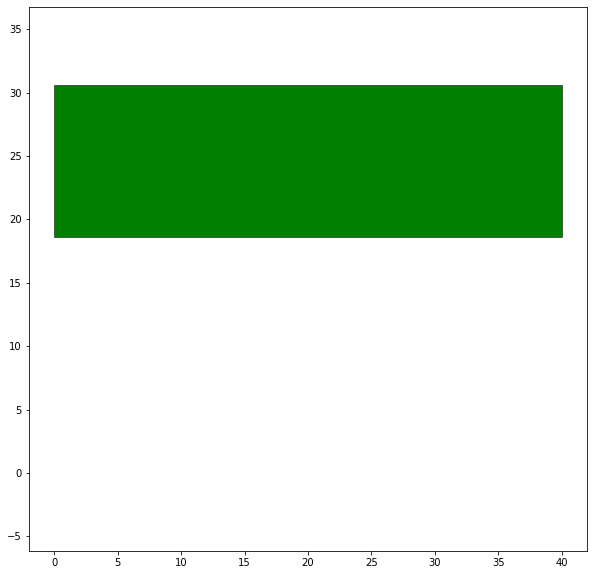

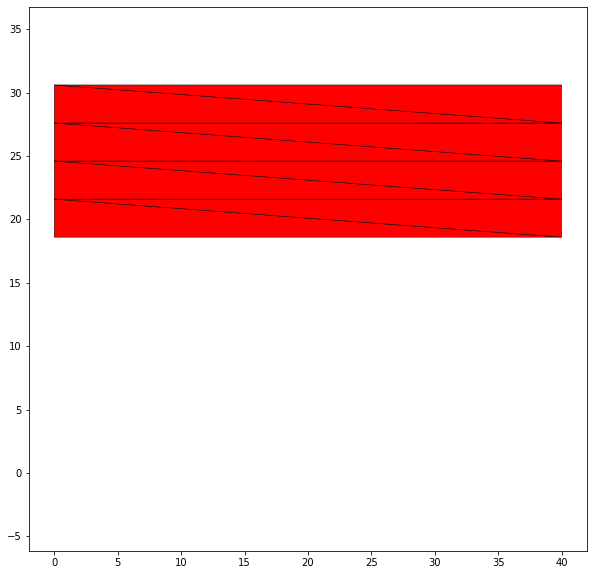

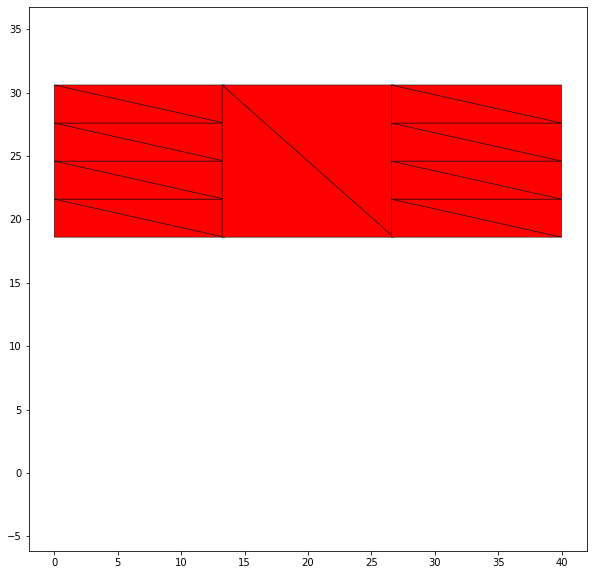

50 USA_US101-17_1_T-1


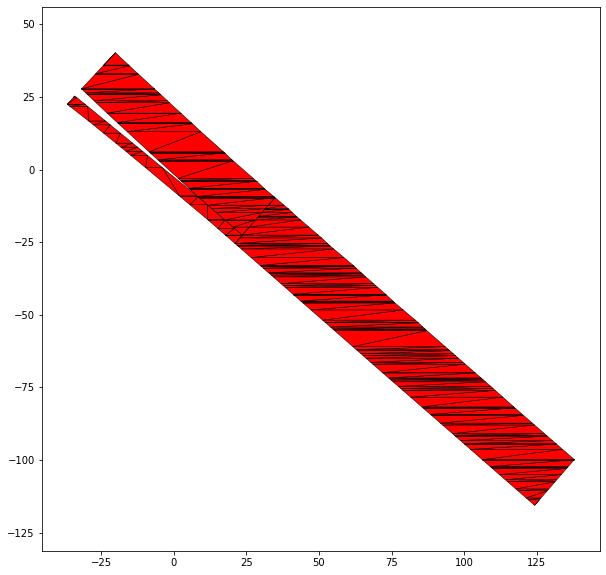

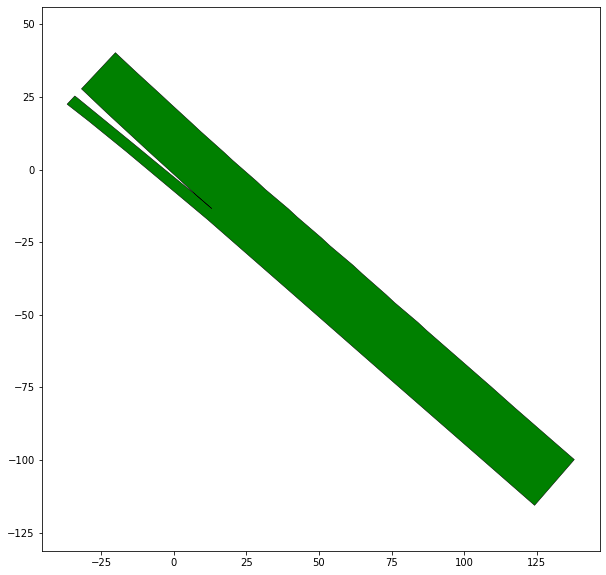

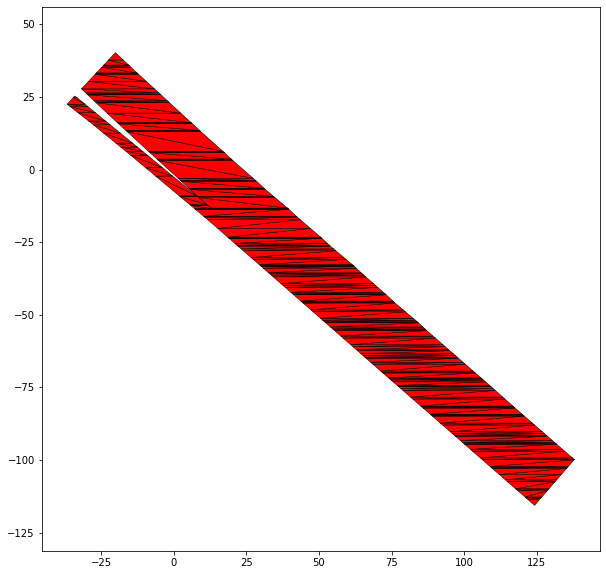

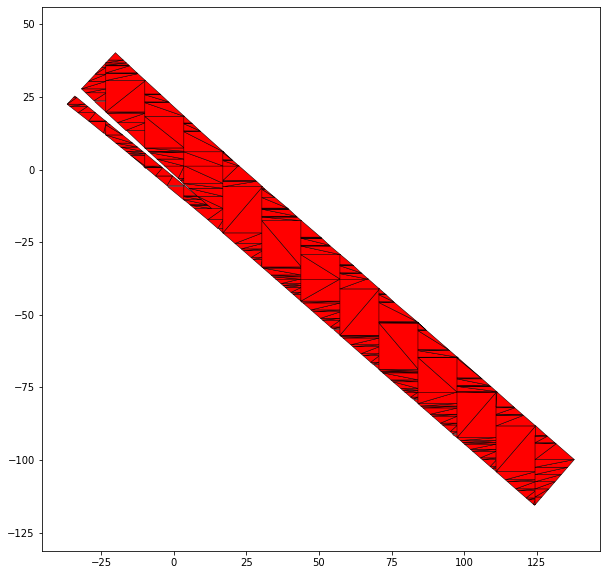

52 RUS_Bicycle-5_1_T-1


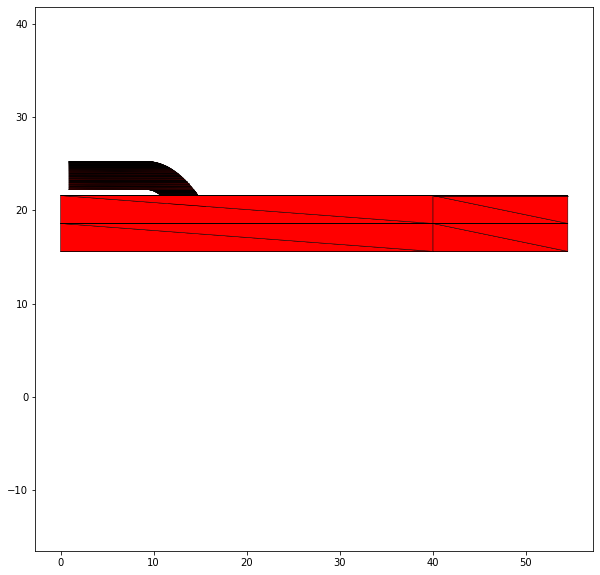

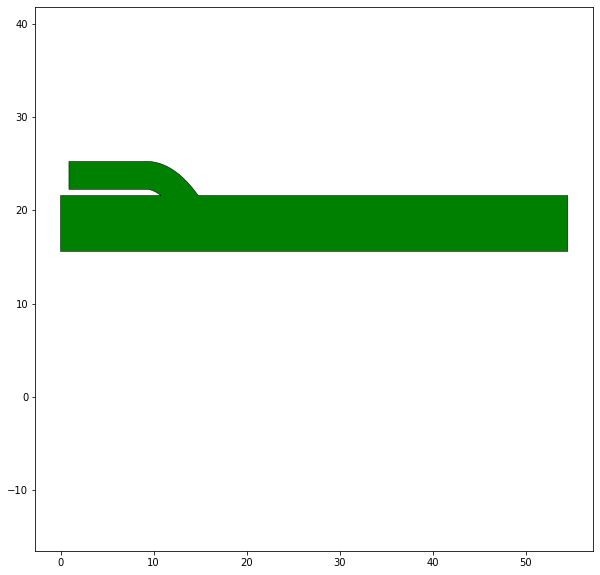

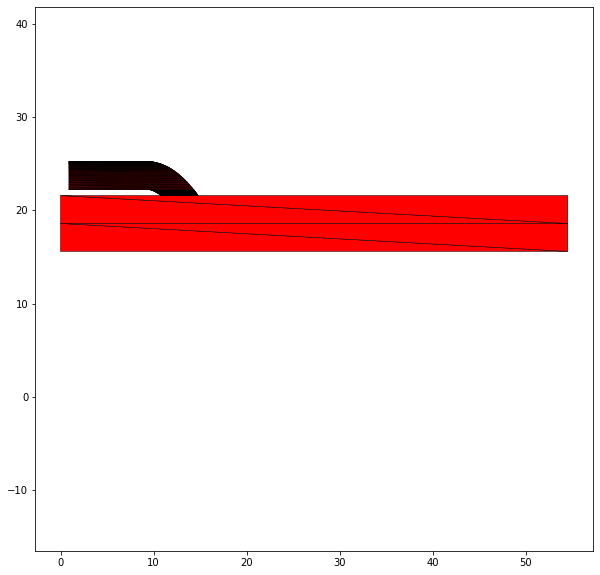

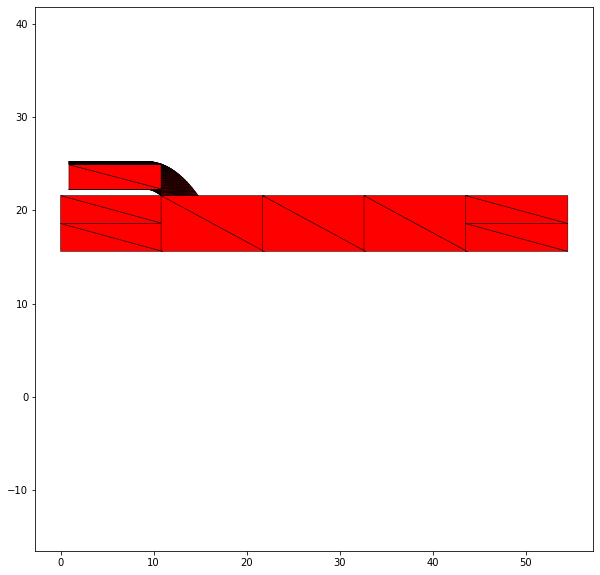

57 CHN_Sha-1_4_T-1


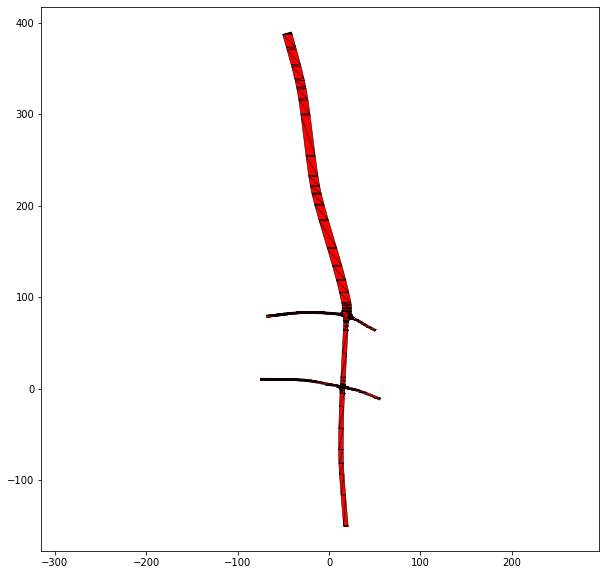

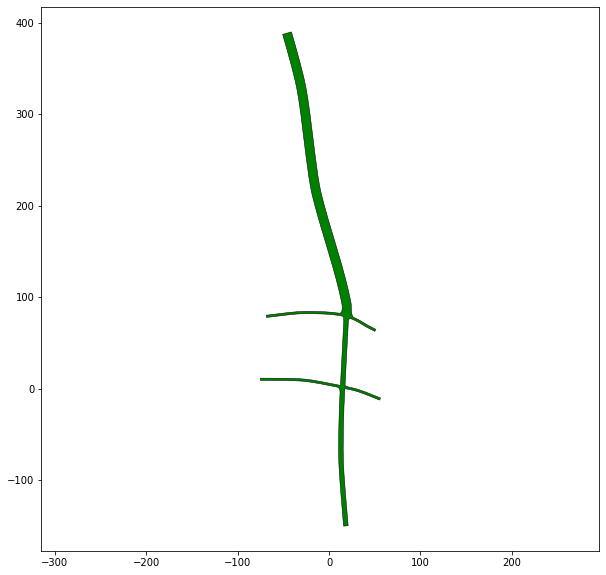

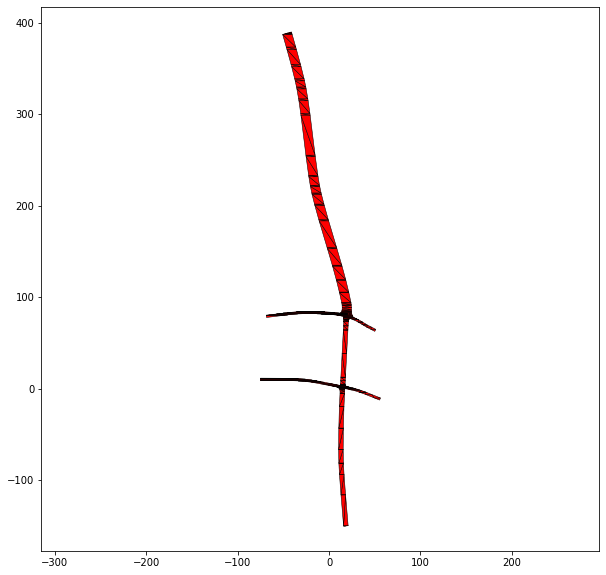

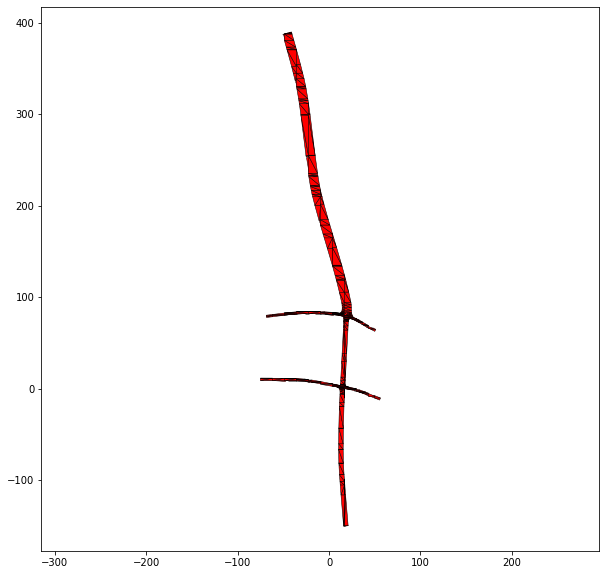

59 DEU_Muc-27_2_T-1


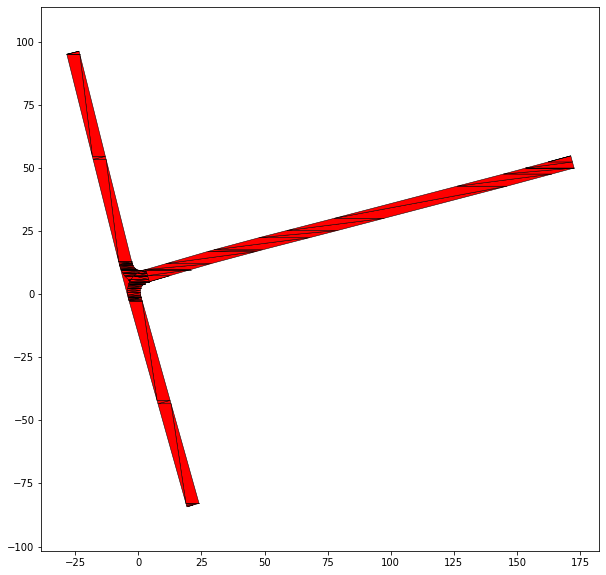

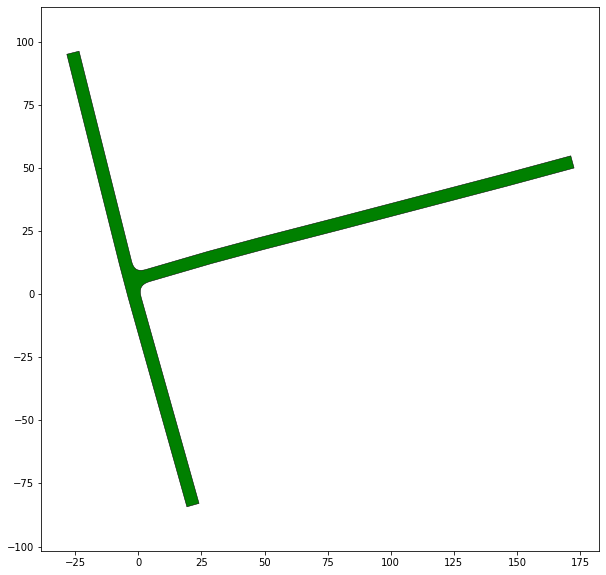

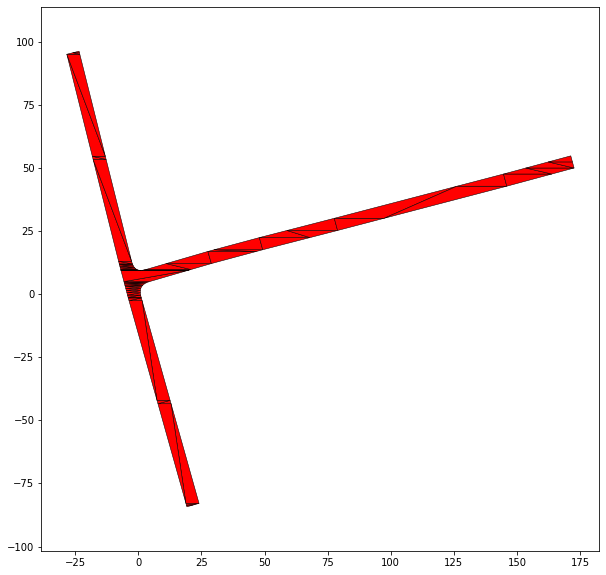

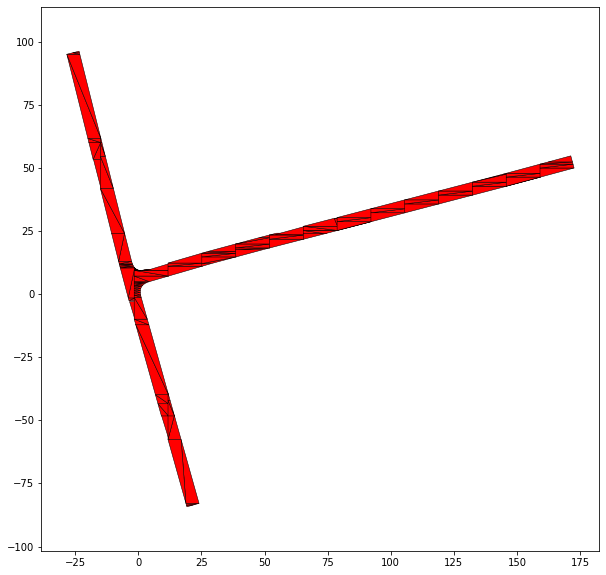

61 USA_Lanker-2_5_T-1


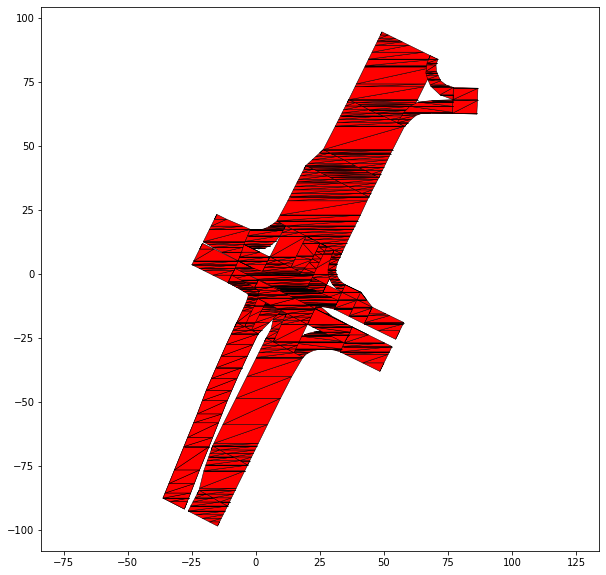

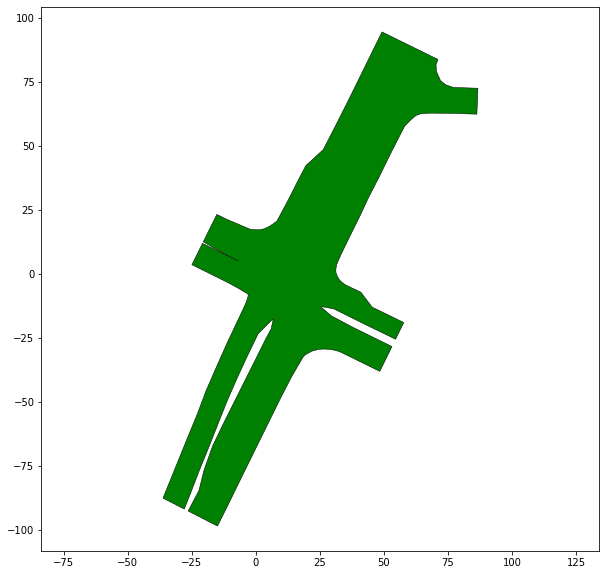

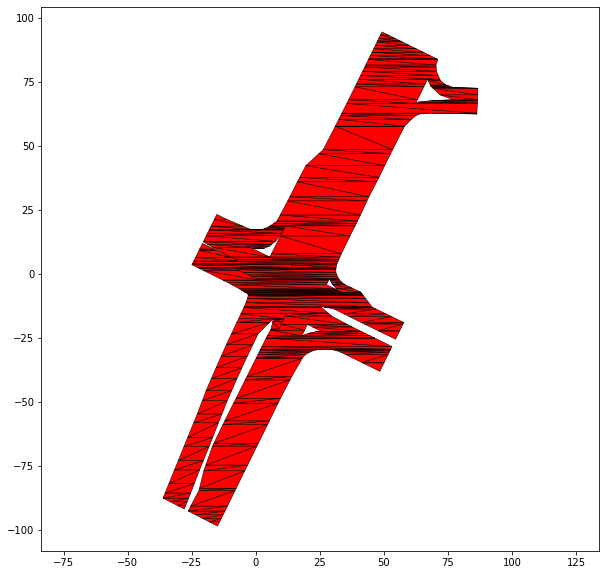

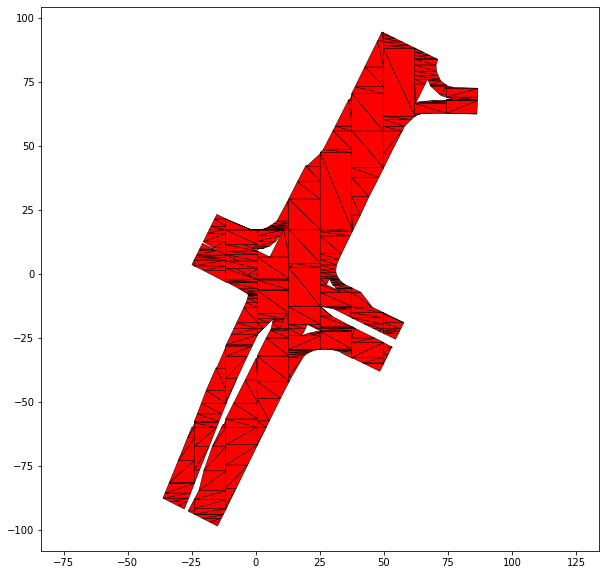

72 USA_US101-9_1_T-1


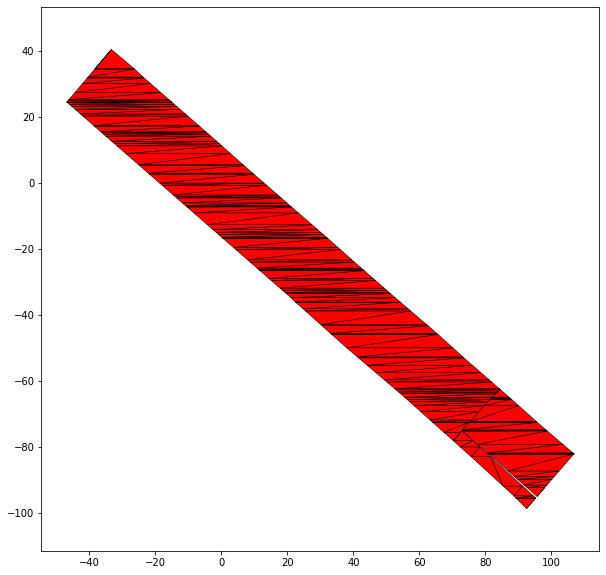

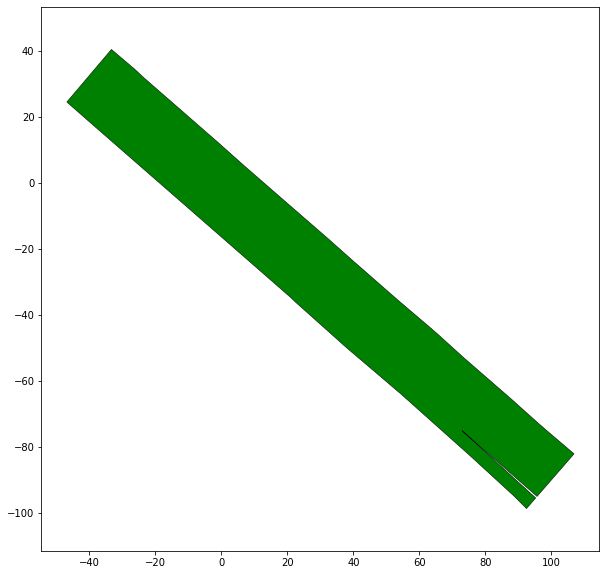

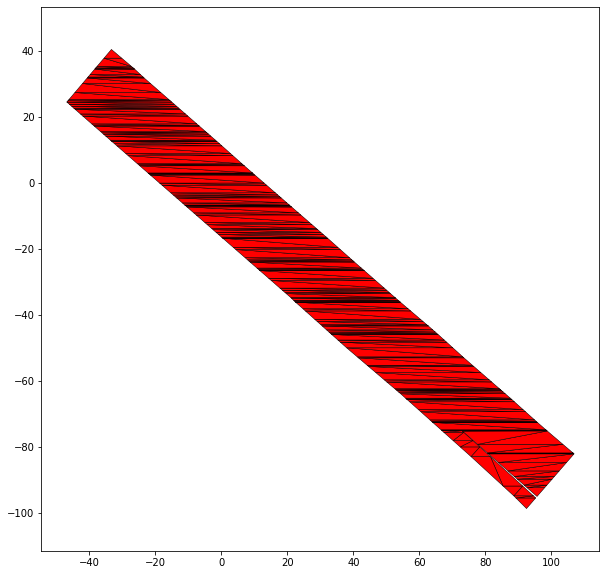

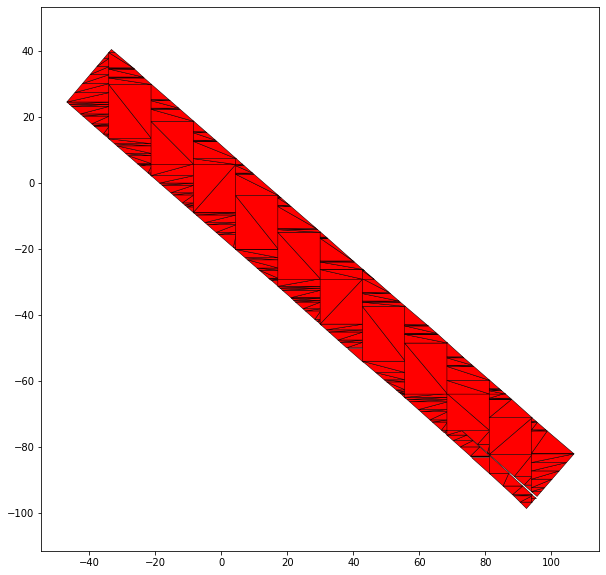

76 RUS_Bicycle-11_1_T-1


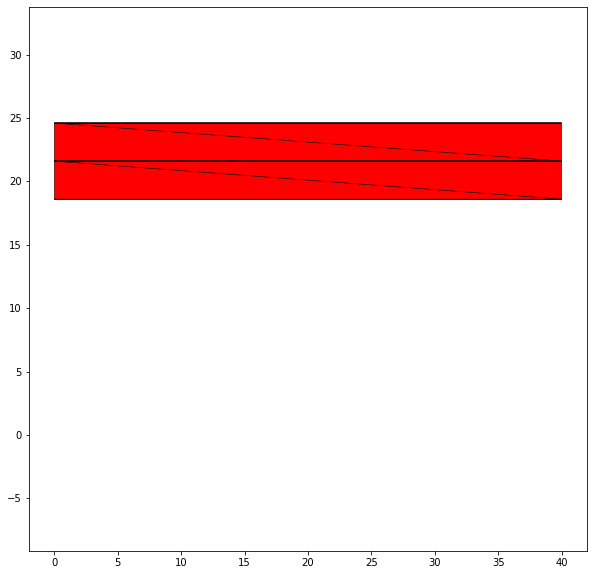

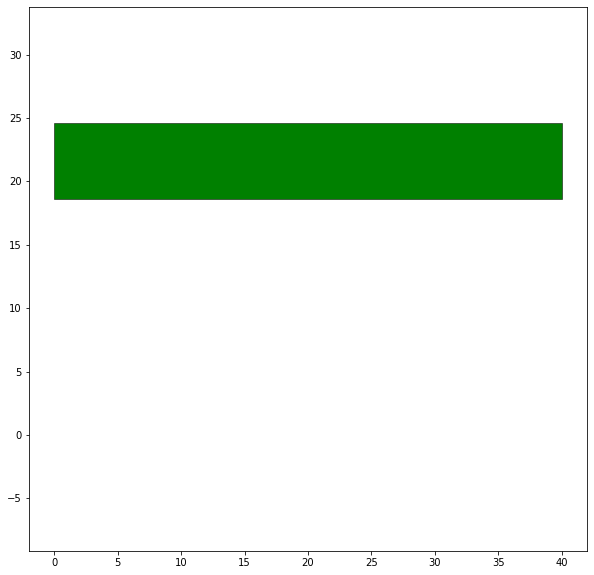

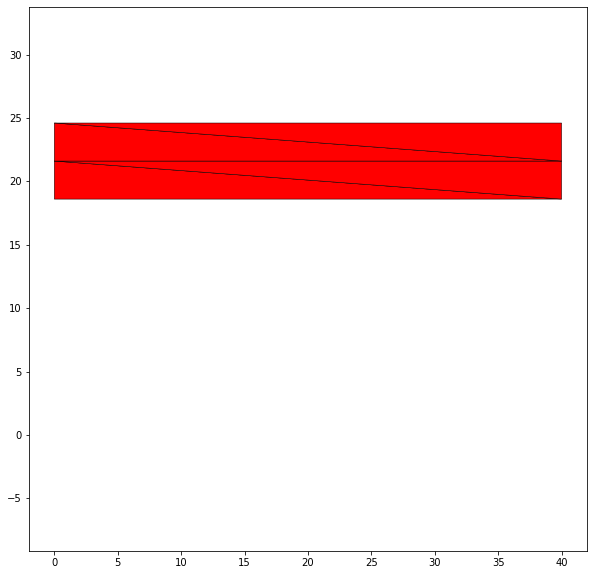

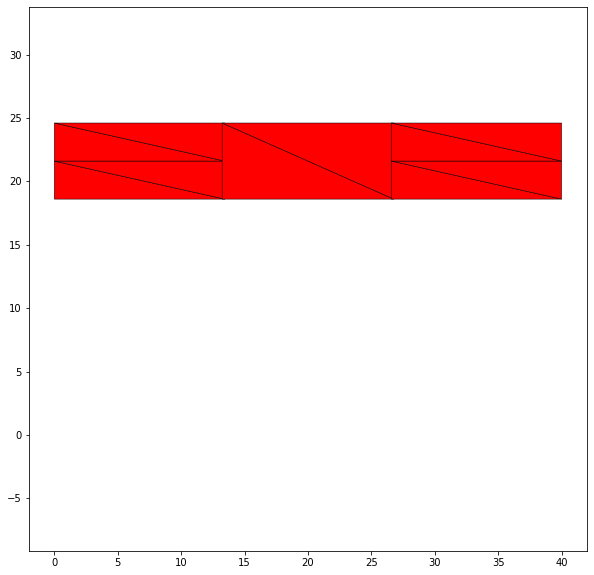

78 CHN_Sha-2_7_T-1


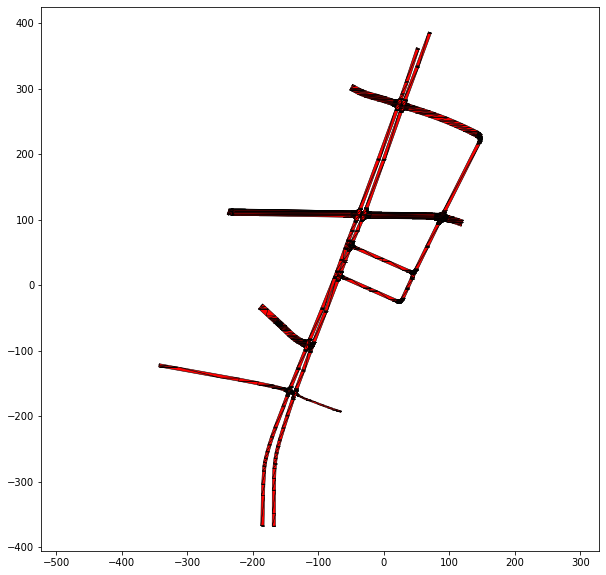

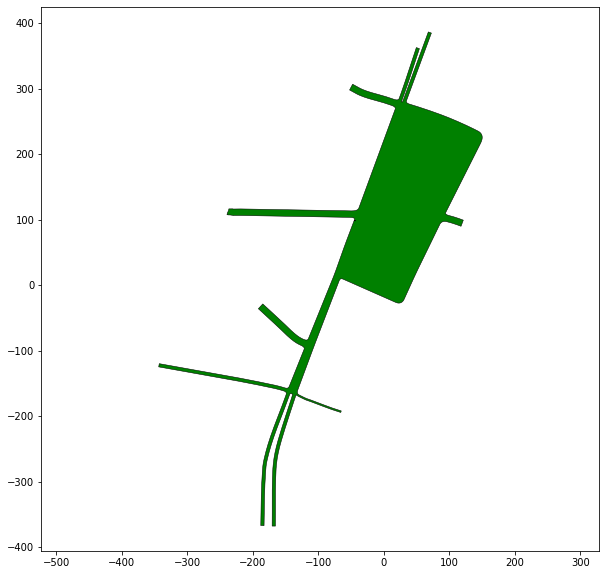

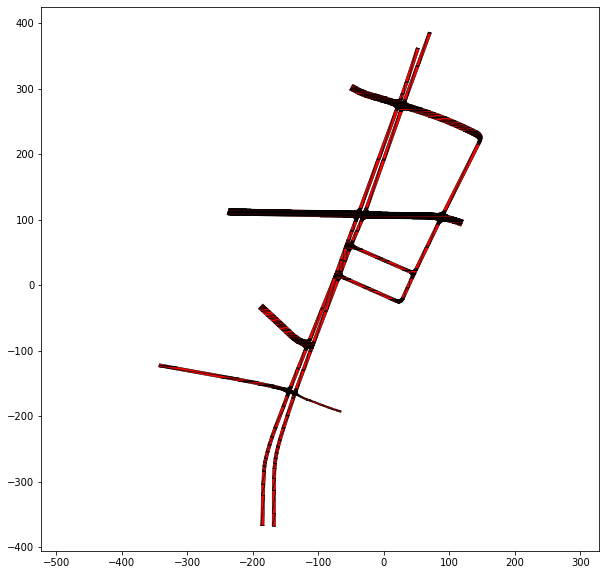

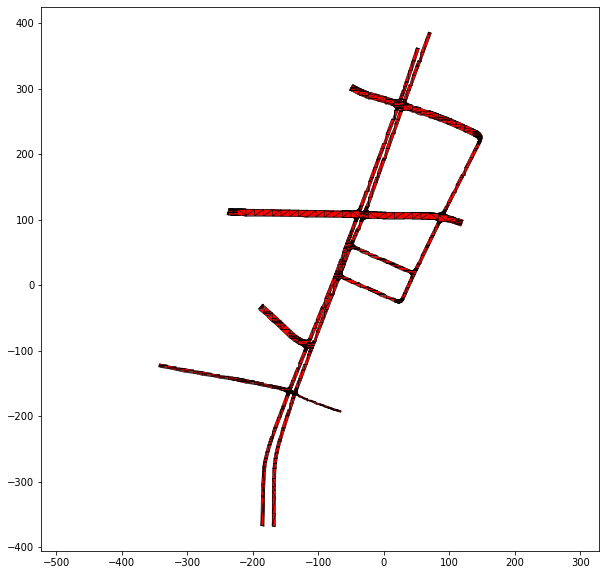

79 DEU_Muc-7_1_T-1


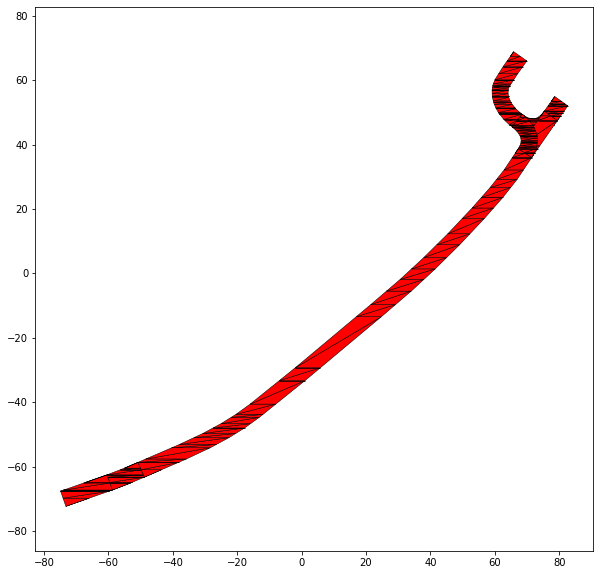

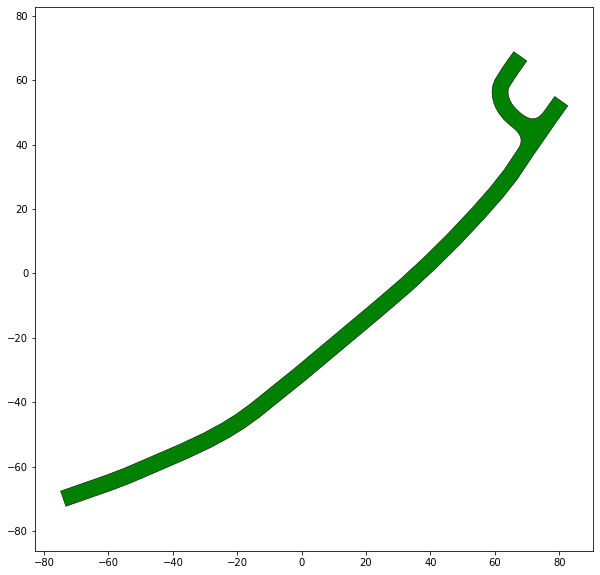

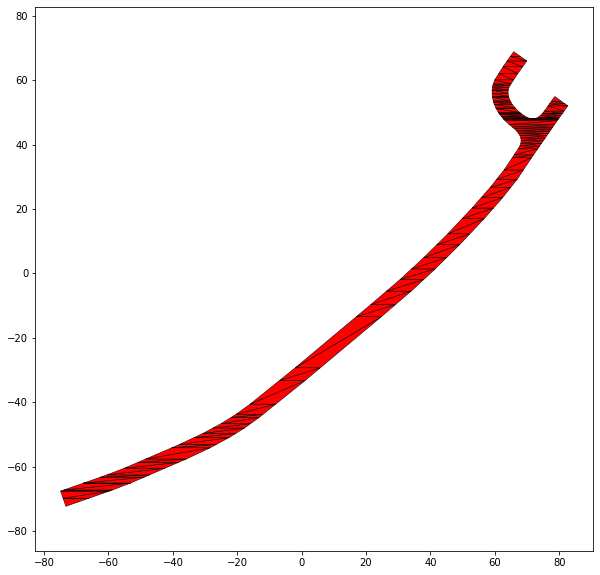

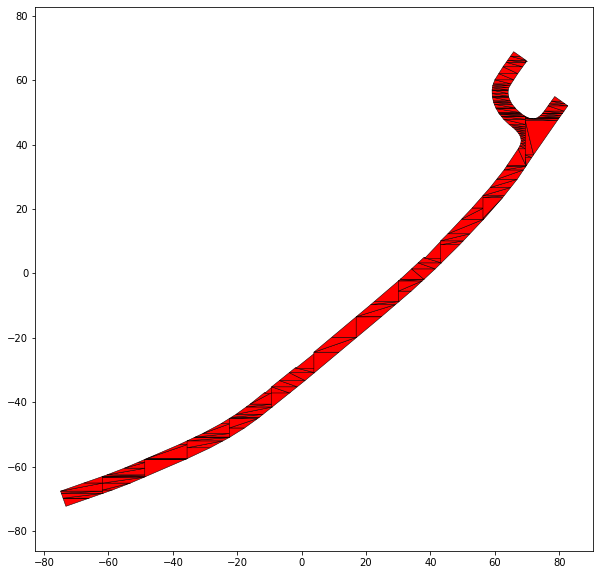

84 RUS_Bicycle-6_2_T-1


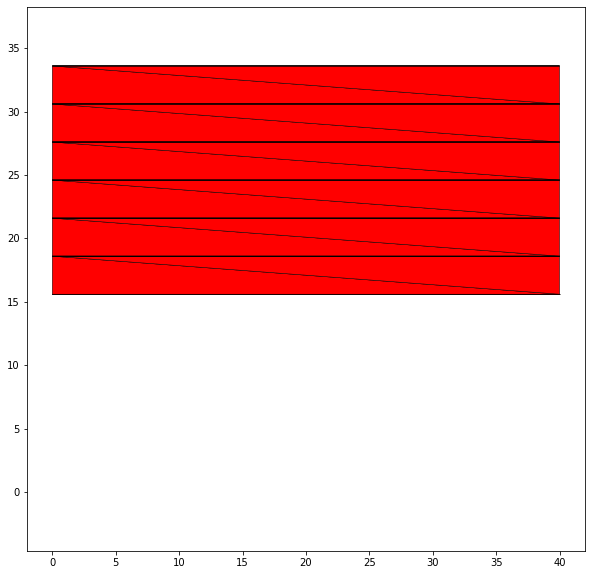

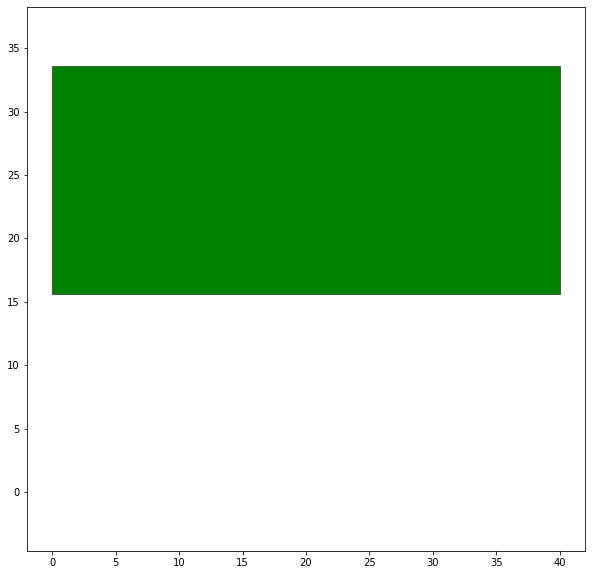

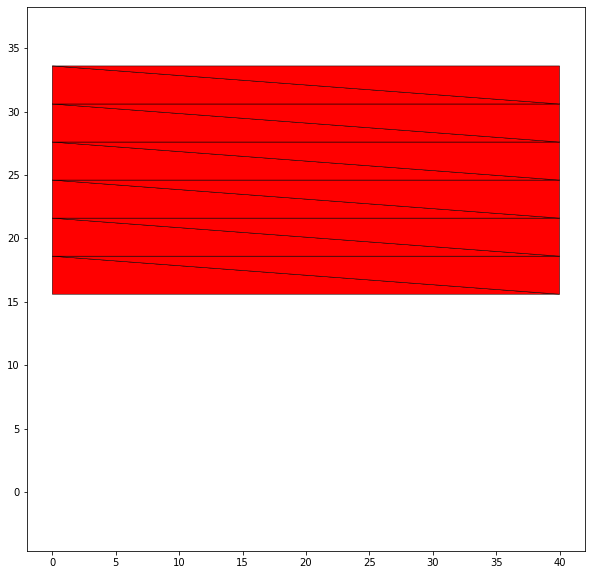

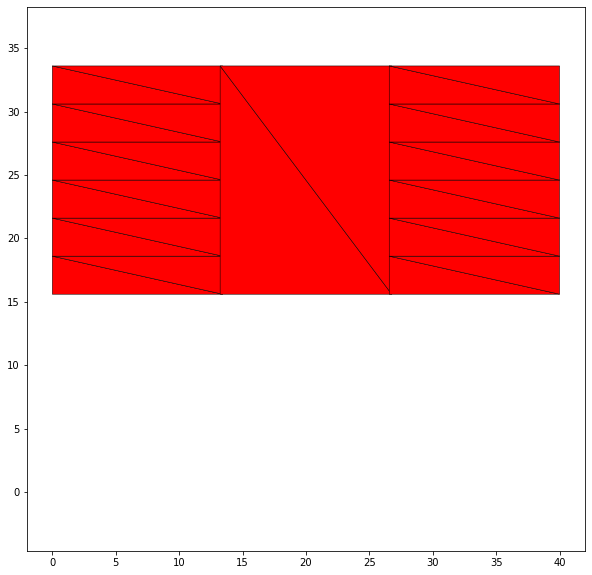

86 CHN_Sha-2_1_T-1


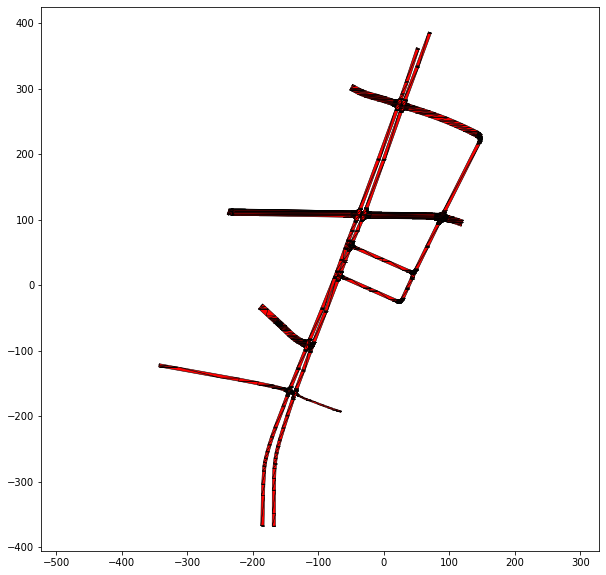

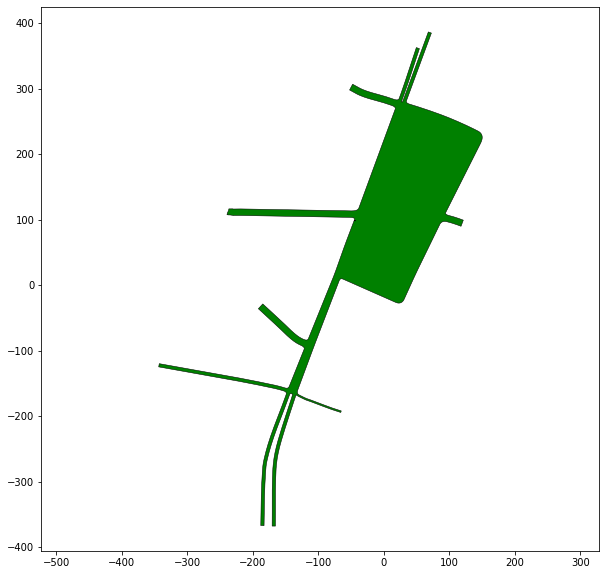

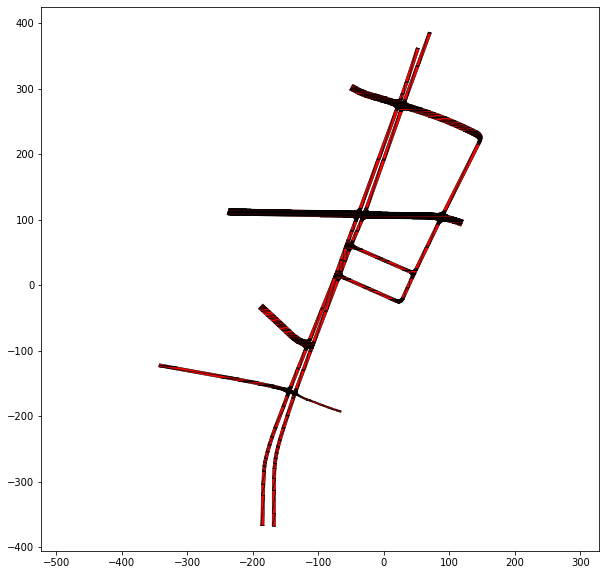

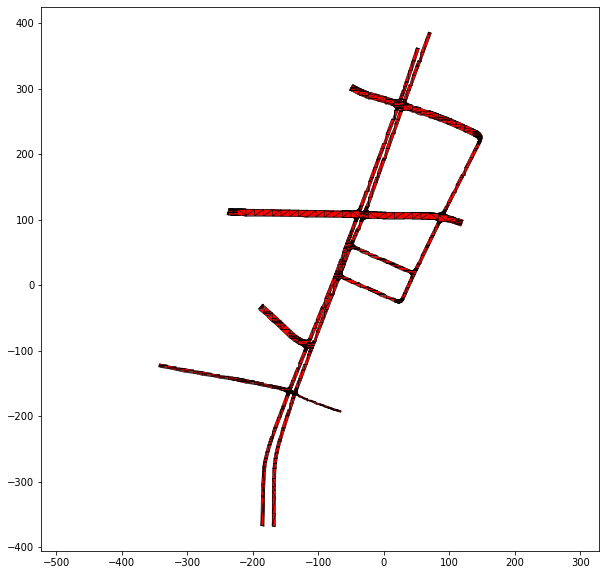

87 USA_Lanker-2_26_T-1


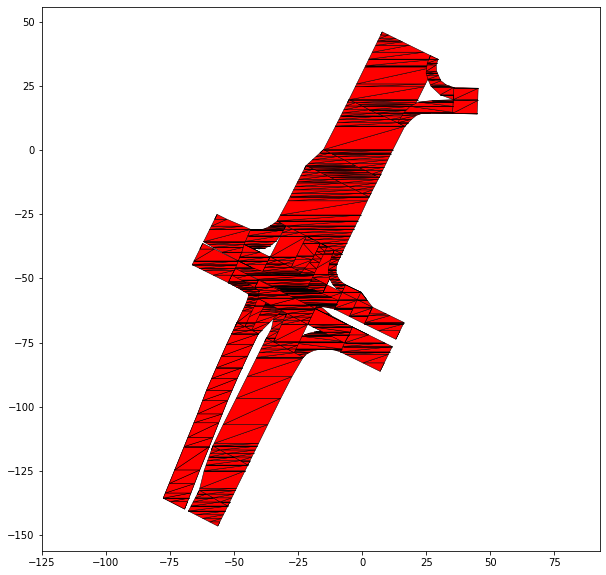

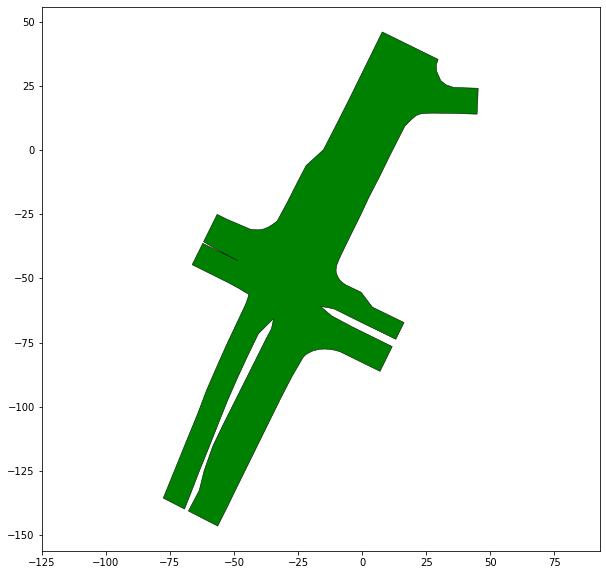

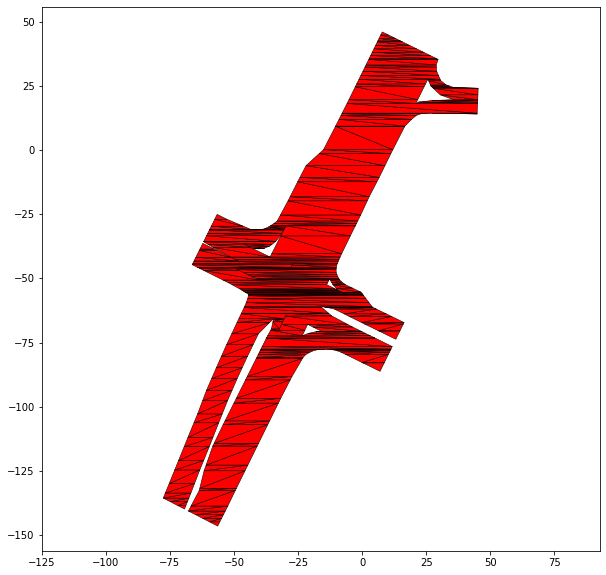

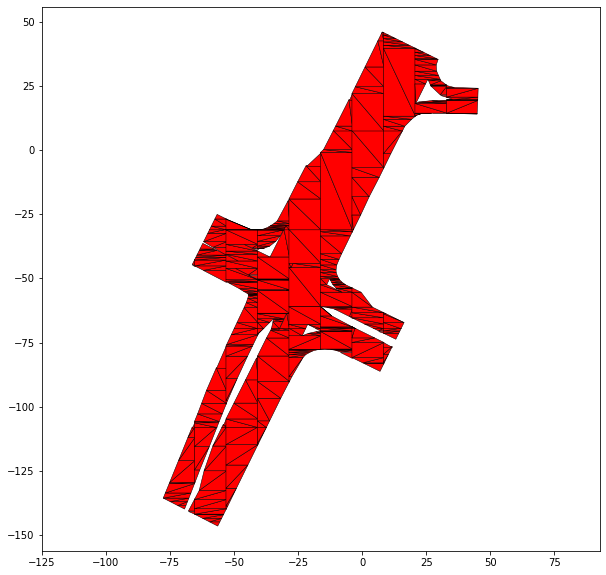

89 USA_US101-13_1_T-1


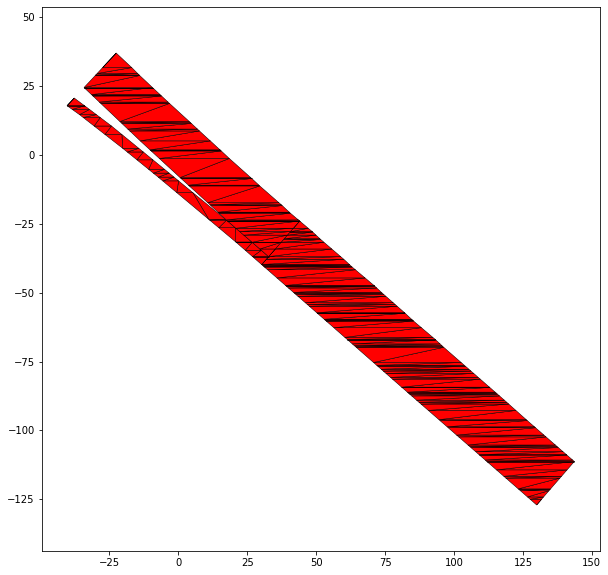

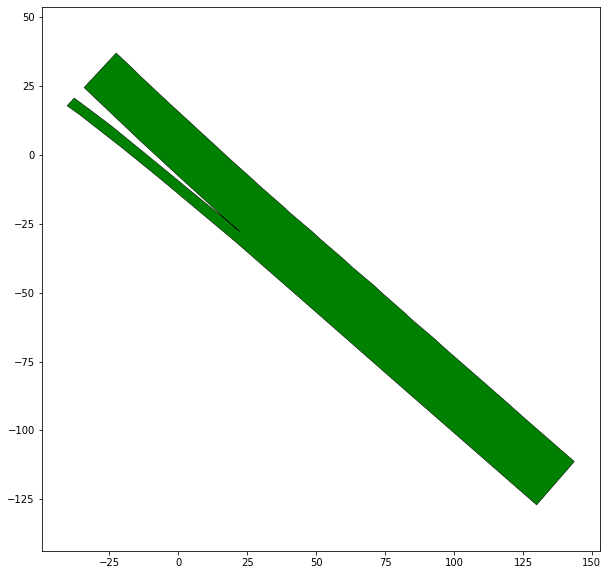

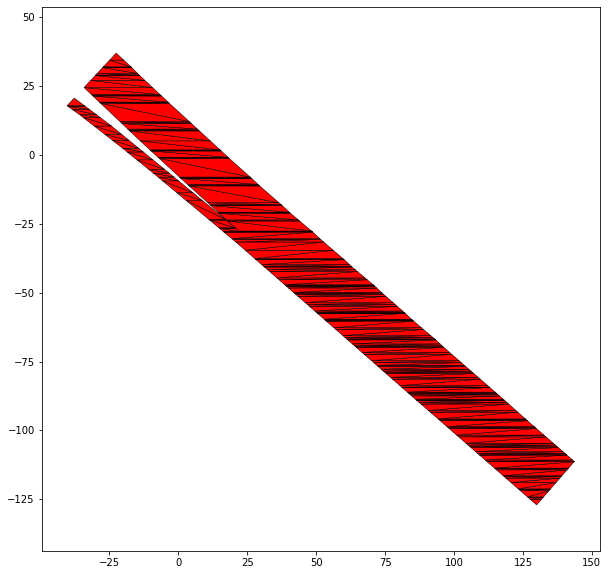

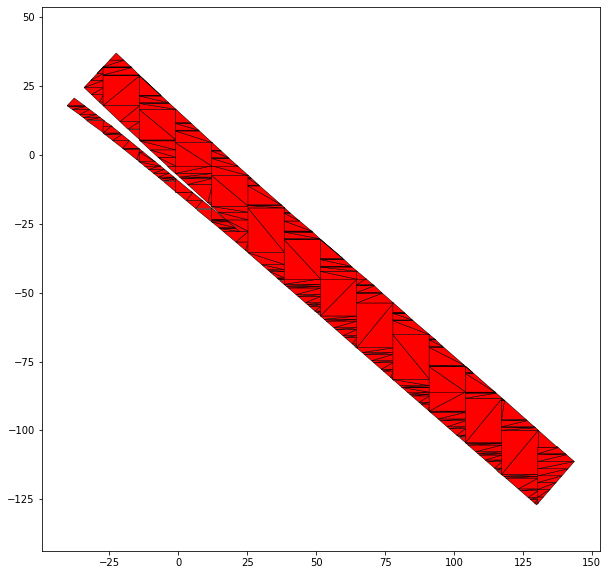

92 CHN_Sha-4_7_T-1


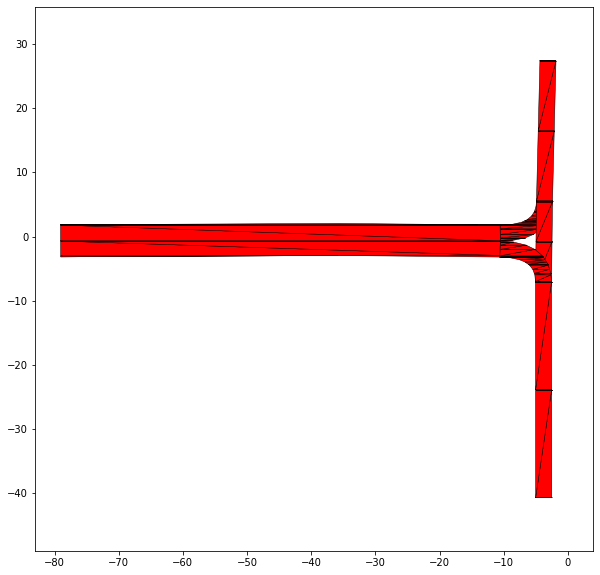

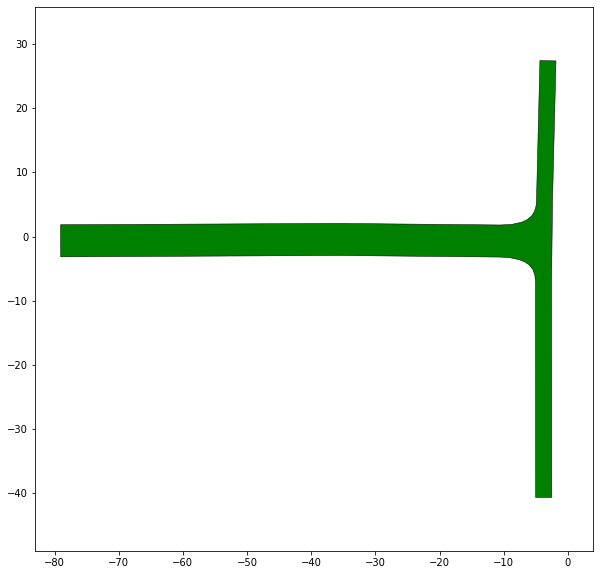

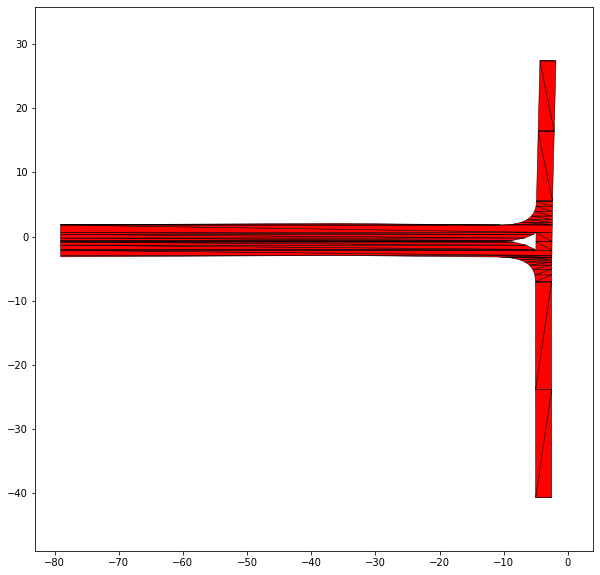

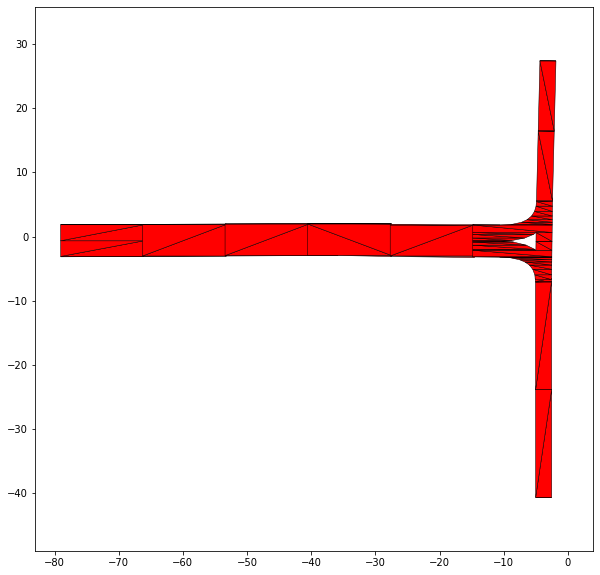

94 USA_US101-30_1_T-1


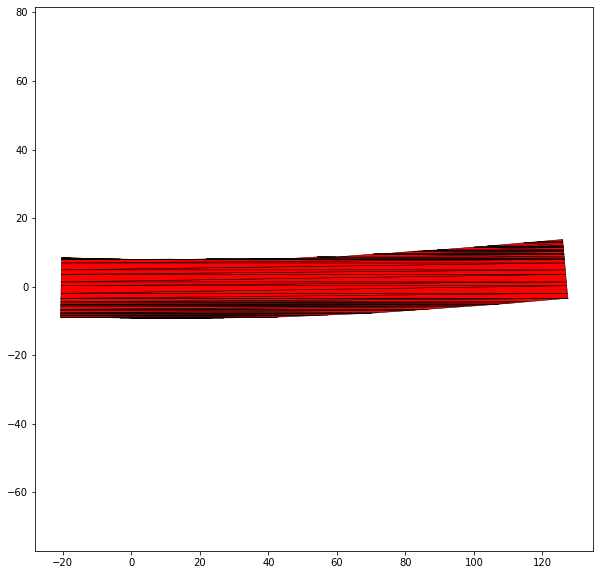

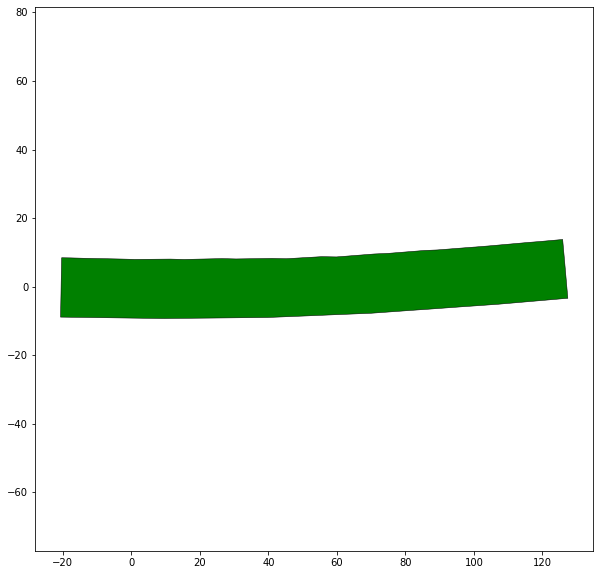

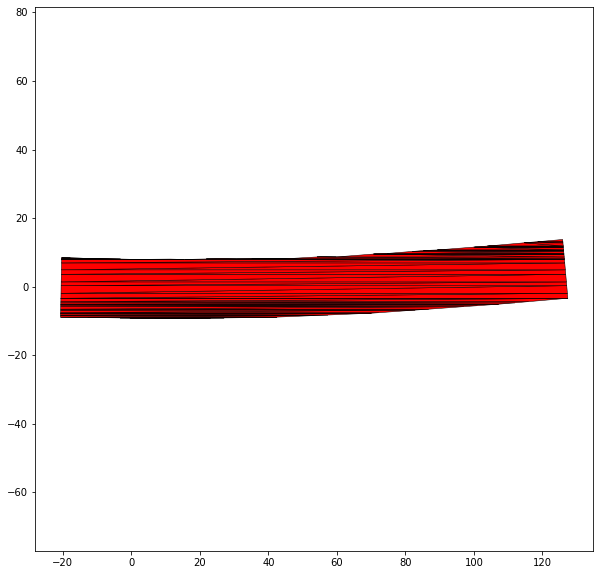

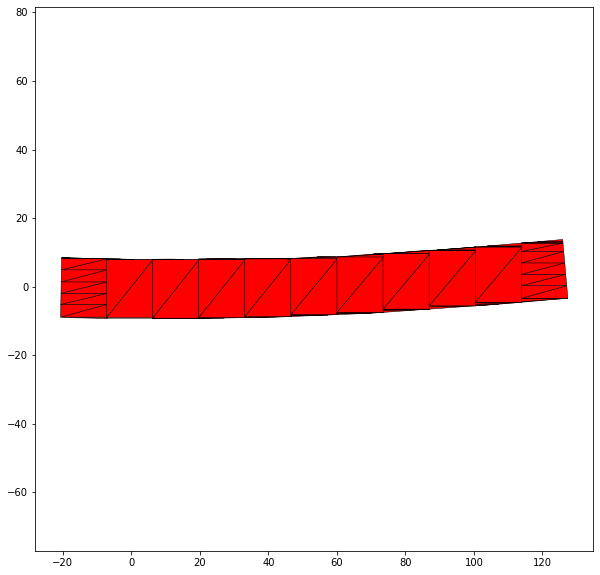

97 CHN_Sha-4_4_T-1


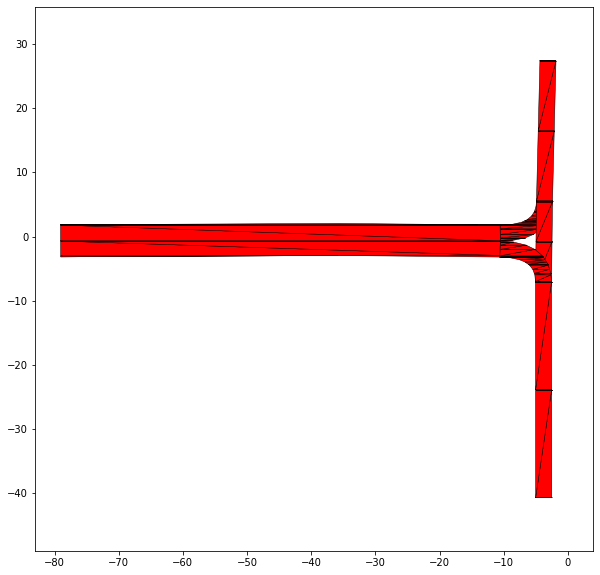

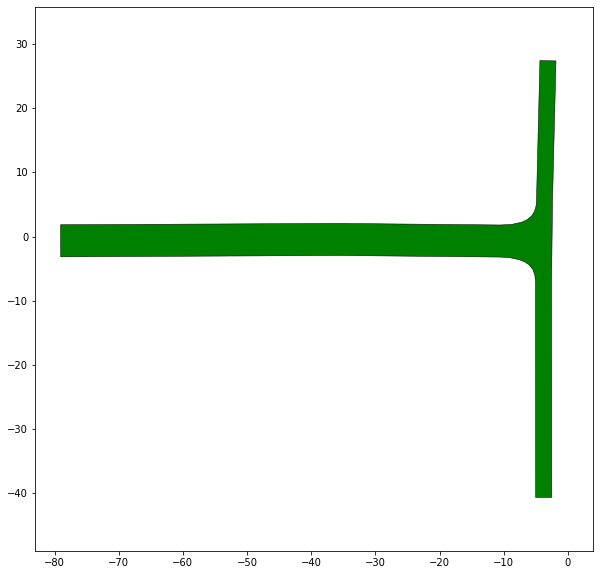

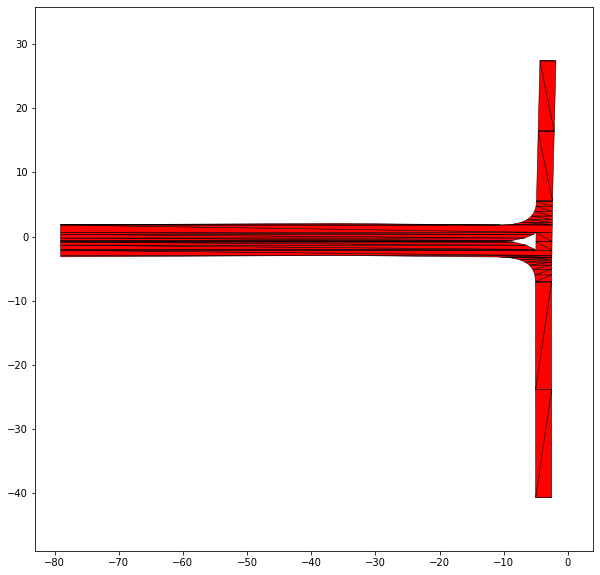

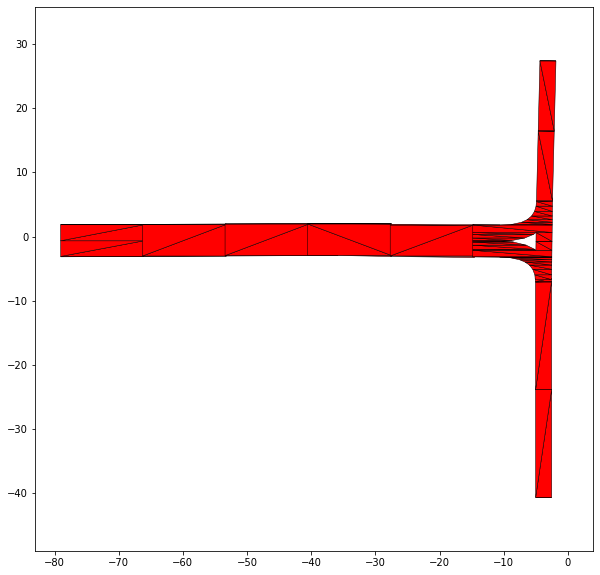

102 USA_US101-10_2_T-1


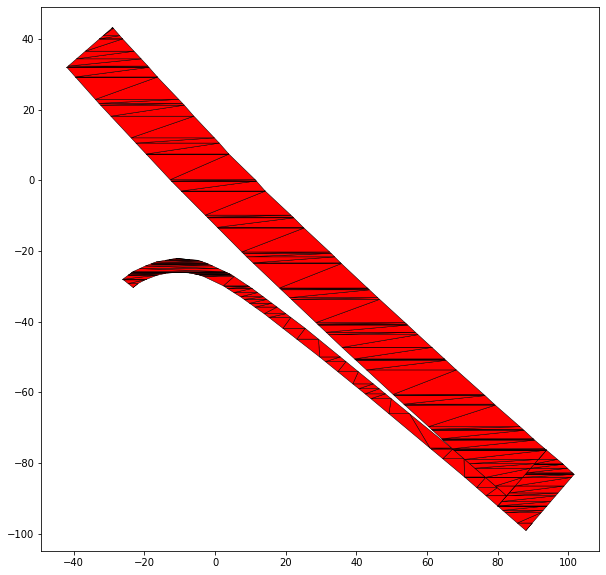

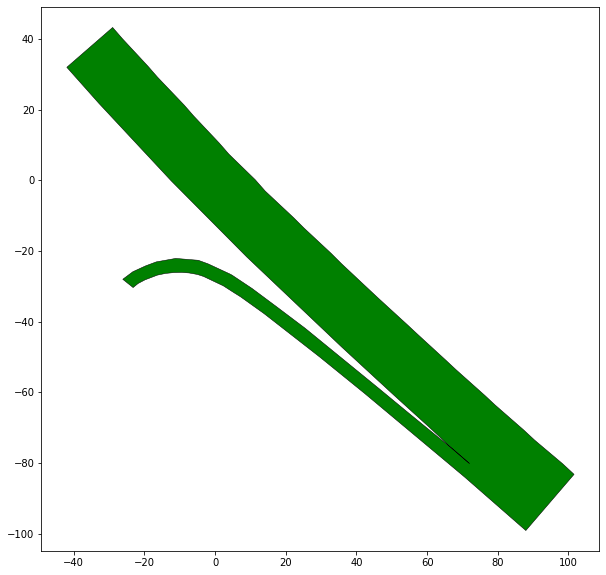

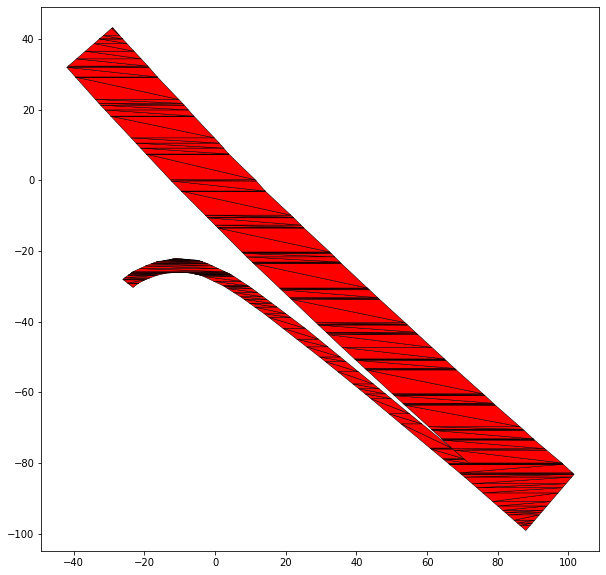

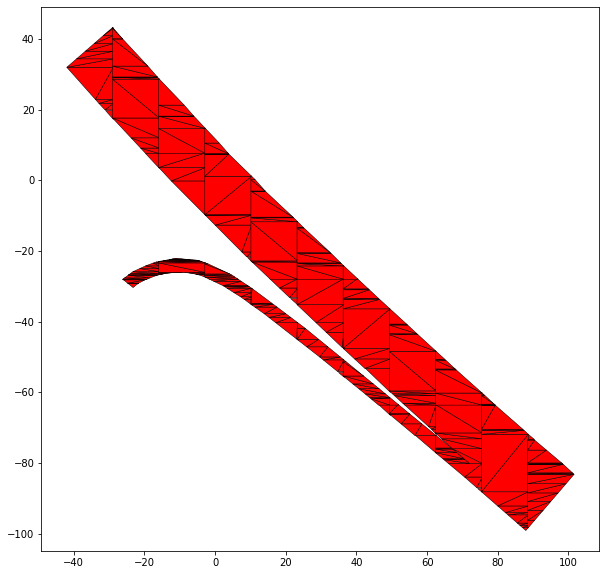

103 USA_Peach-3_4_T-1


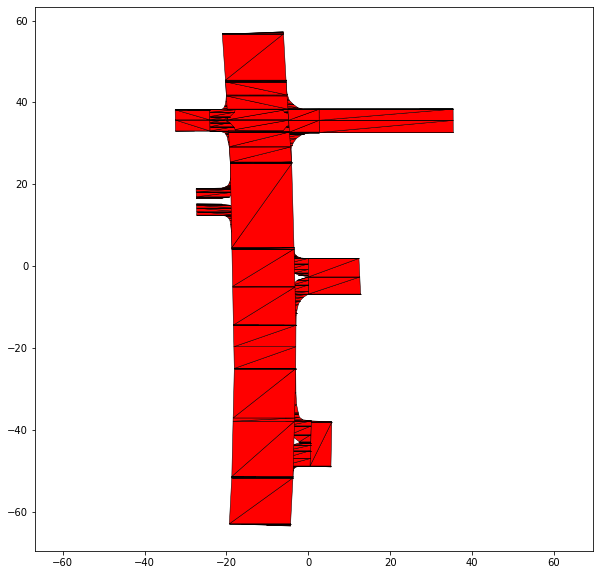

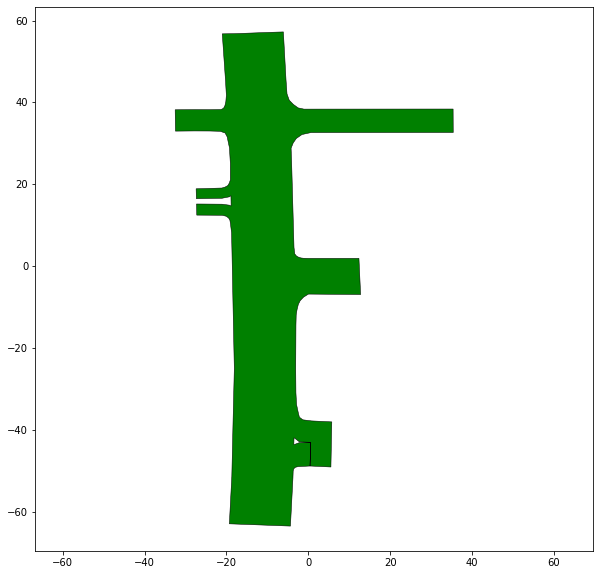

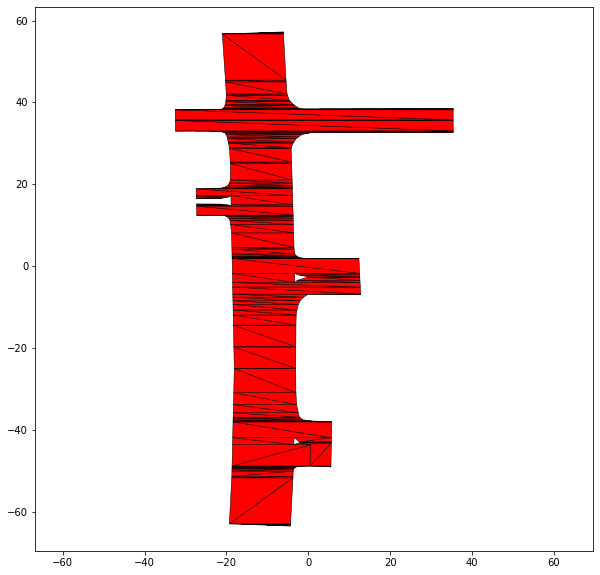

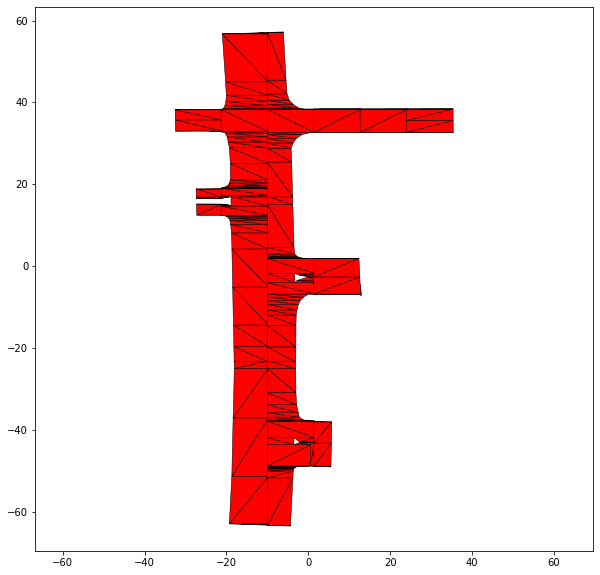

109 USA_US101-23_1_T-1


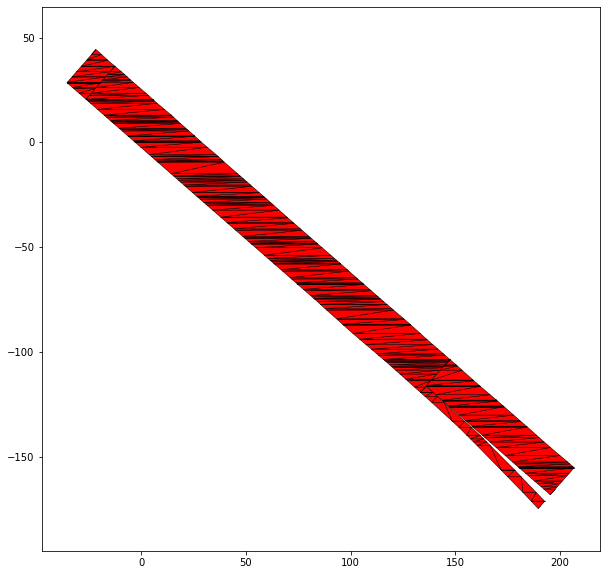

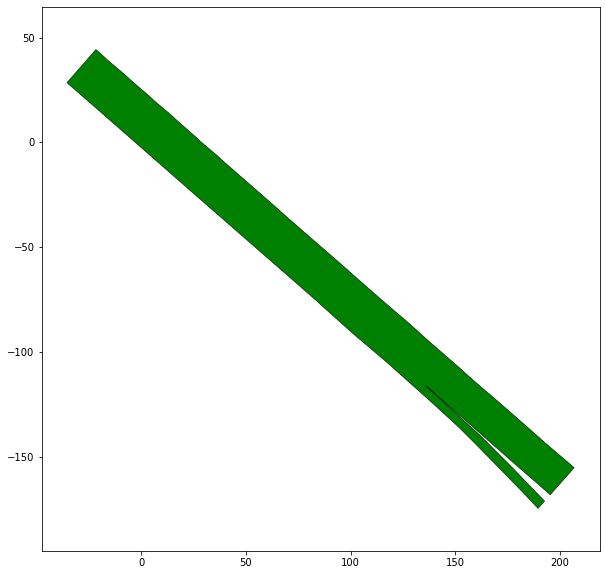

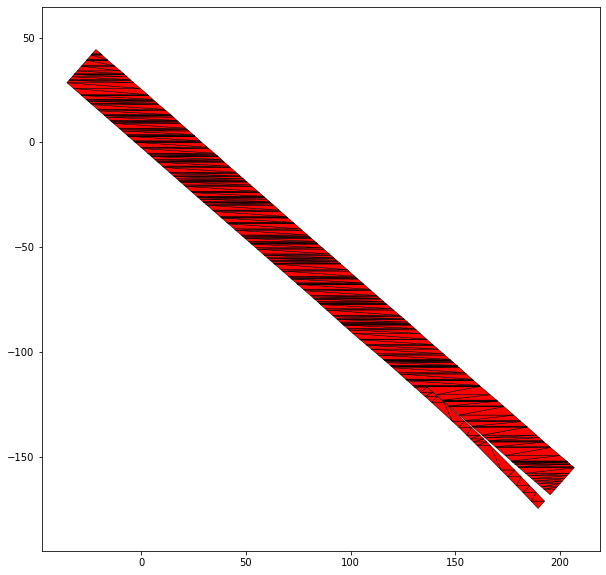

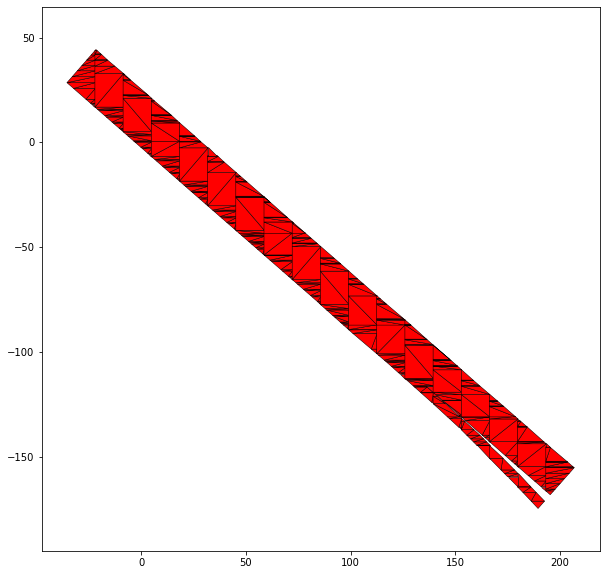

112 USA_Lanker-1_17_T-1


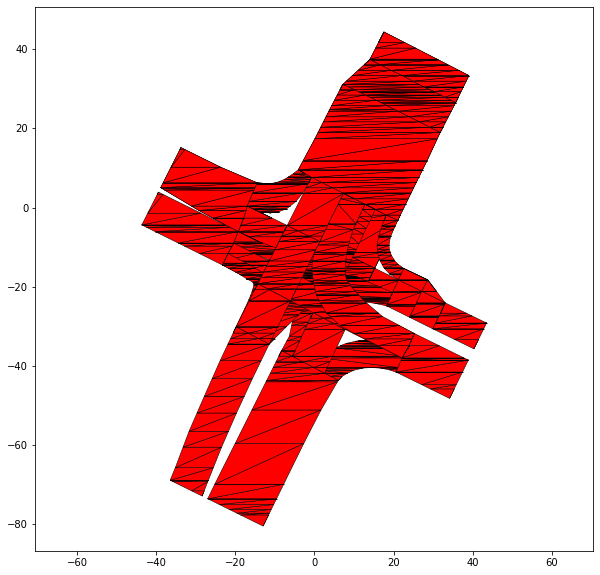

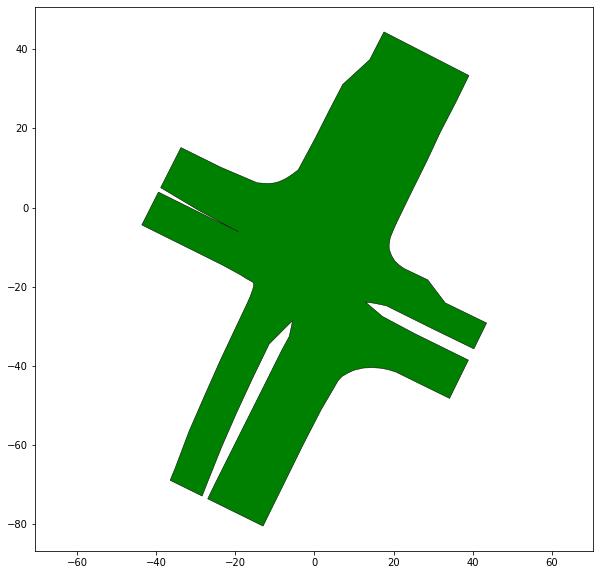

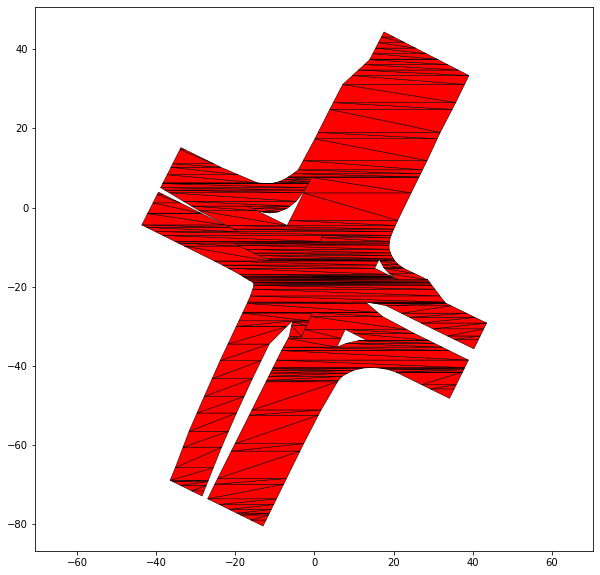

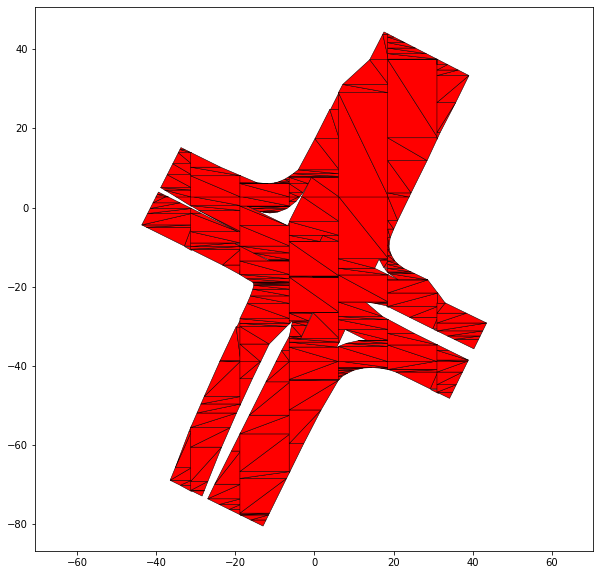

113 CHN_Sha-3_2_T-1


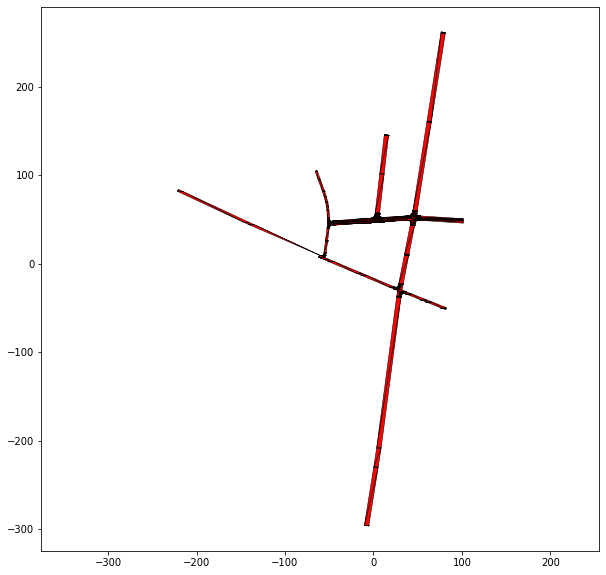

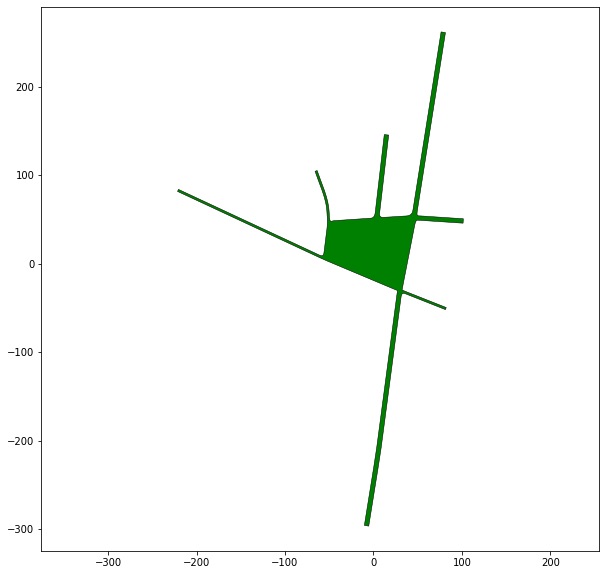

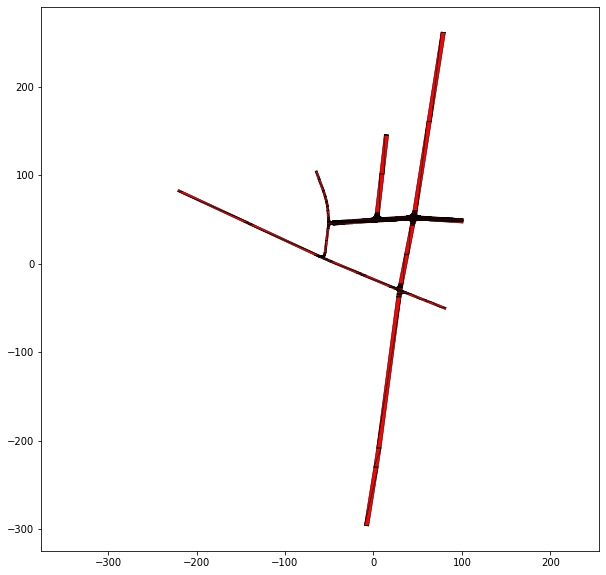

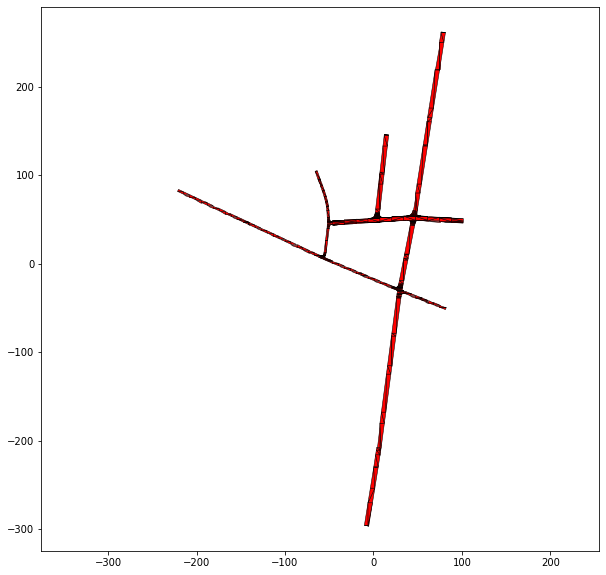

118 CHN_Sha-6_4_T-1


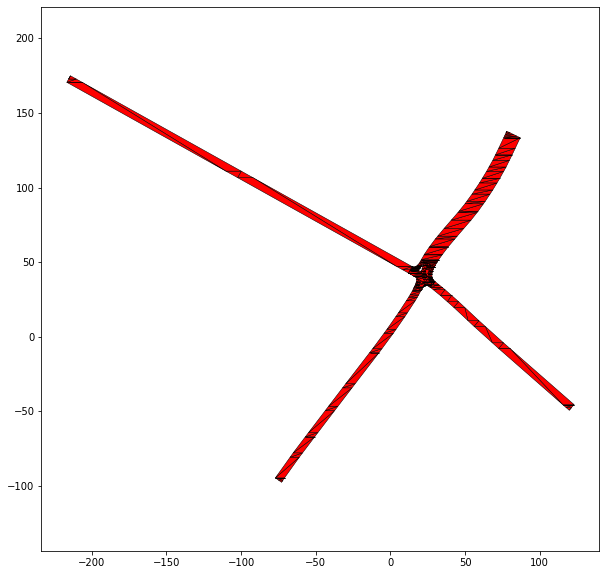

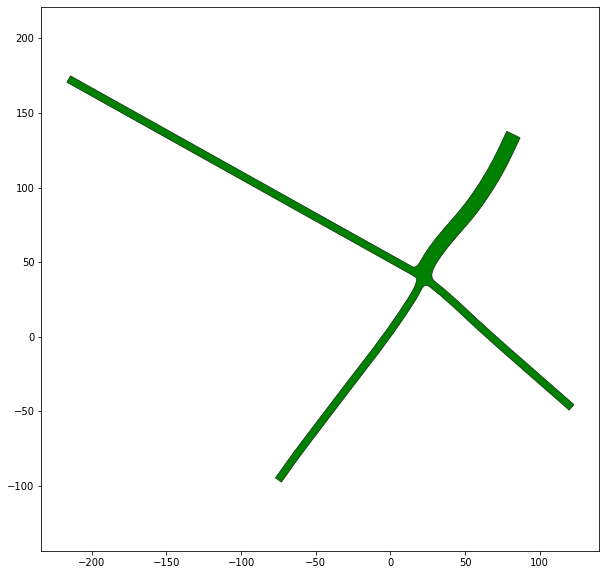

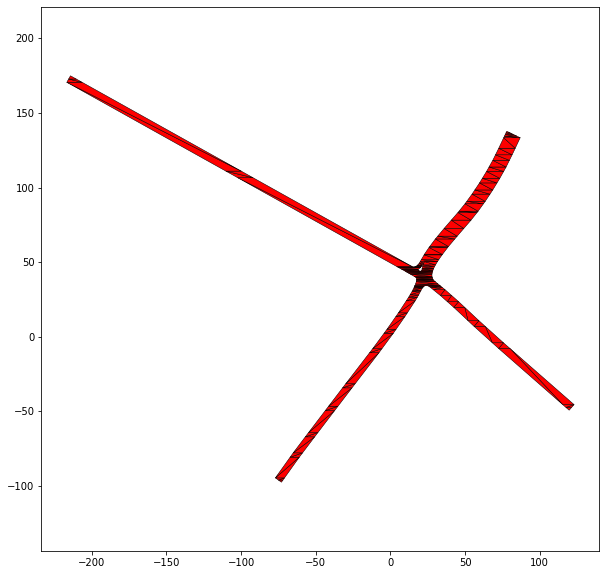

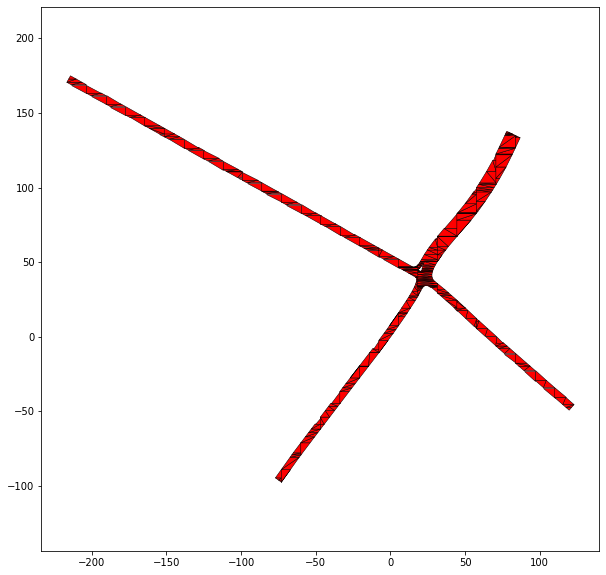

121 CHN_Sha-14_2_T-1


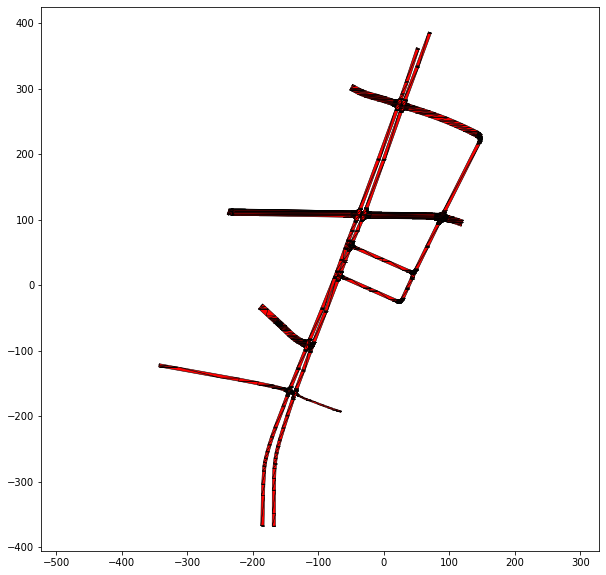

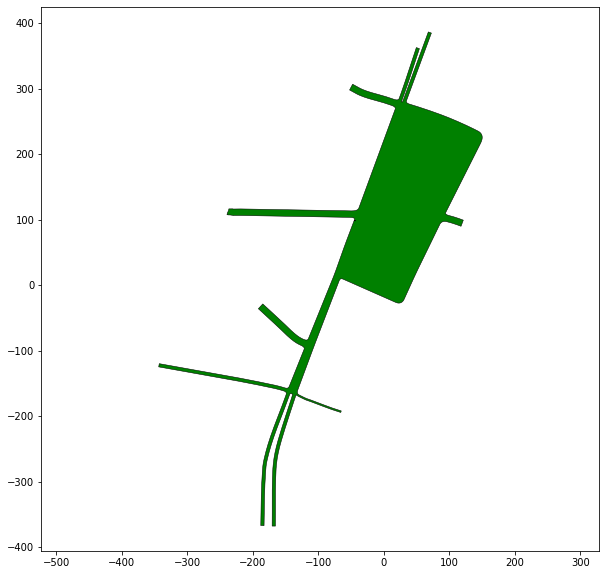

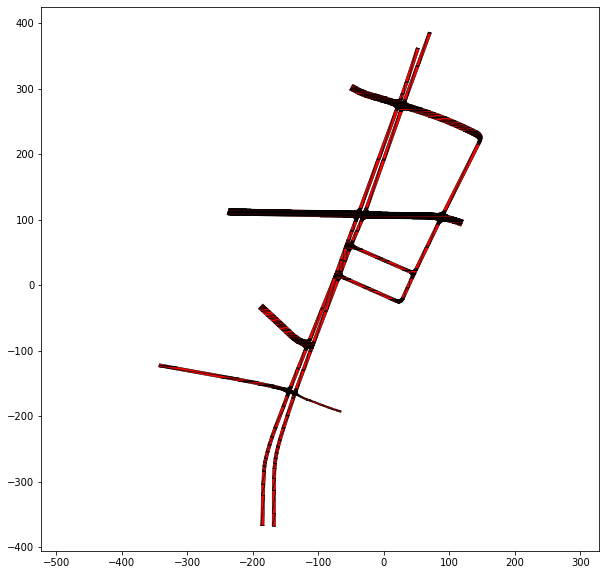

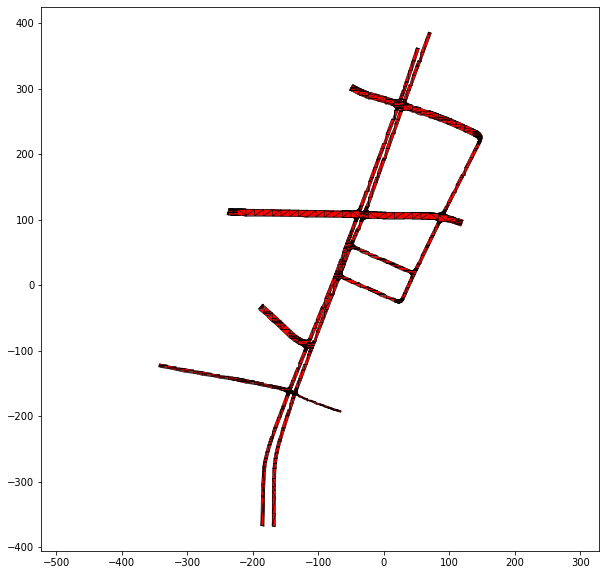

122 CHN_Sha-2_3_T-1


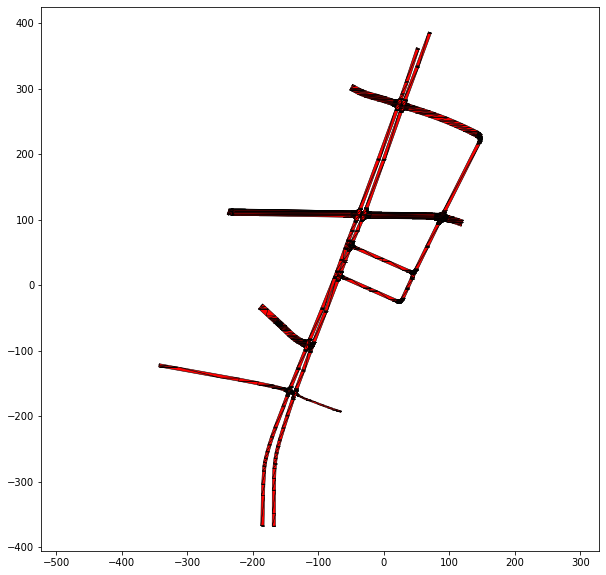

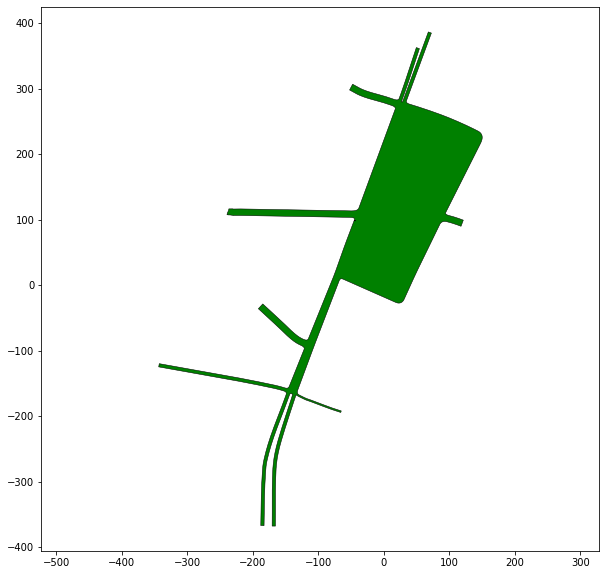

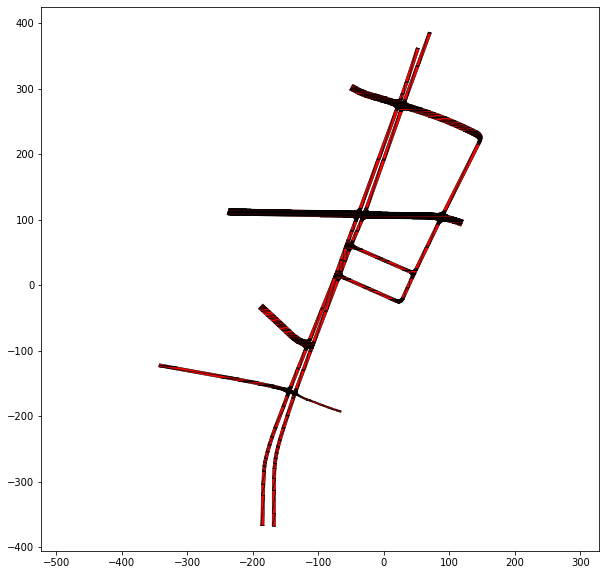

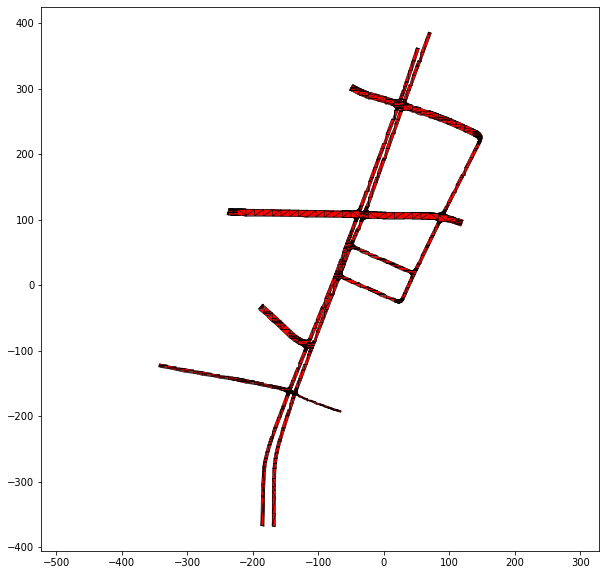

125 CHN_Sha-3_1_T-1


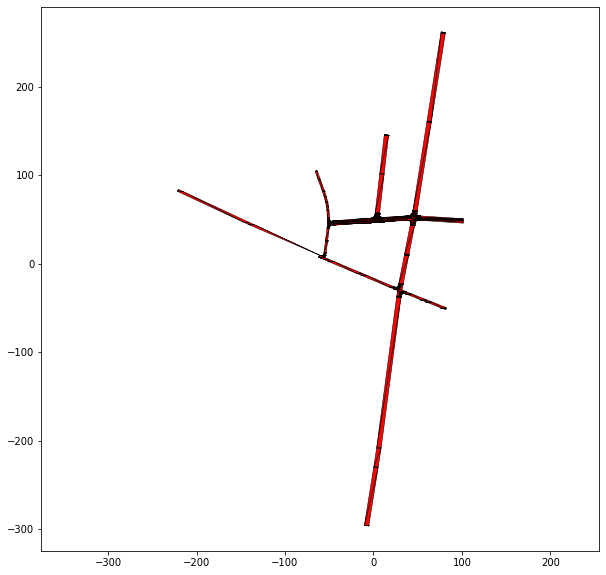

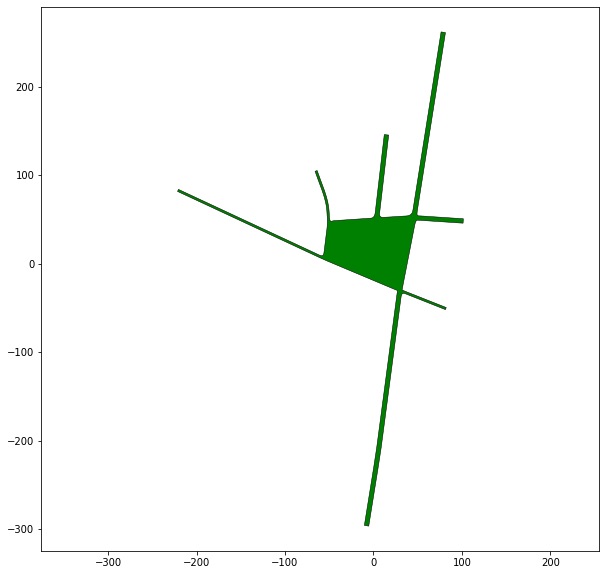

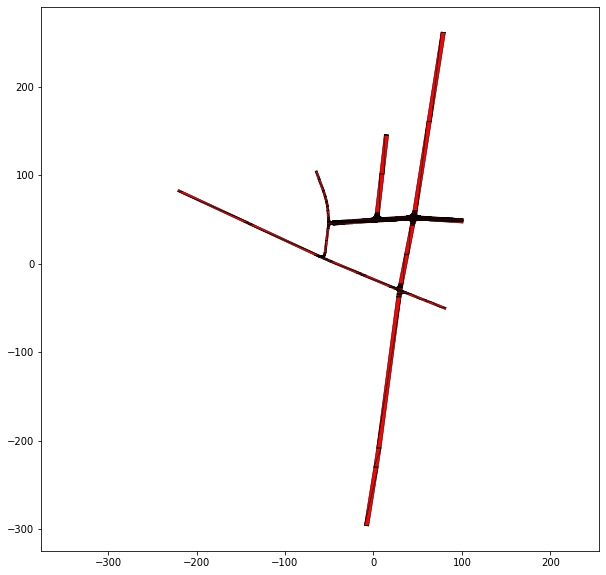

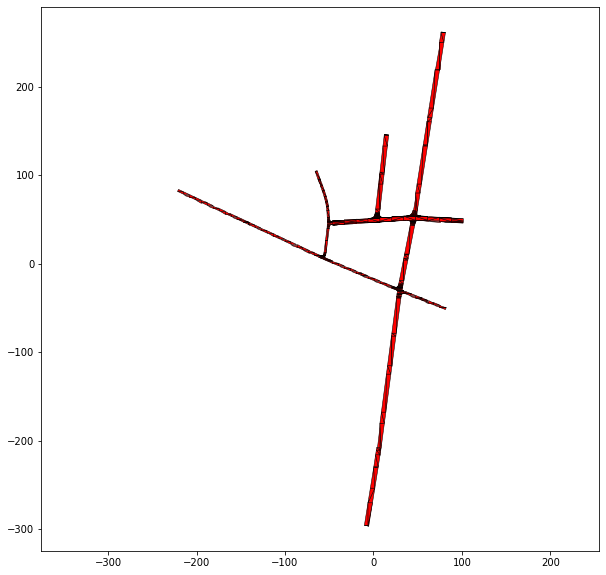

126 DEU_Muc-23_1_T-1


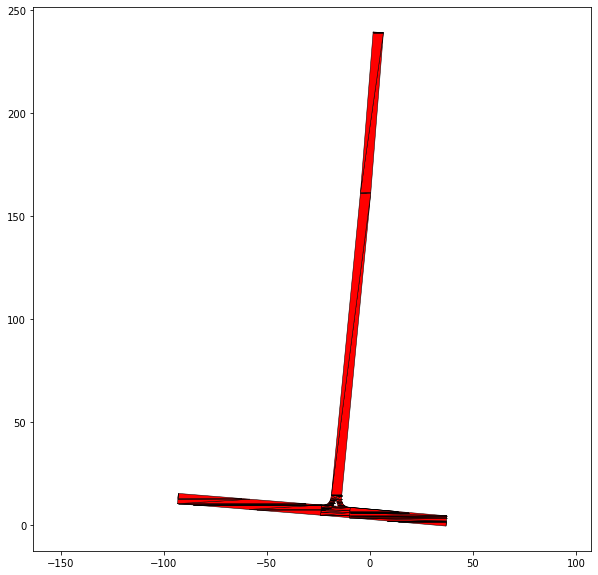

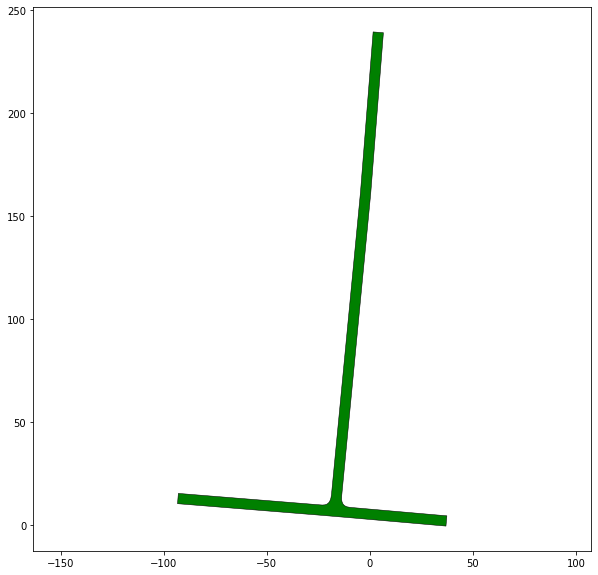

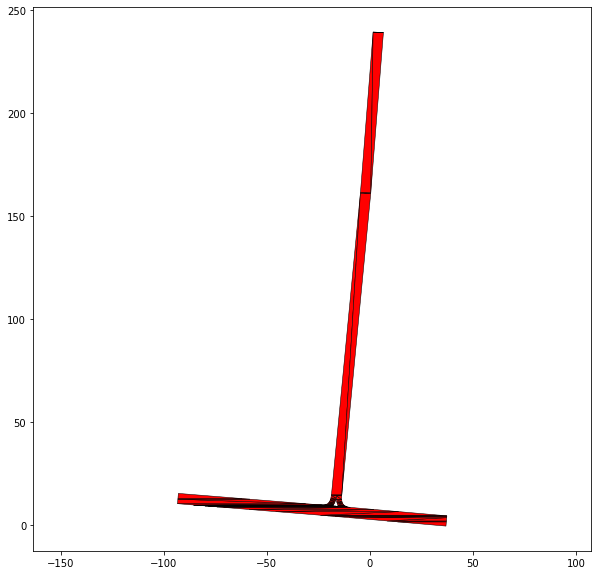

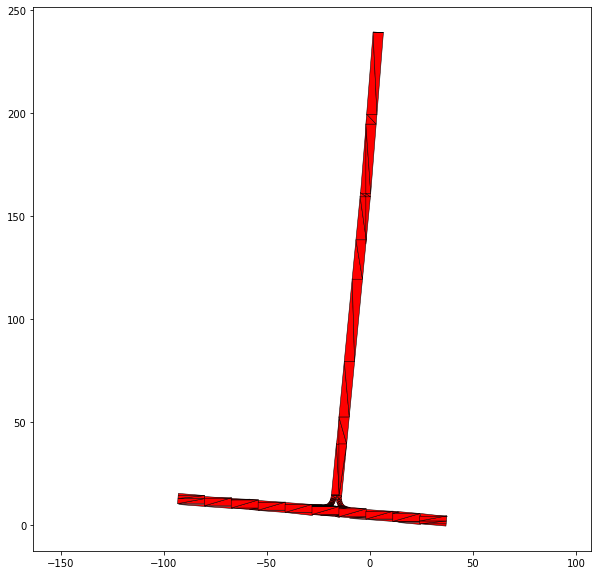

128 USA_US101-28_1_T-1


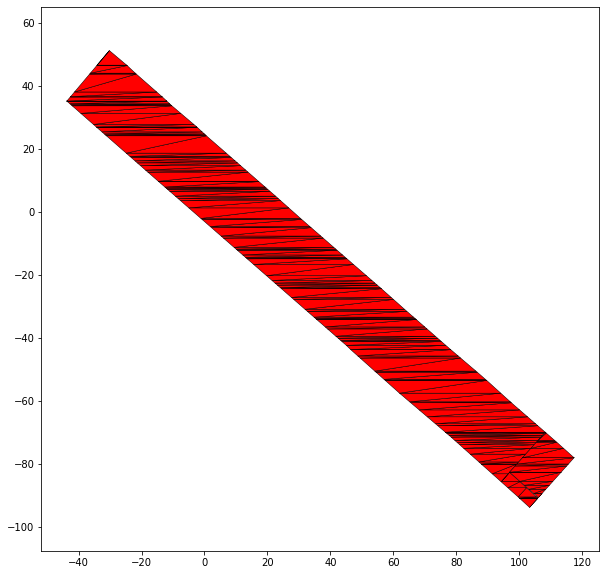

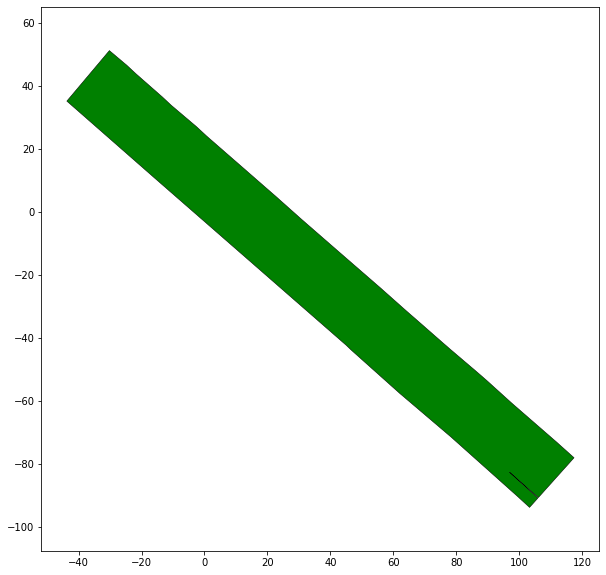

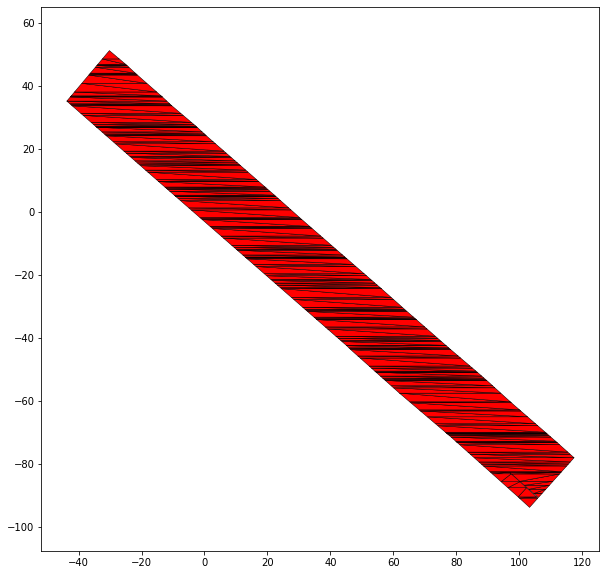

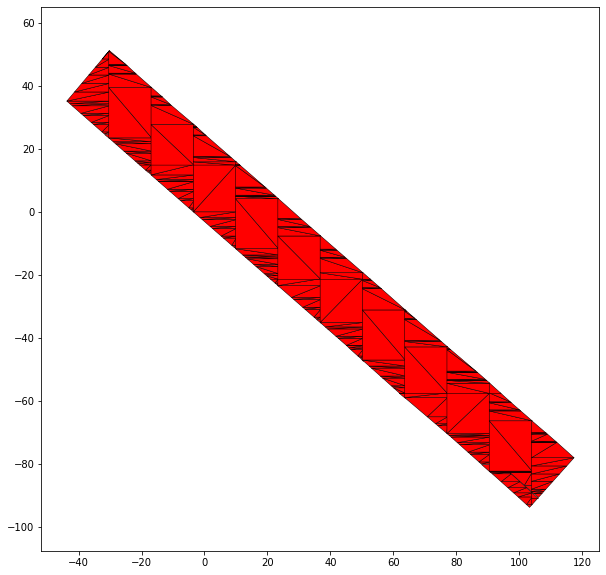

131 USA_US101-12_1_T-1


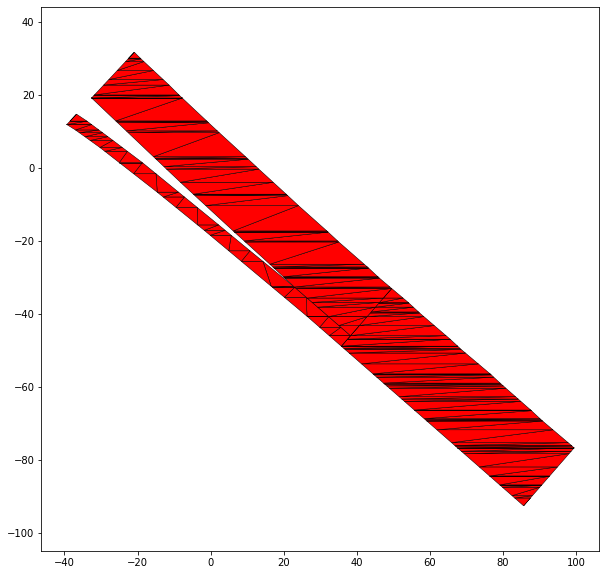

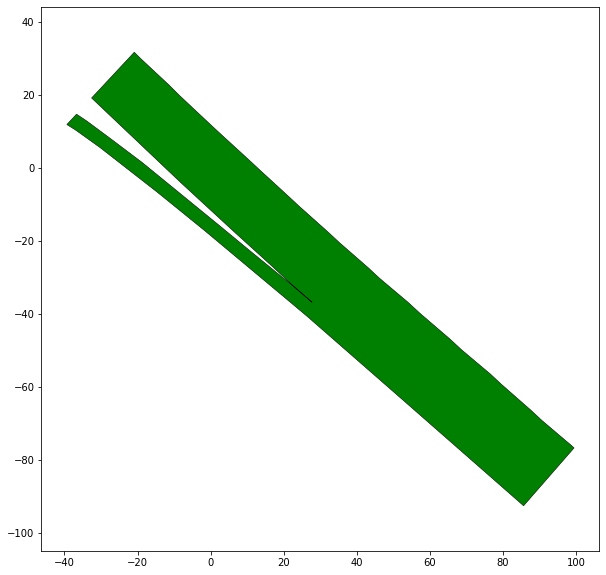

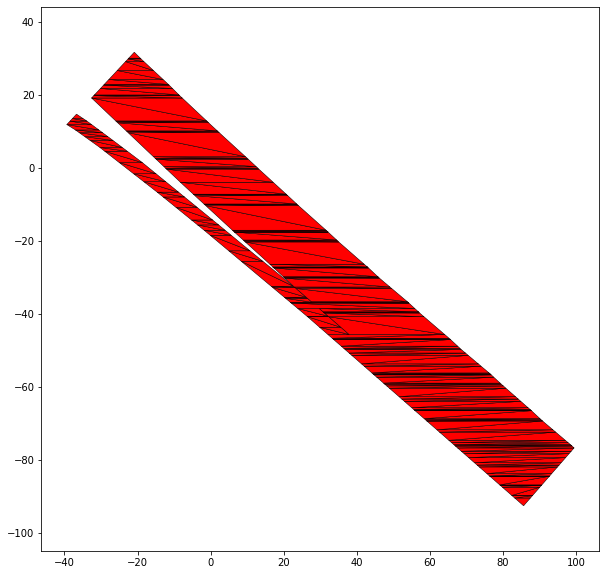

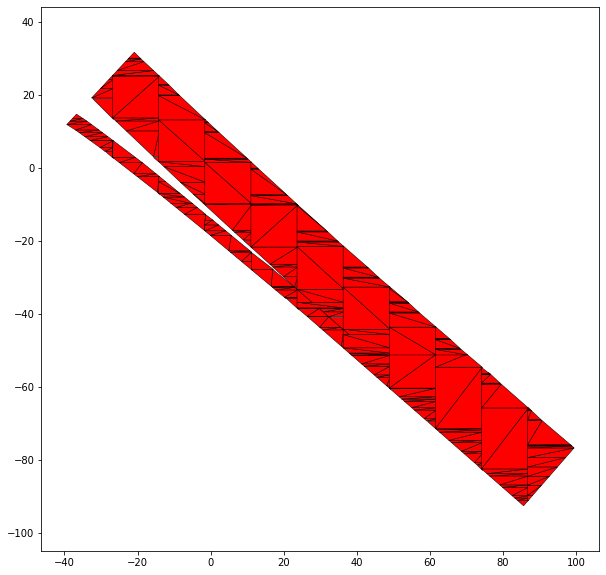

138 DEU_Muc-24_1_T-1


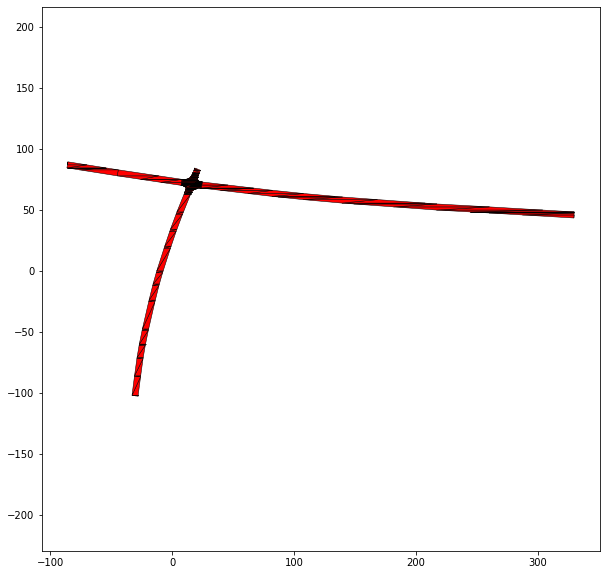

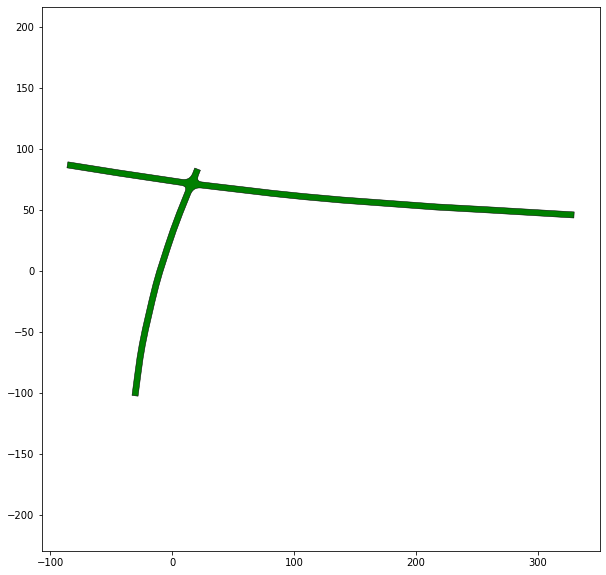

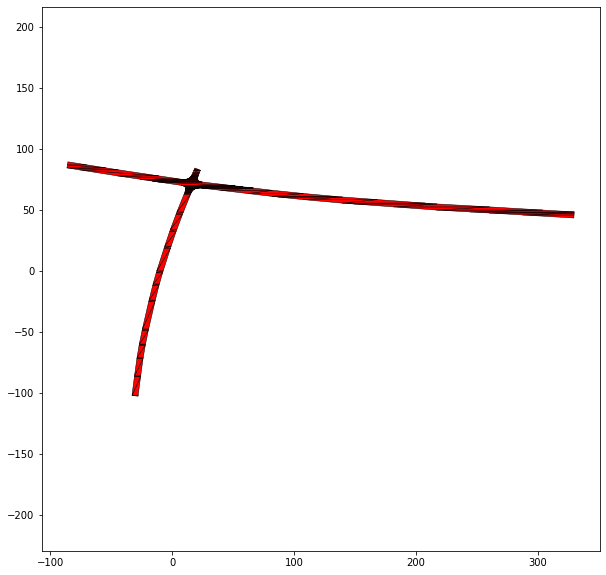

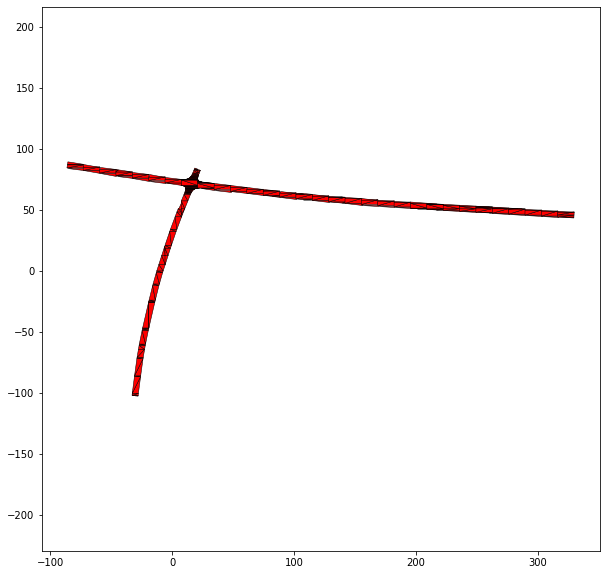

139 CHN_Sha-4_1_T-1


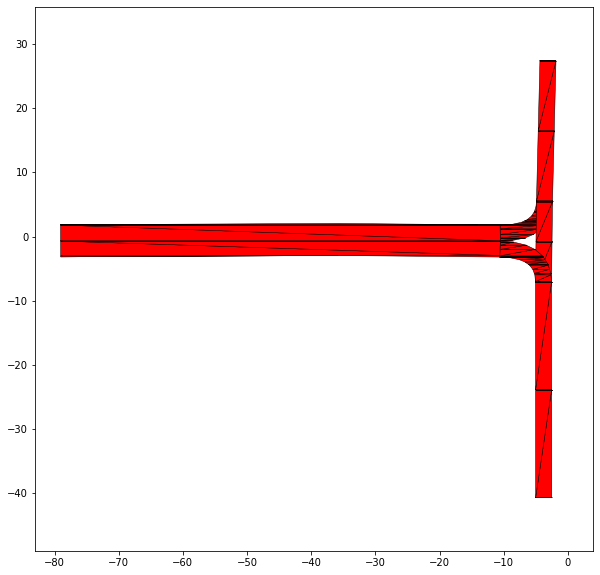

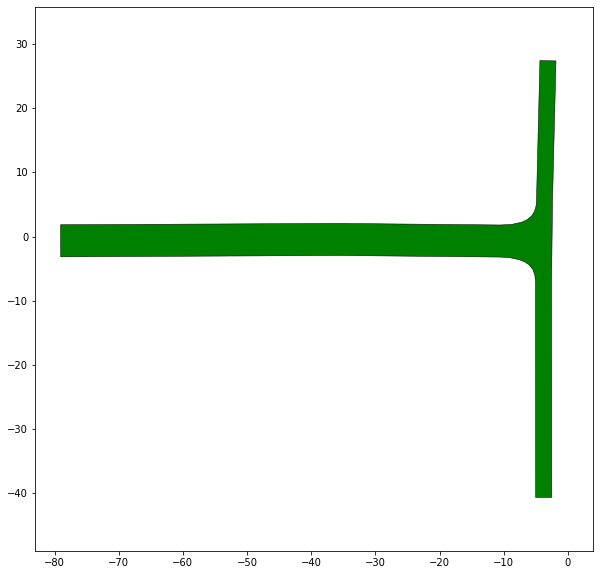

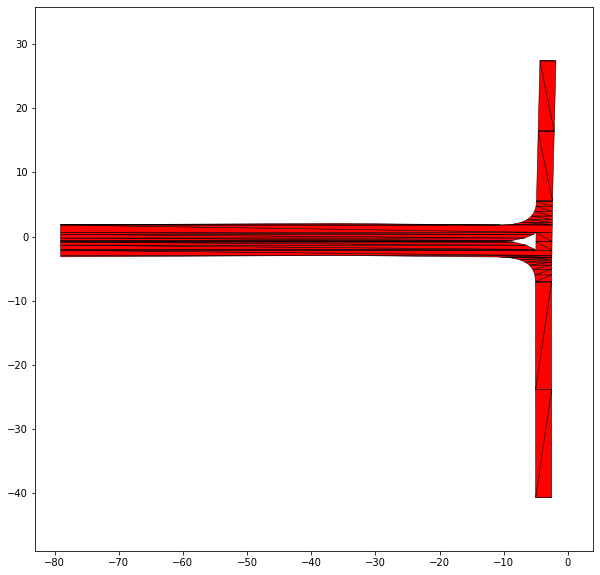

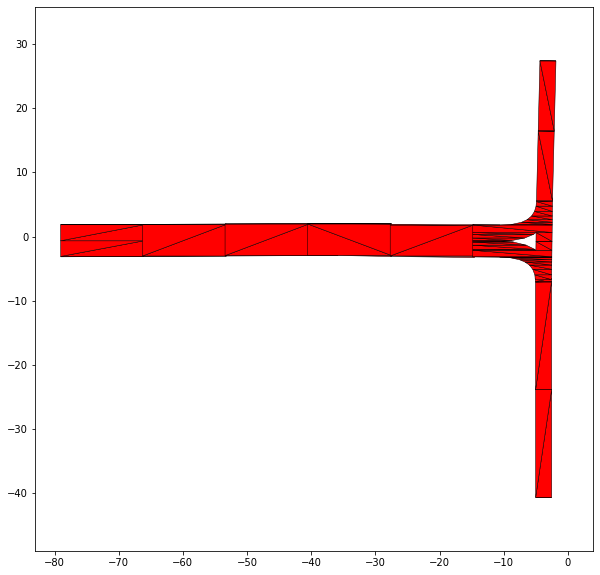

141 USA_US101-6_2_T-1


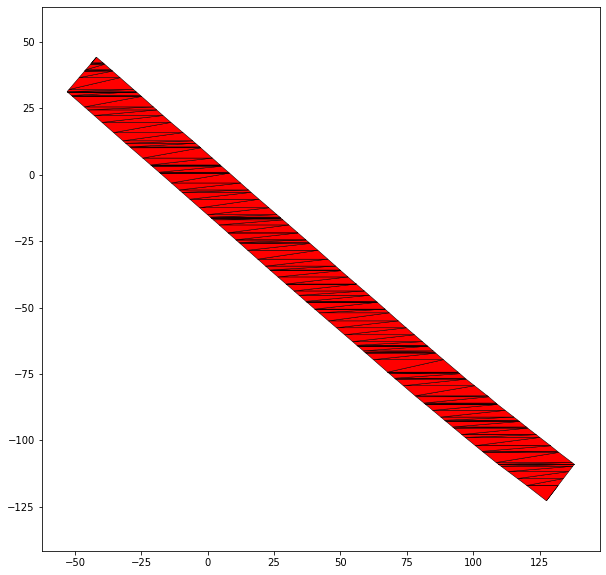

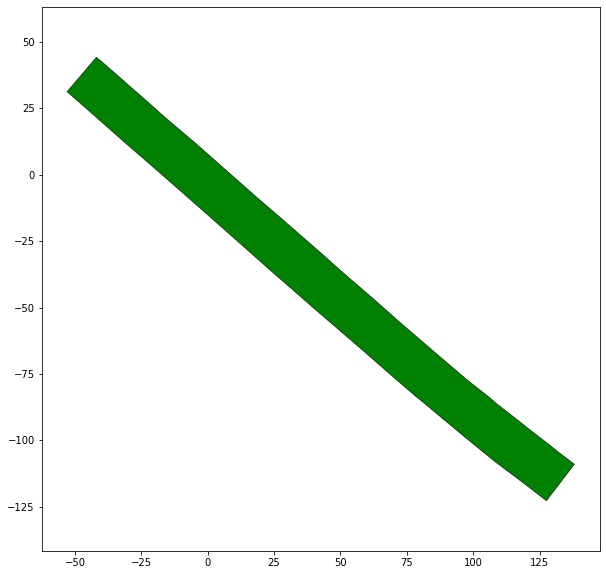

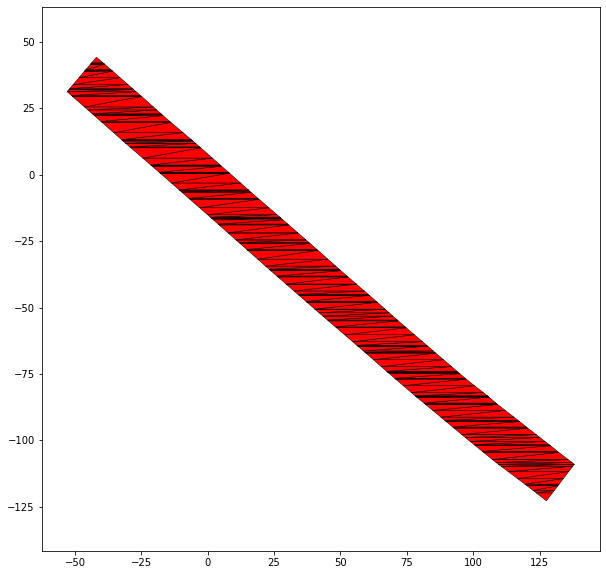

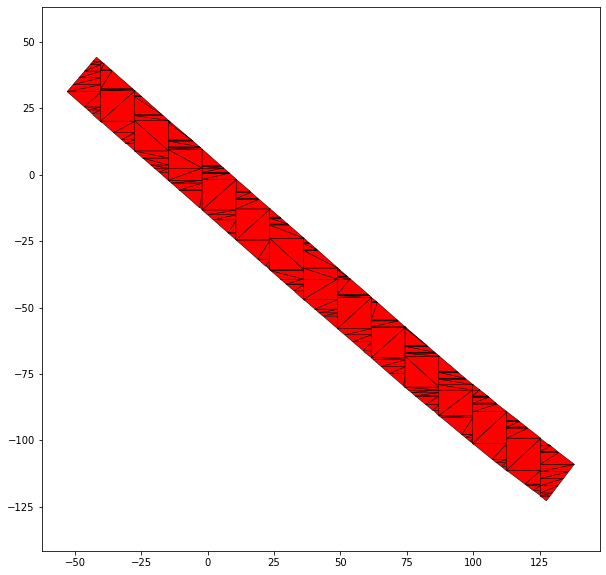

142 USA_US101-3_3_T-1


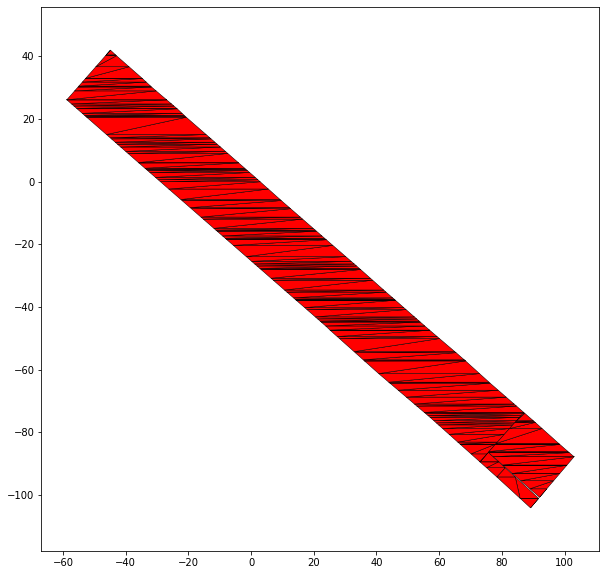

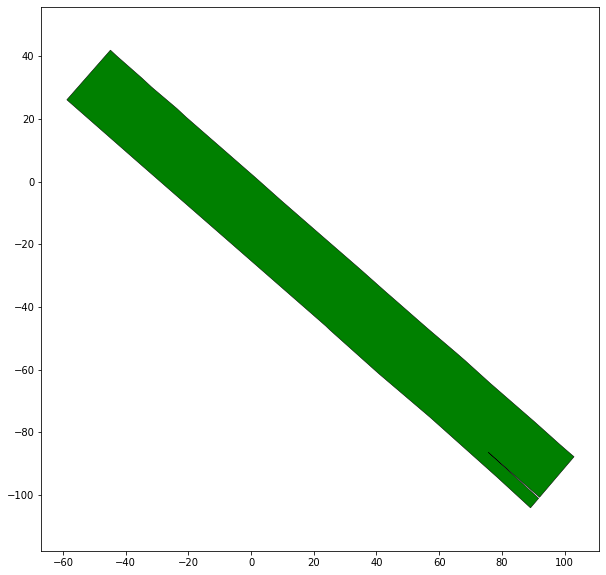

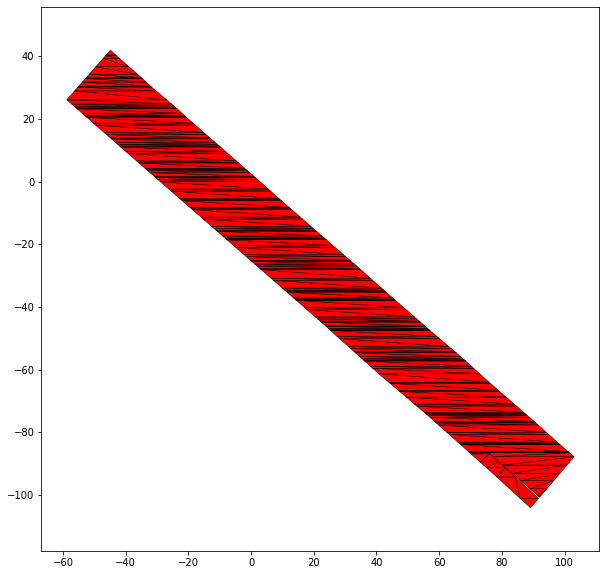

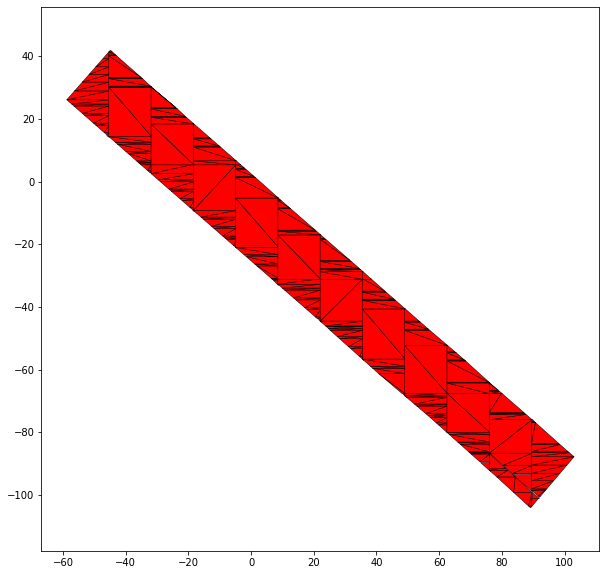

143 USA_Lanker-2_17_T-1


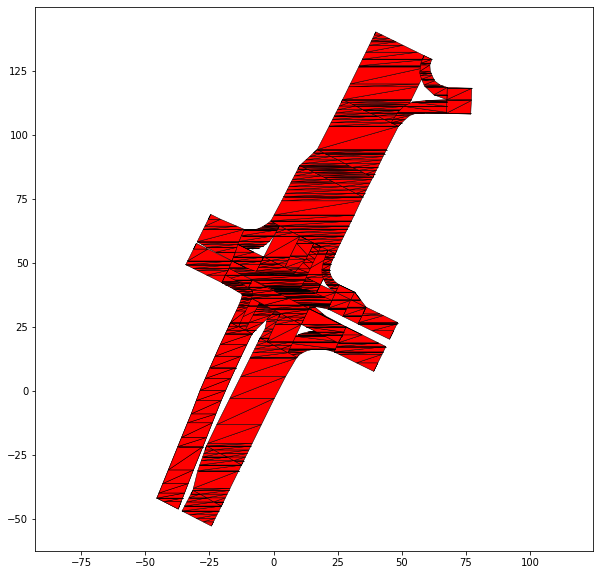

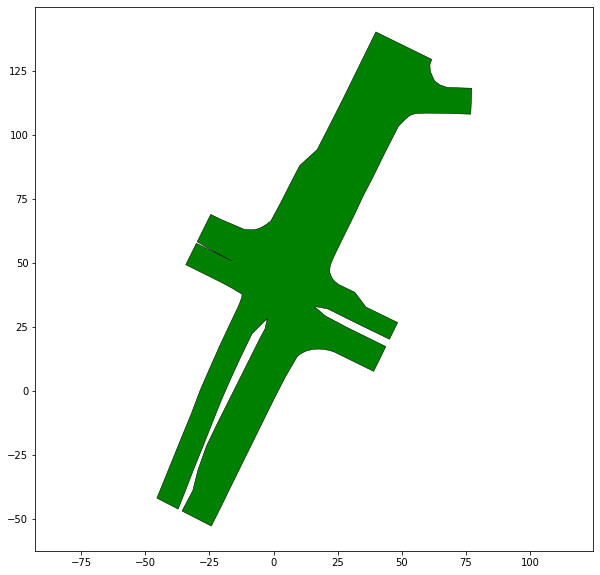

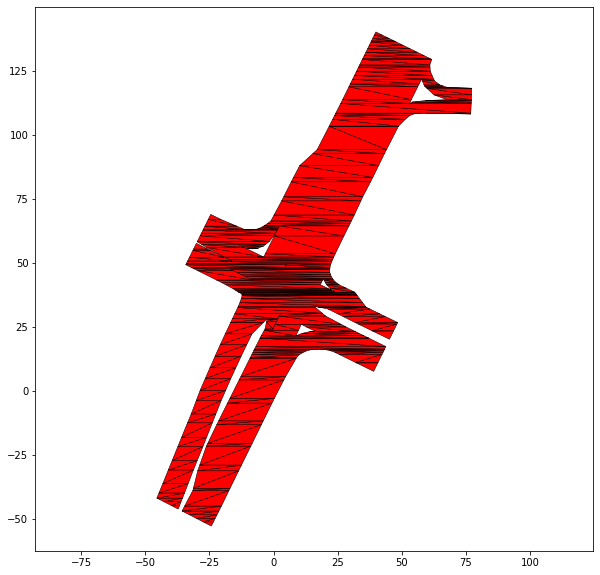

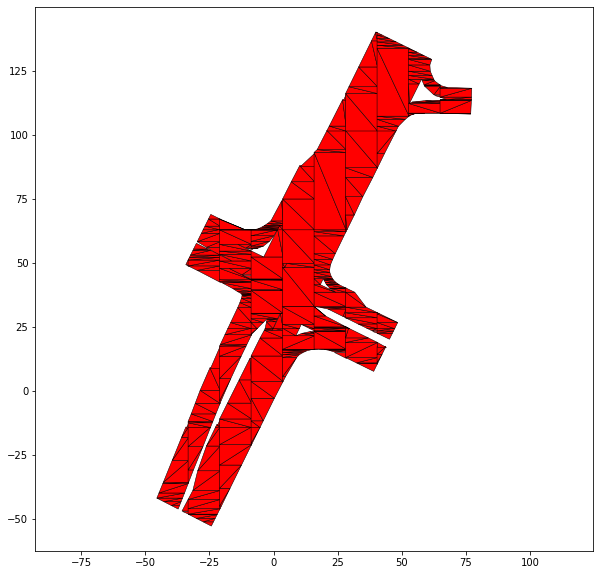

144 CHN_Sha-1_3_T-1


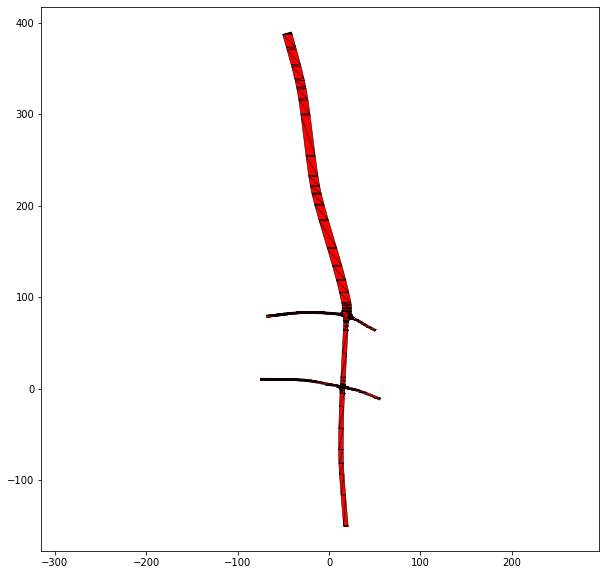

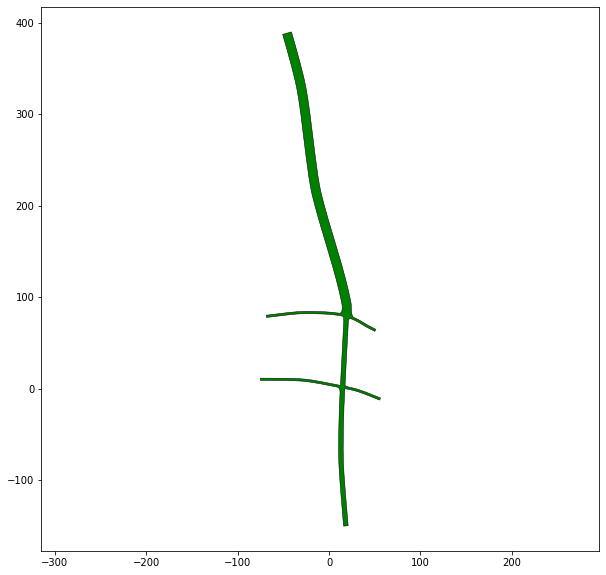

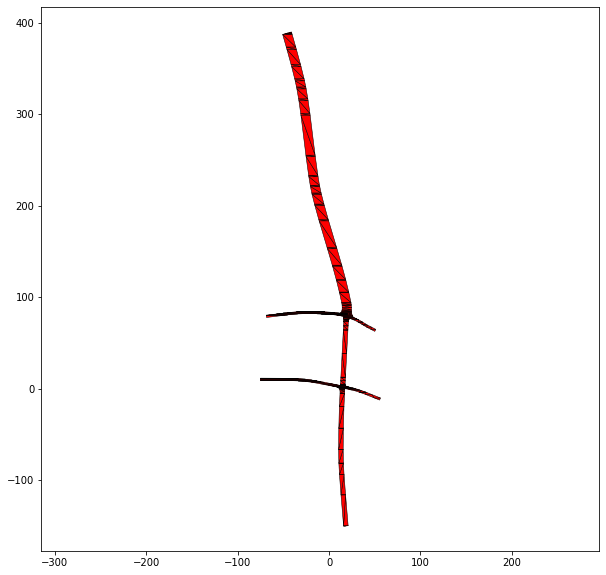

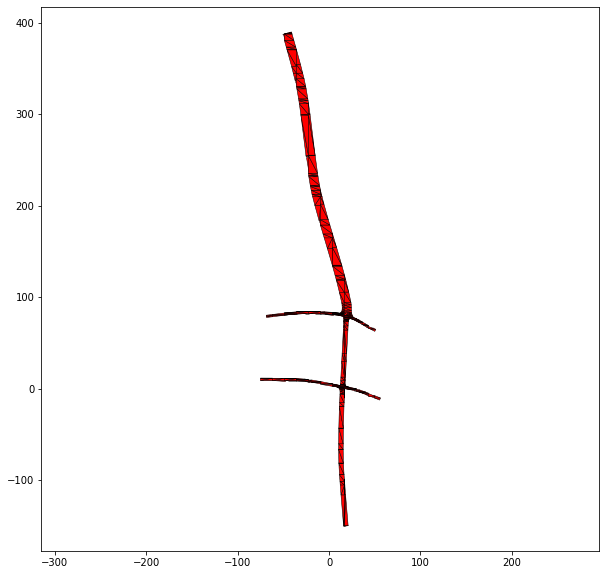

146 DEU_Muc-18_1_T-1


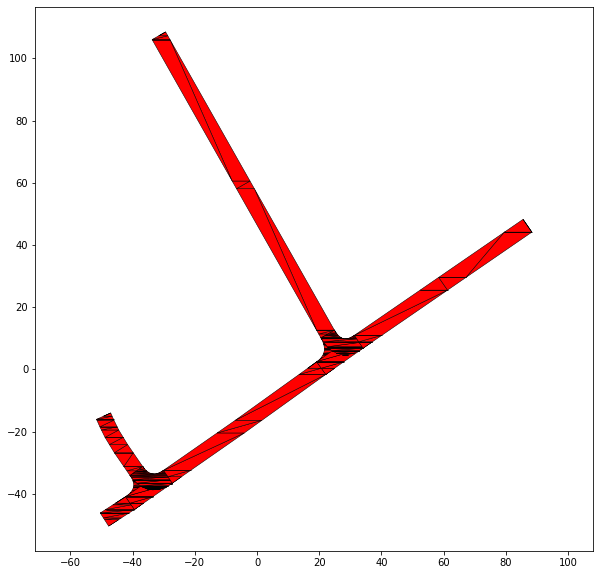

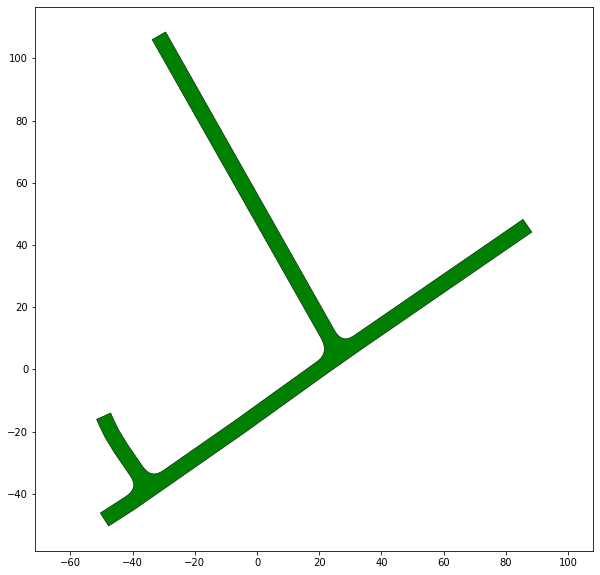

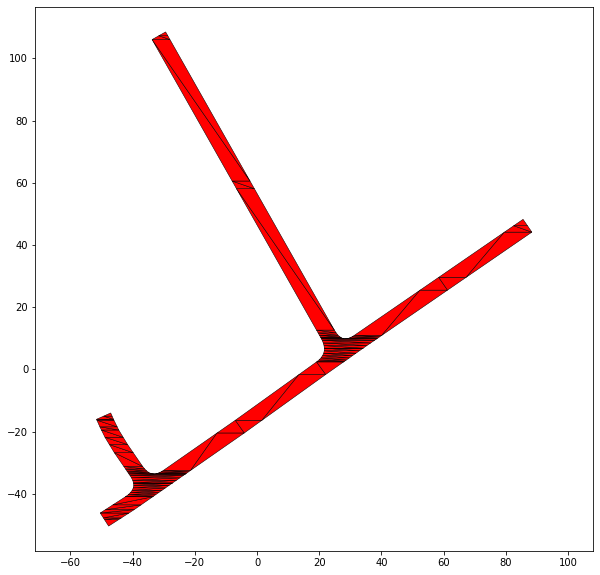

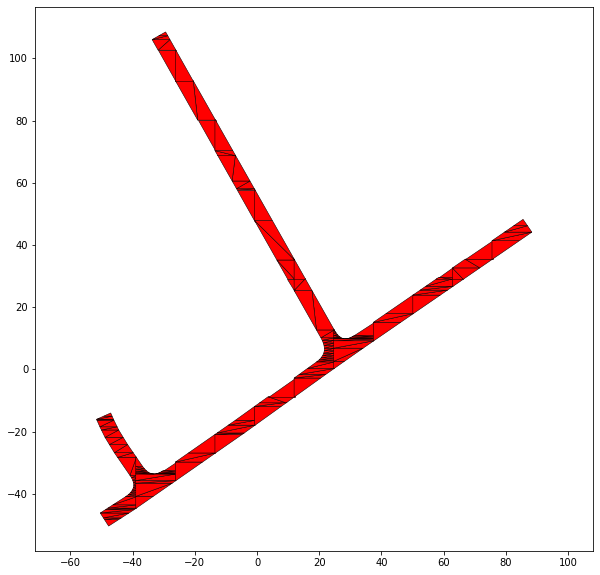

148 USA_US101-19_1_T-1


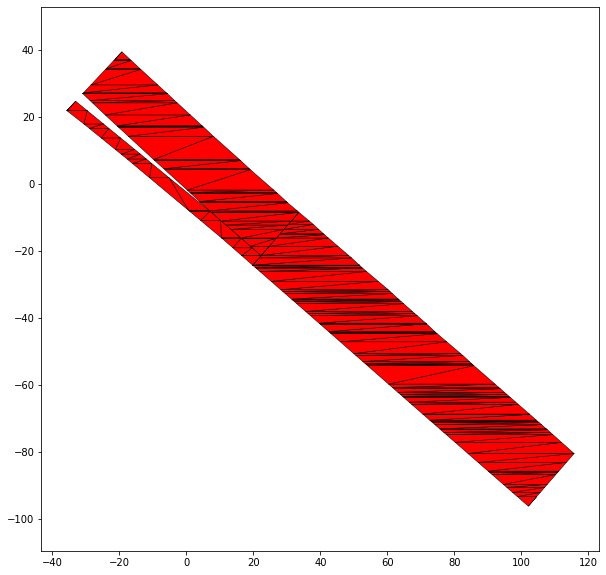

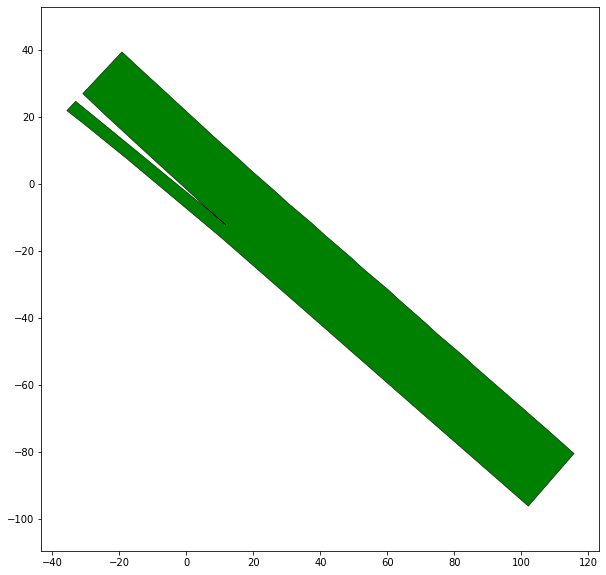

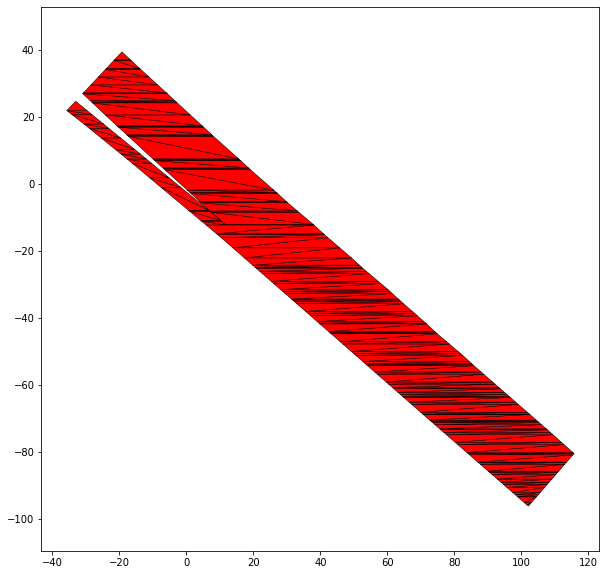

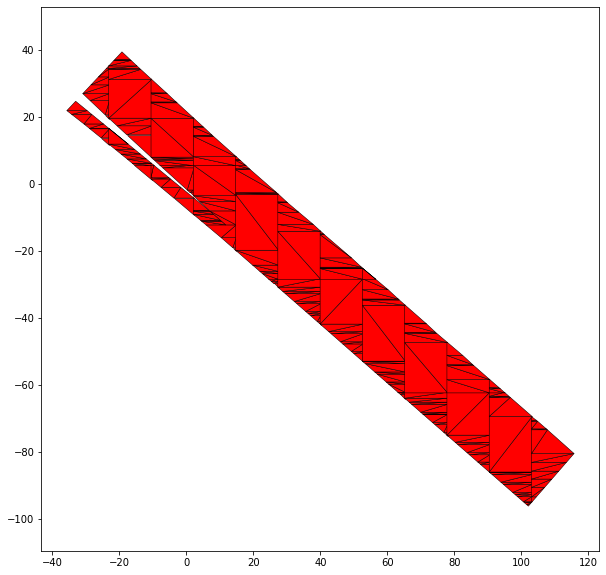

151 CHN_Sha-4_2_T-1


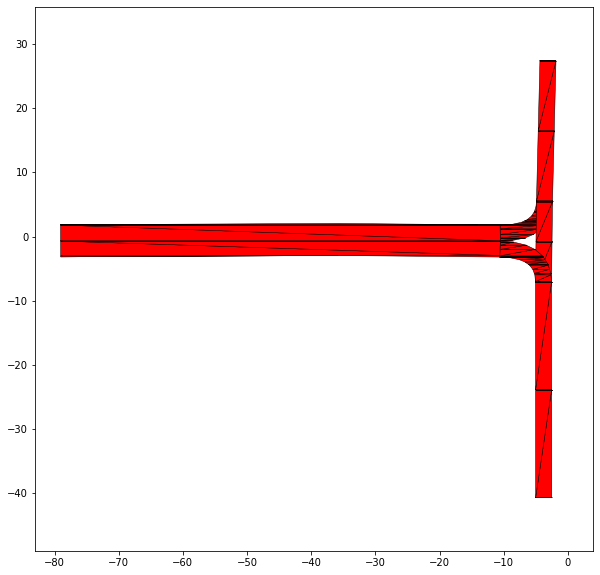

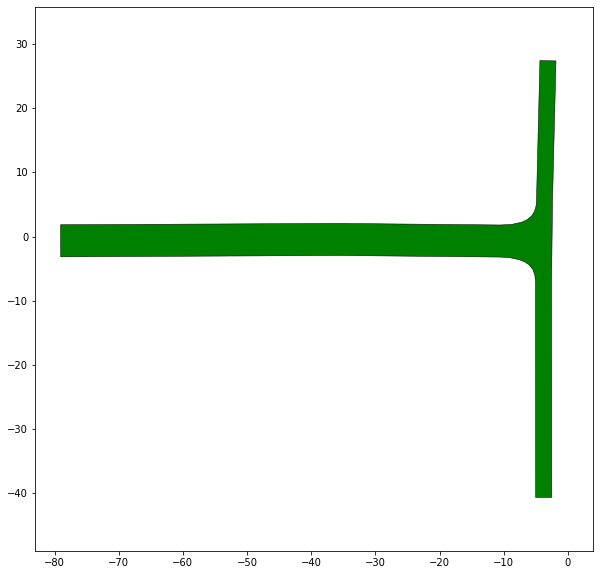

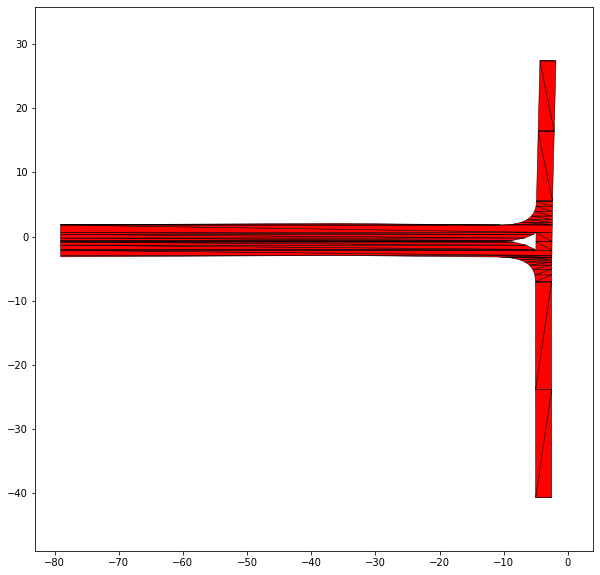

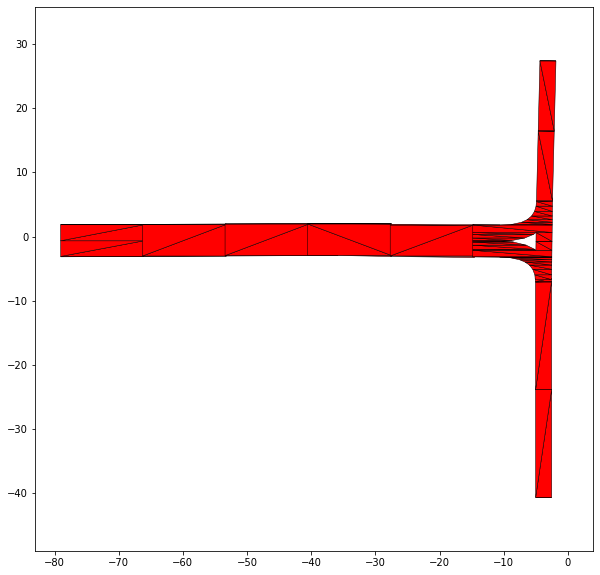

155 DEU_Muc-29_1_T-1


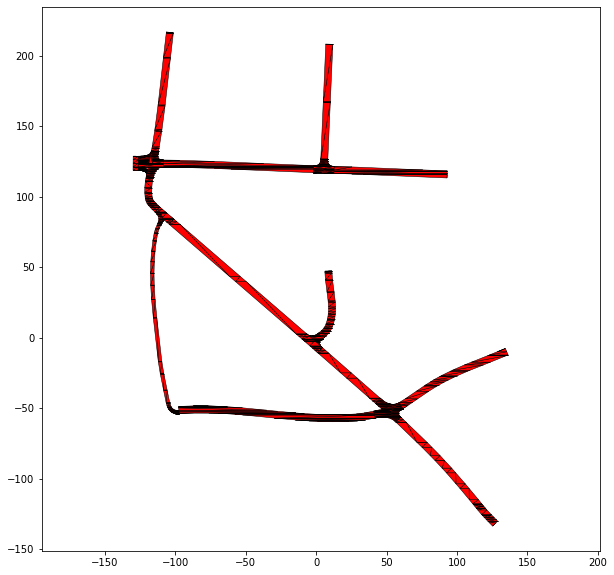

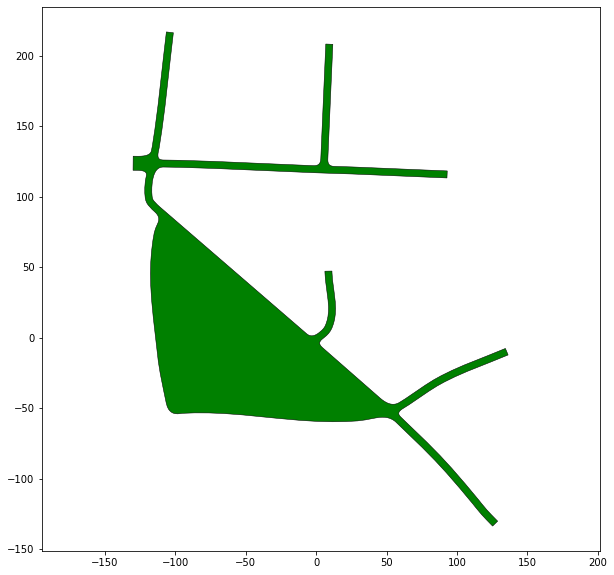

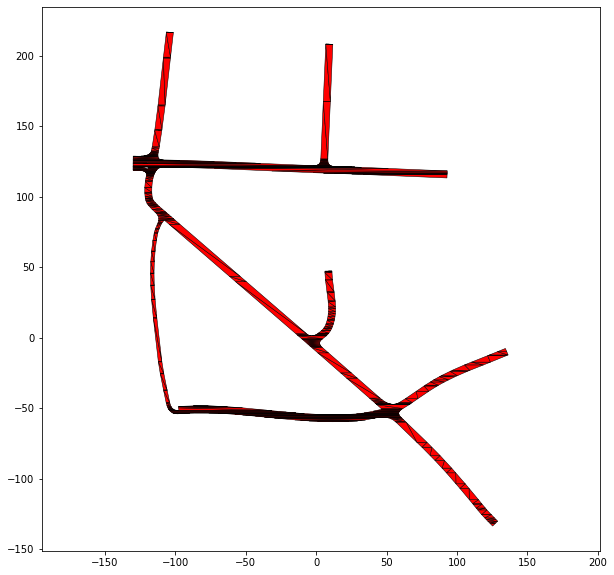

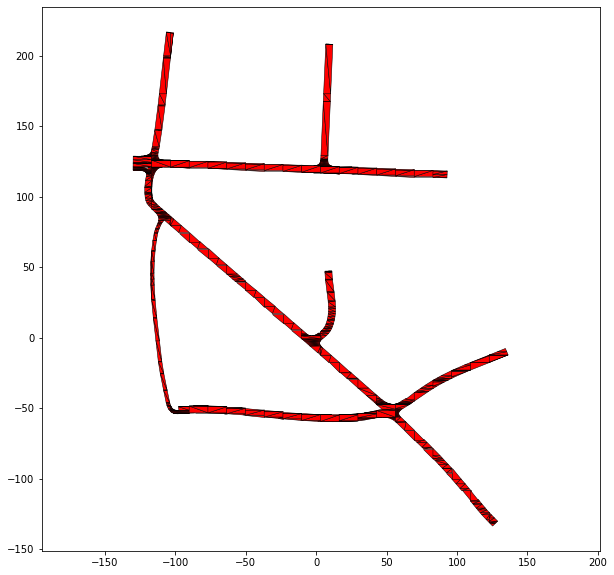

156 USA_US101-6_1_T-1


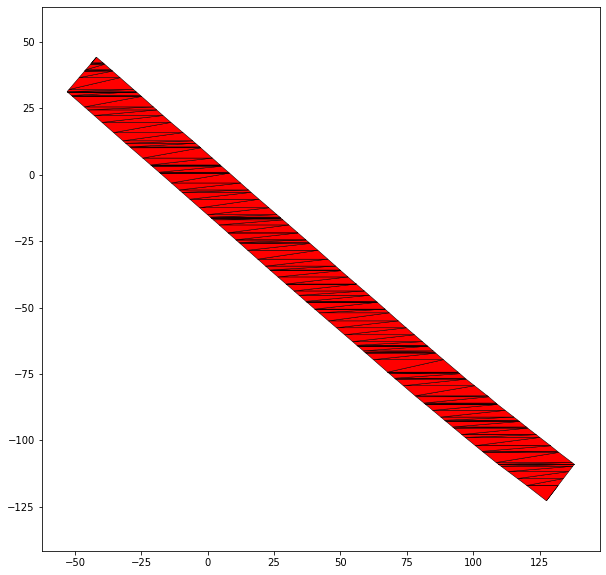

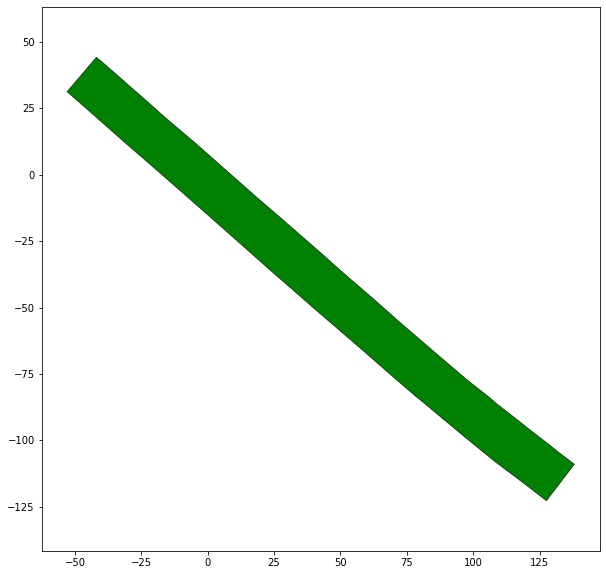

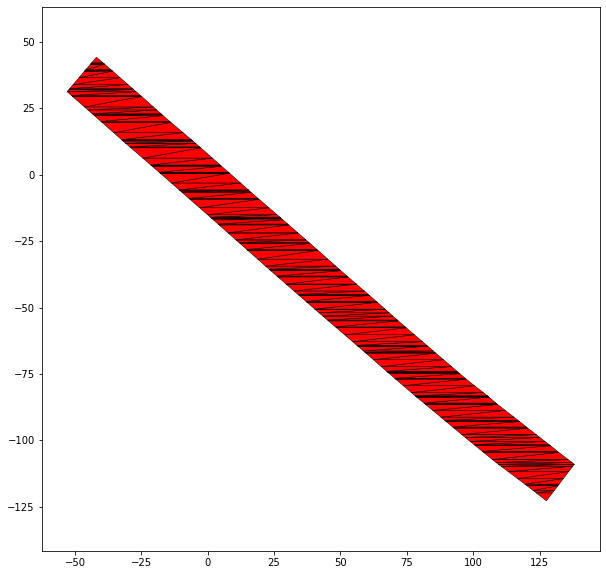

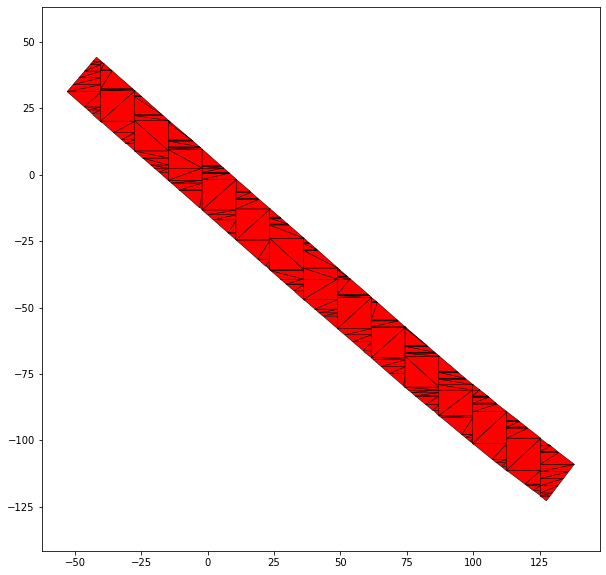

162 CHN_Sha-3_4_T-1


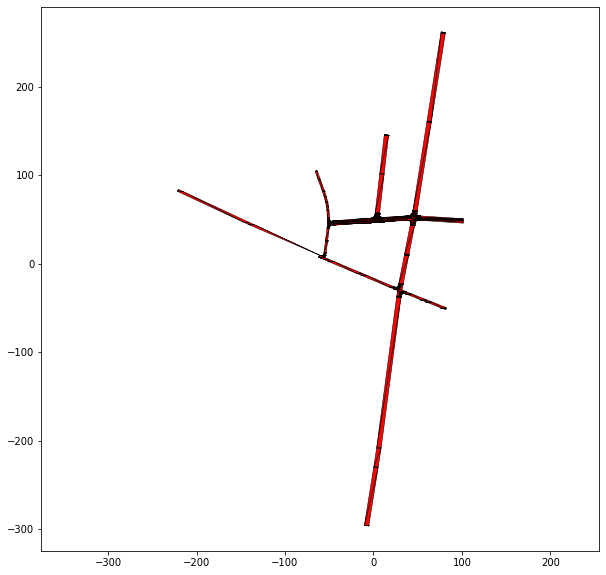

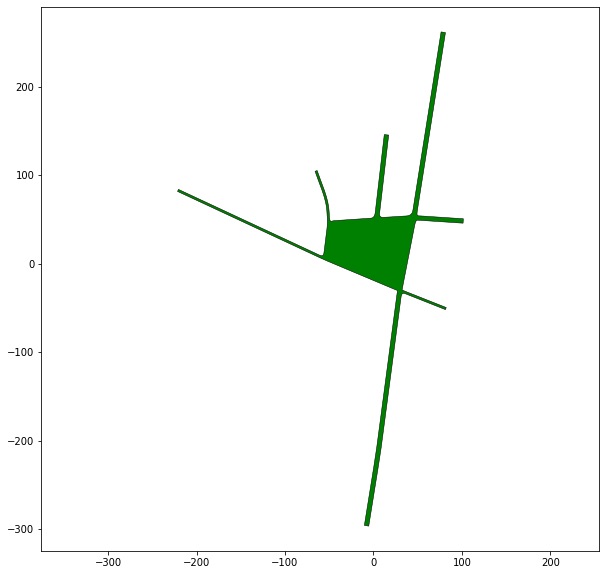

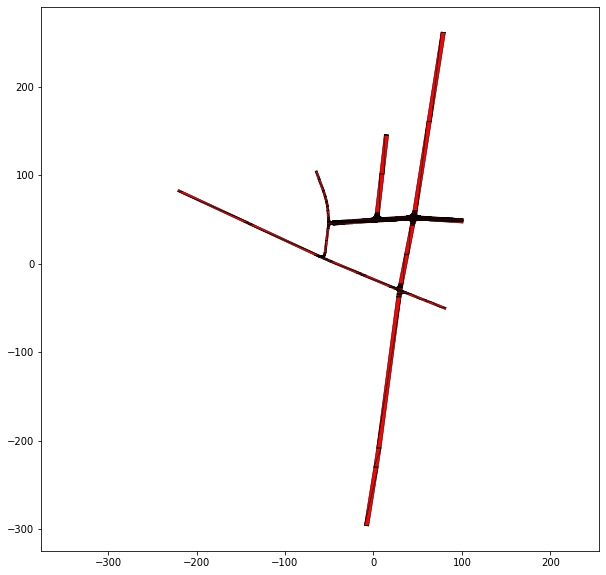

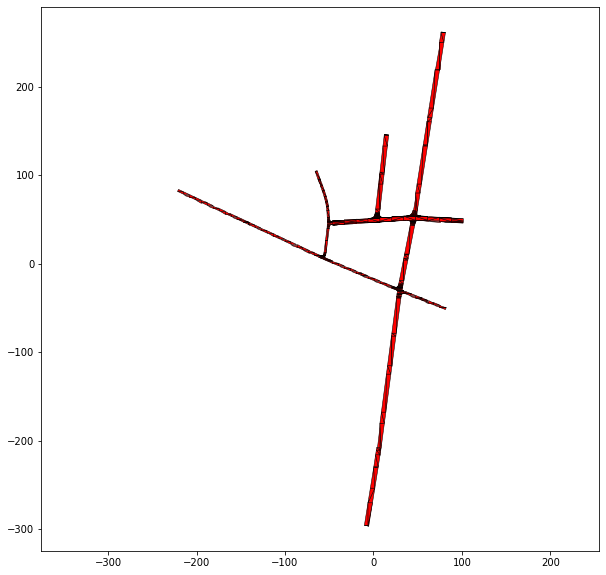

178 USA_US101-8_3_T-1


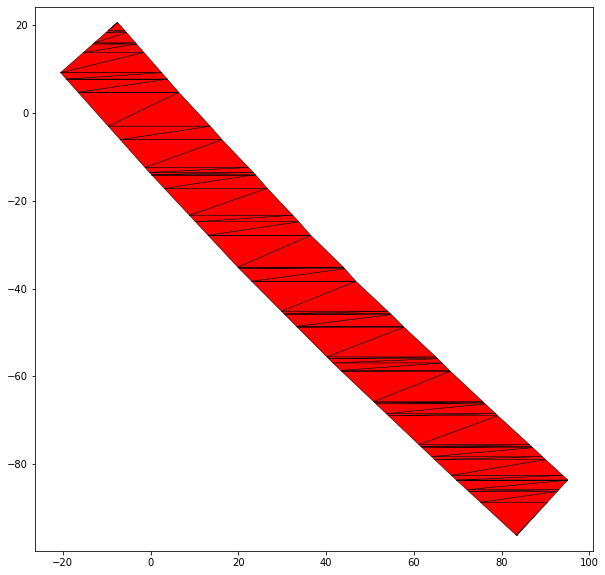

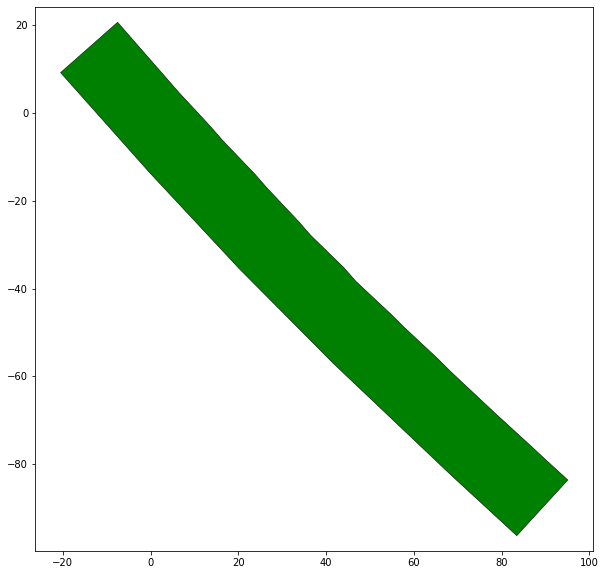

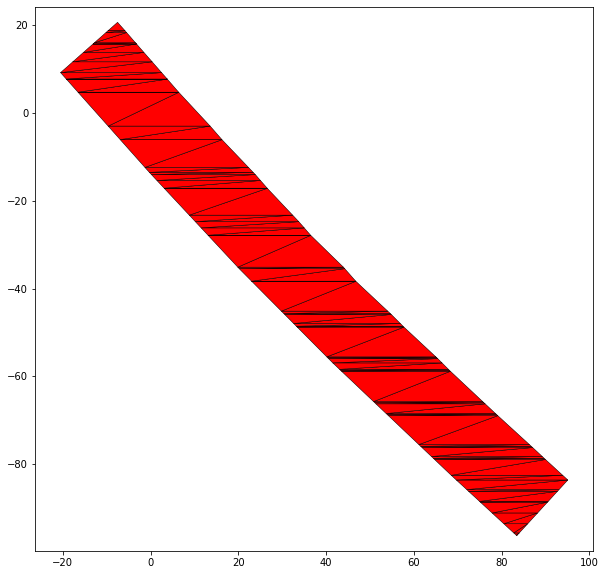

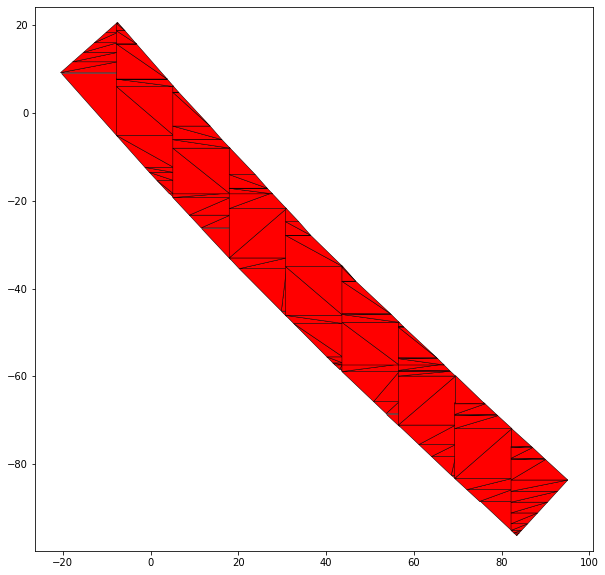

180 CHN_Sha-2_4_T-1


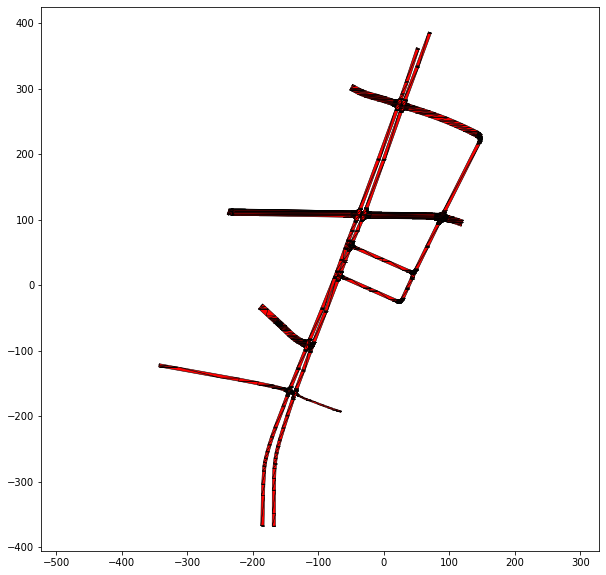

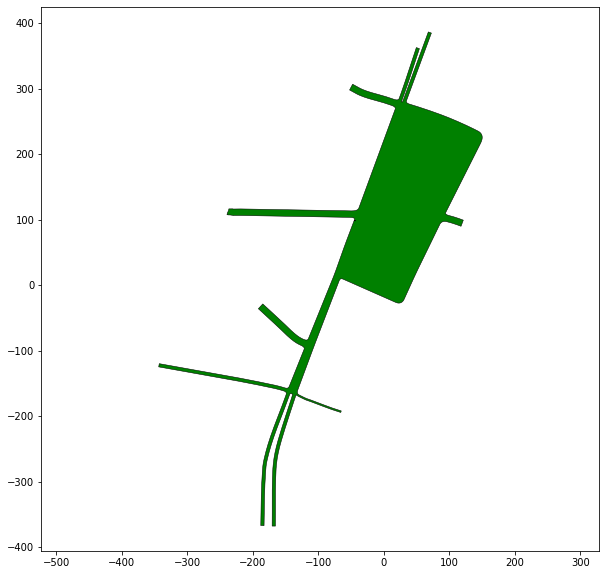

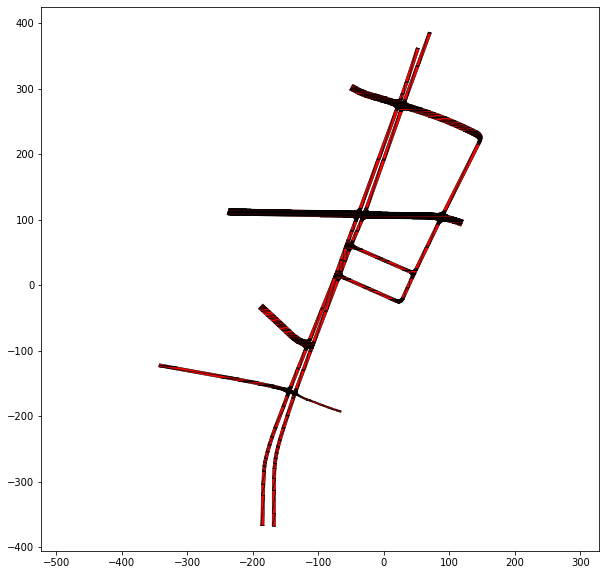

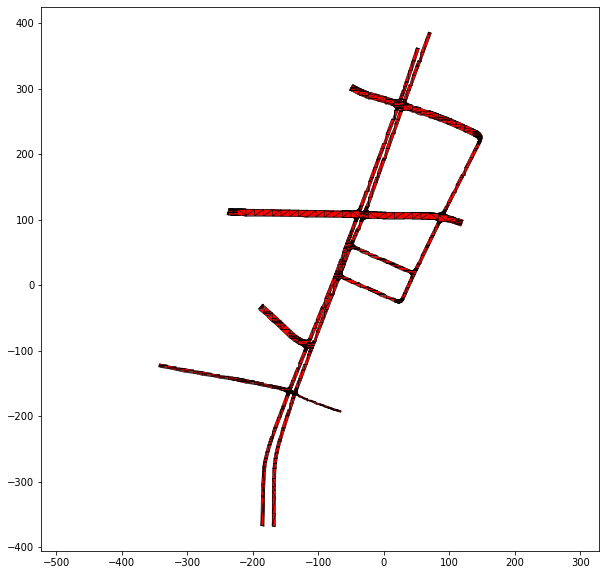

190 USA_Lanker-1_3_T-1


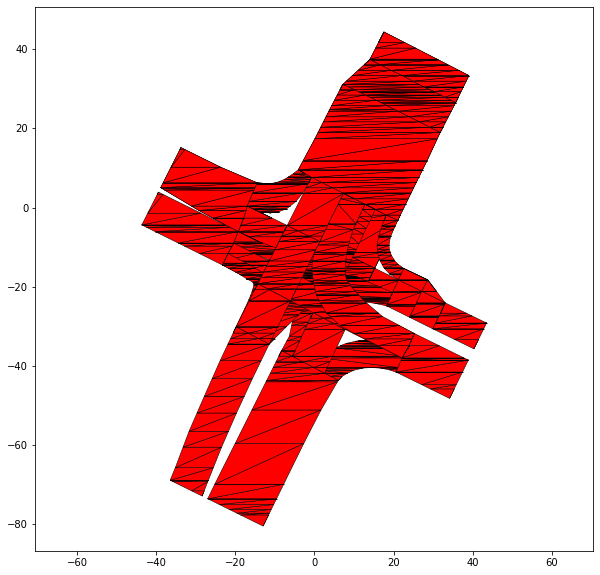

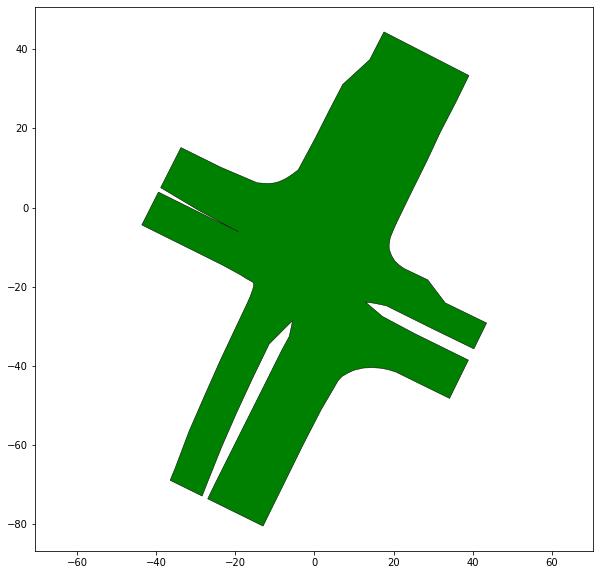

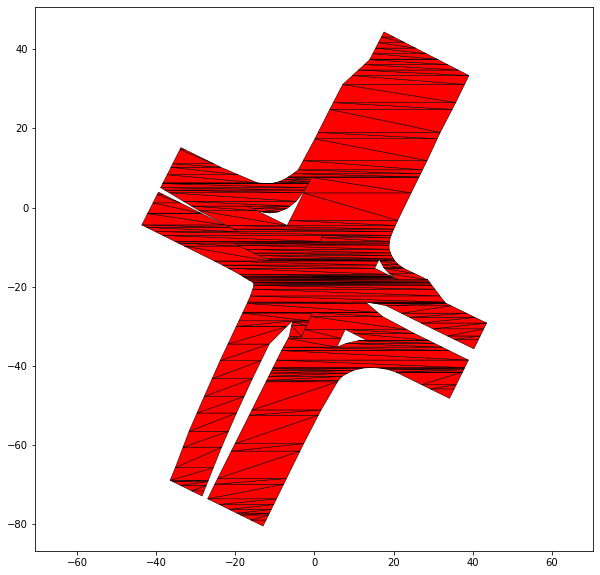

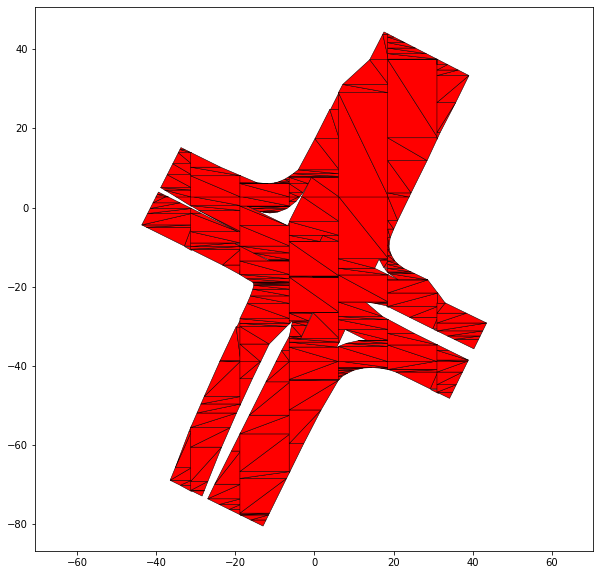

191 CHN_Sha-6_3_T-1


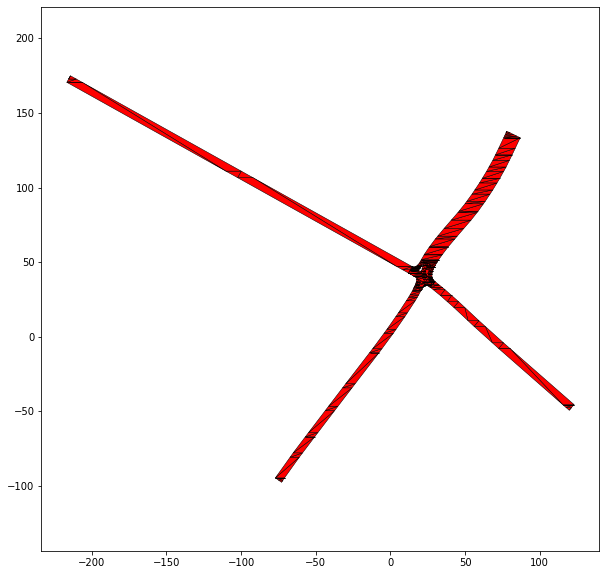

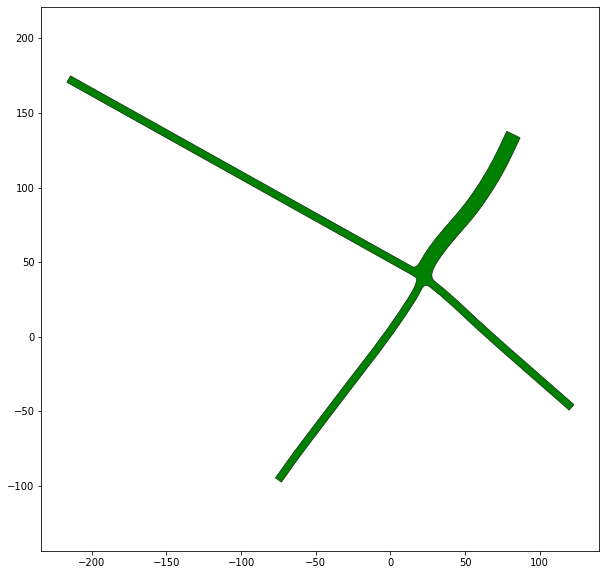

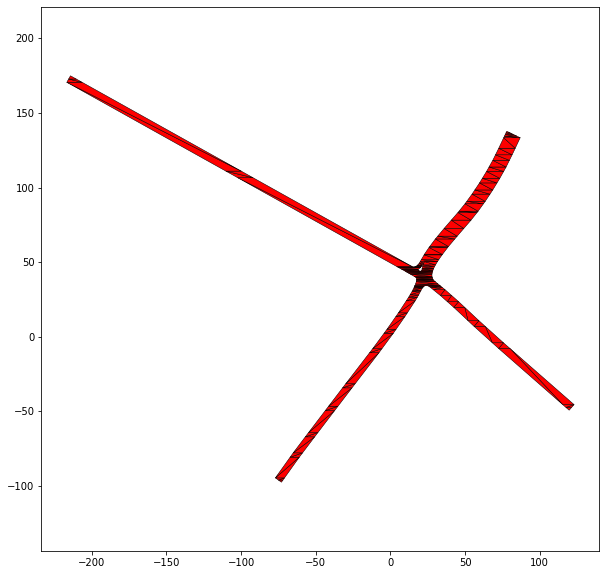

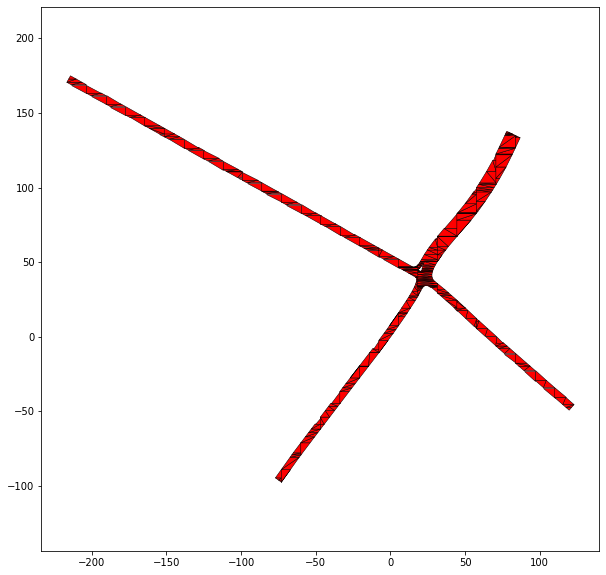

192 USA_Lanker-2_22_T-1


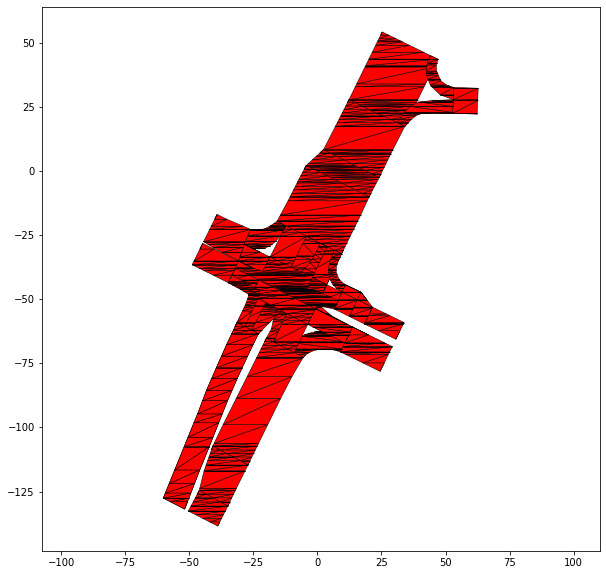

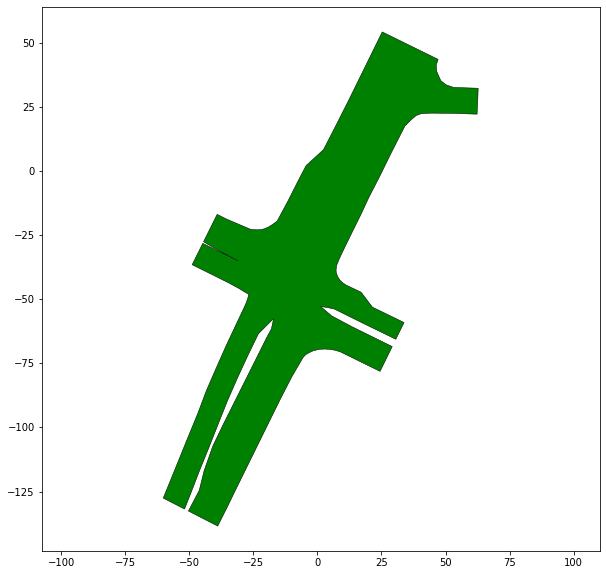

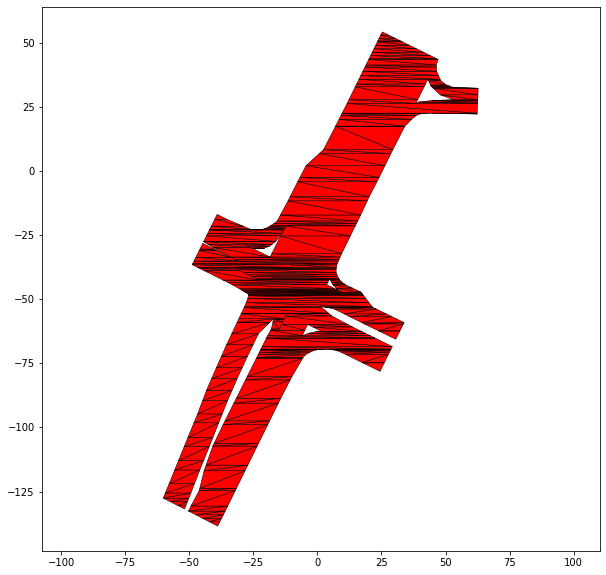

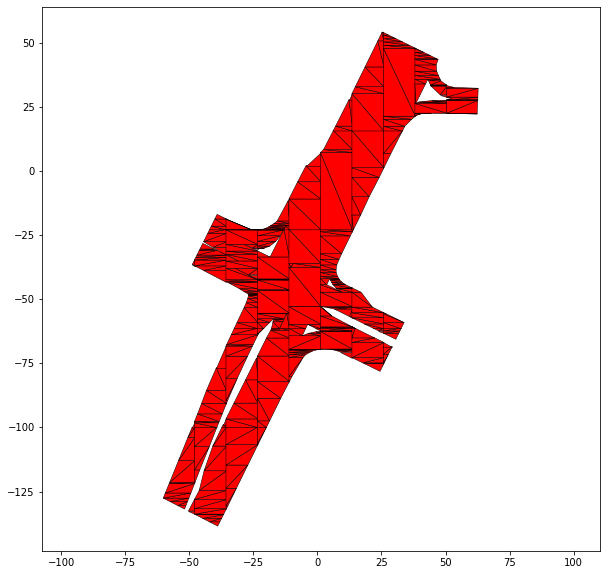

193 USA_US101-25_1_T-1


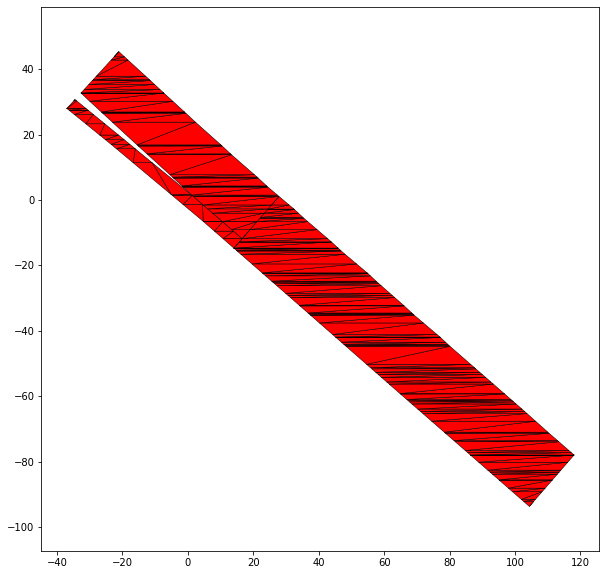

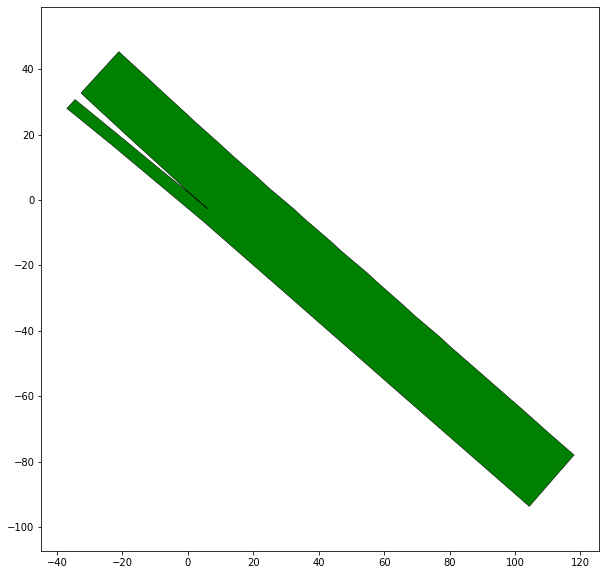

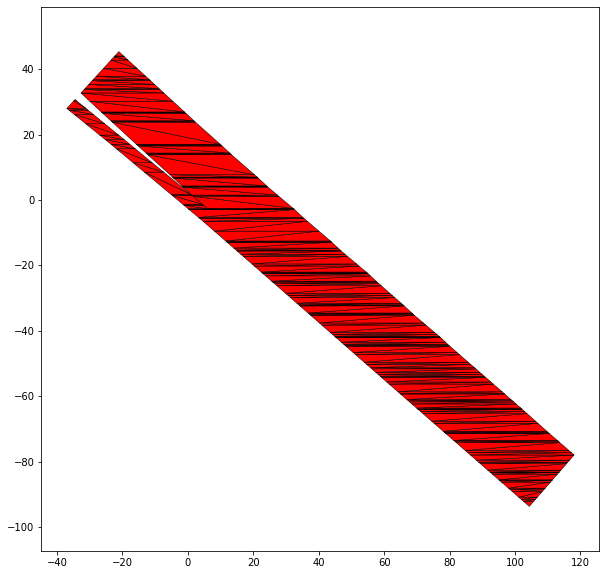

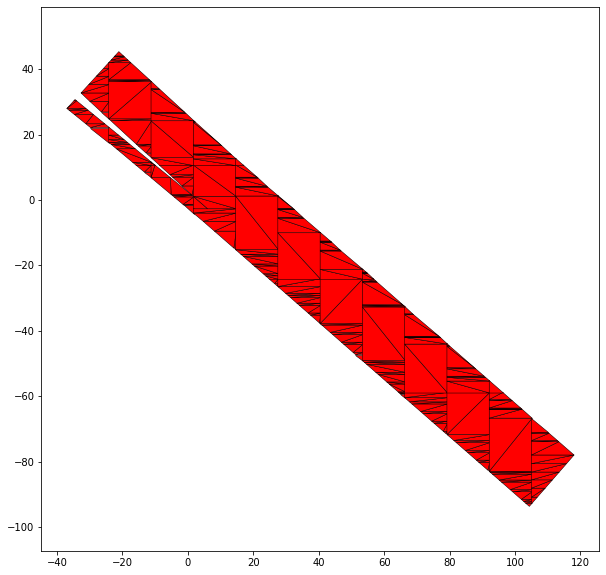

196 CHN_Sha-17_1_T-1


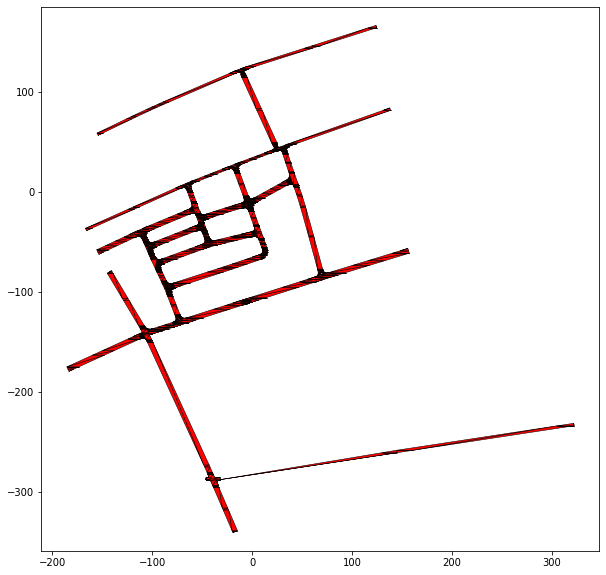

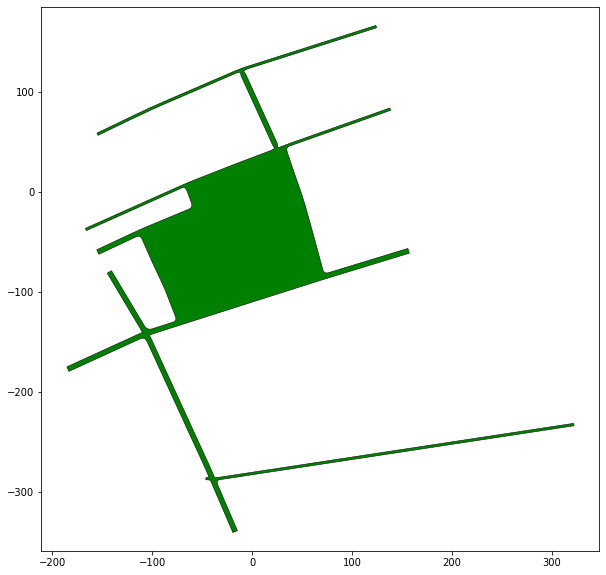

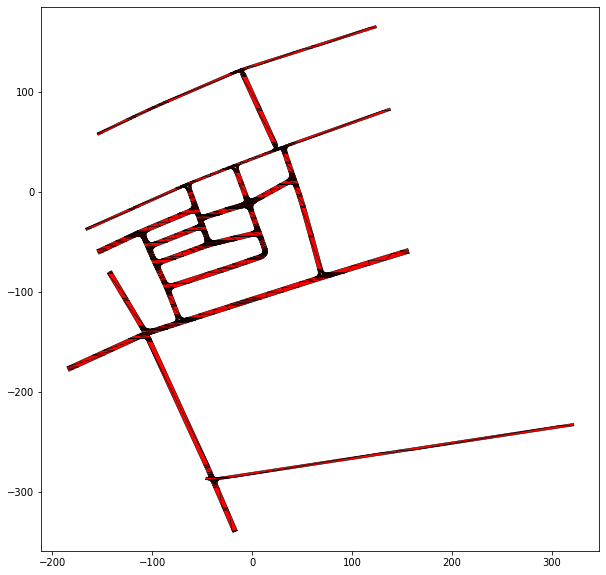

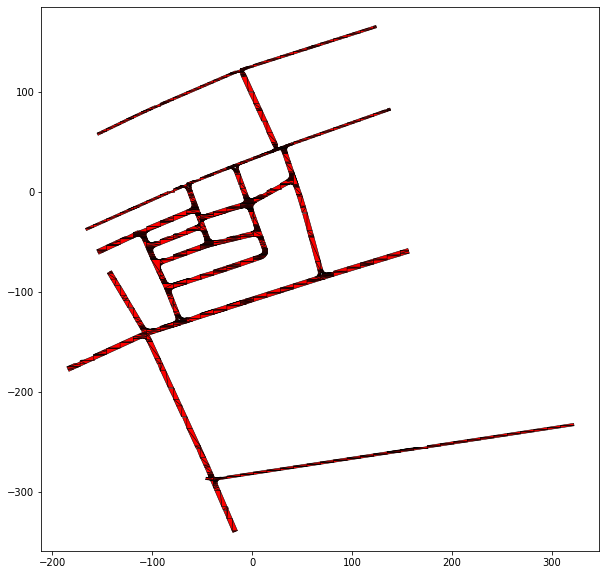

198 CHN_Sha-4_6_T-1


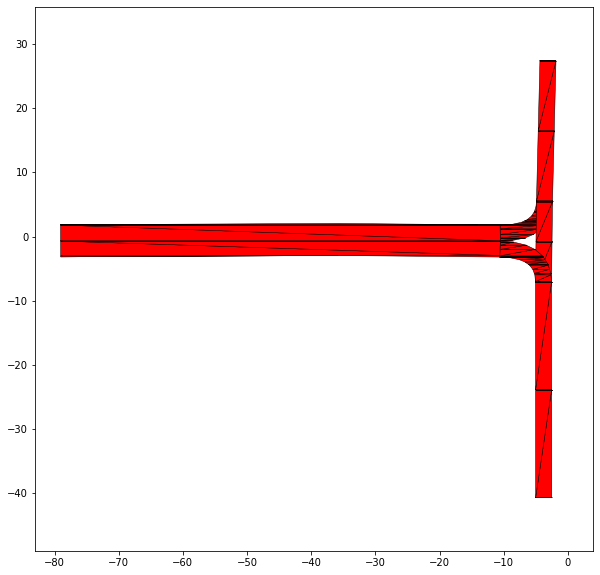

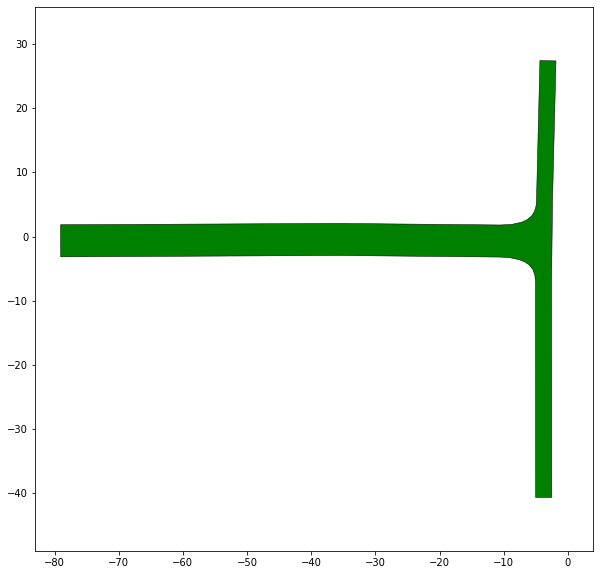

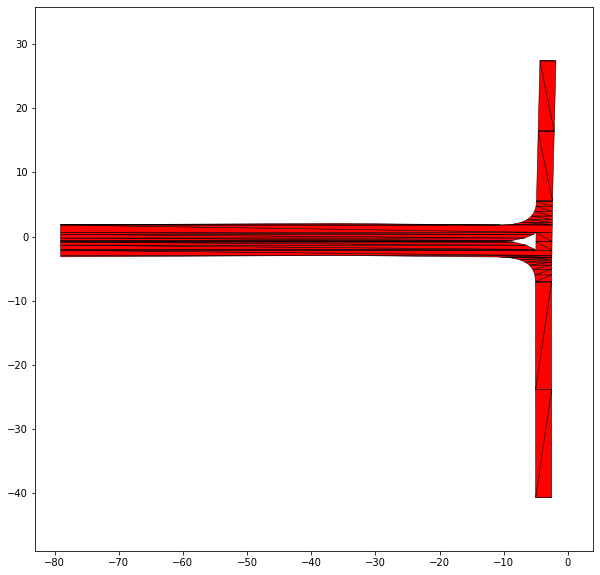

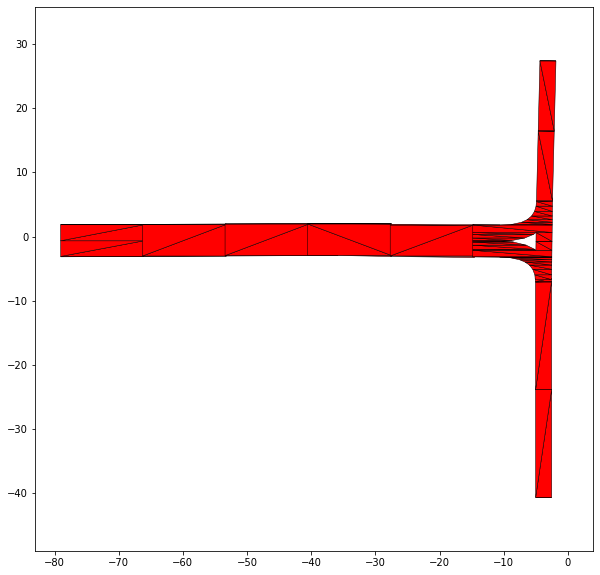

206 USA_US101-22_2_T-1


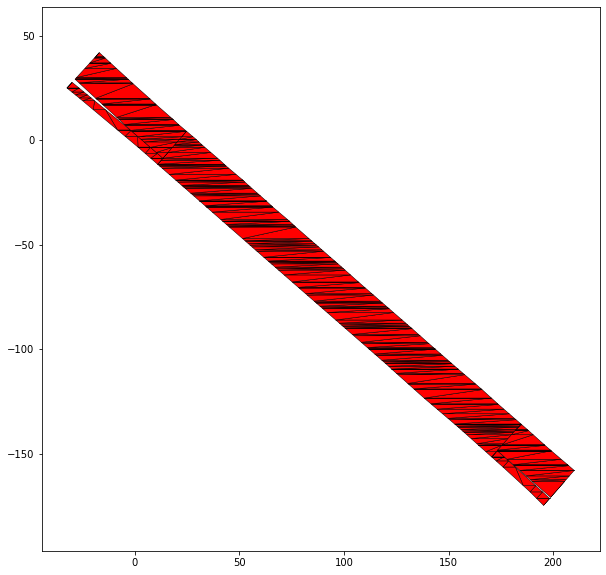

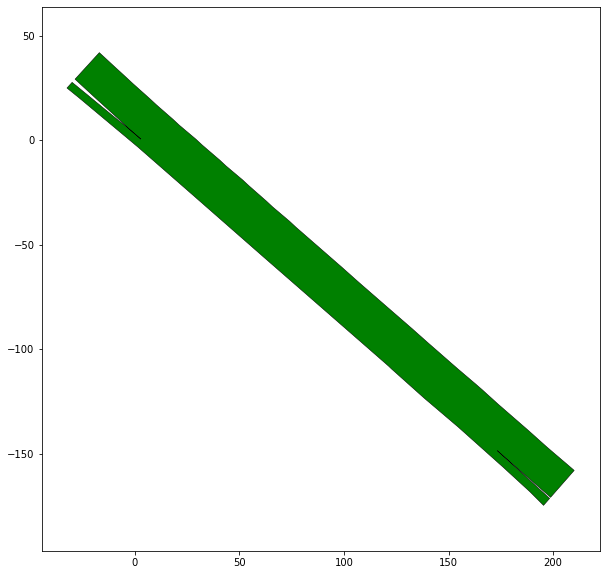

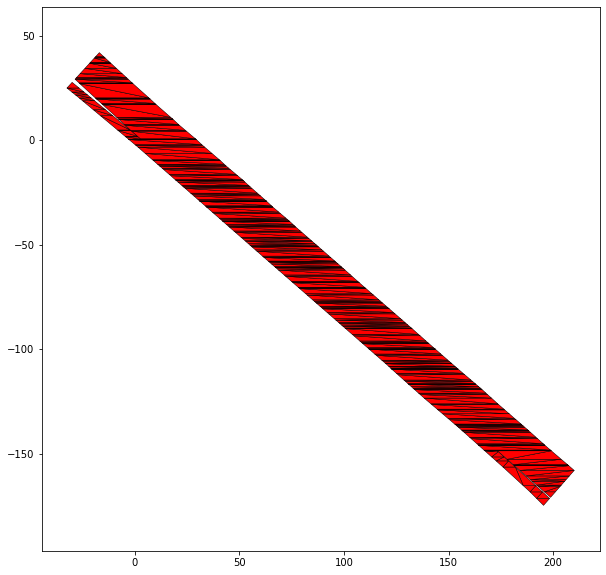

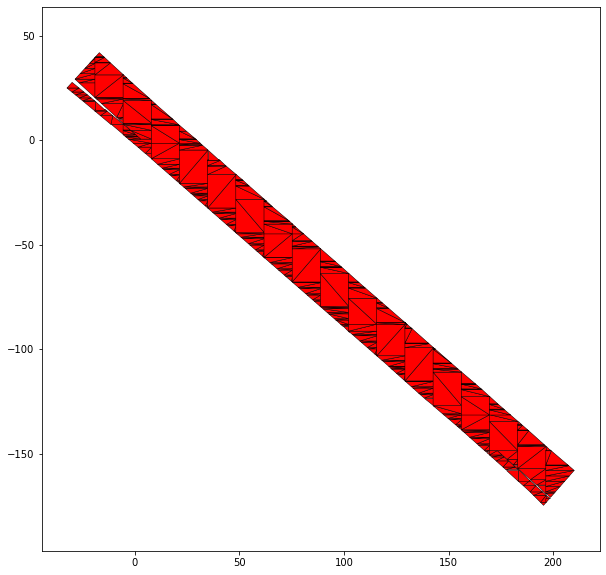

210 USA_US101-22_1_T-1


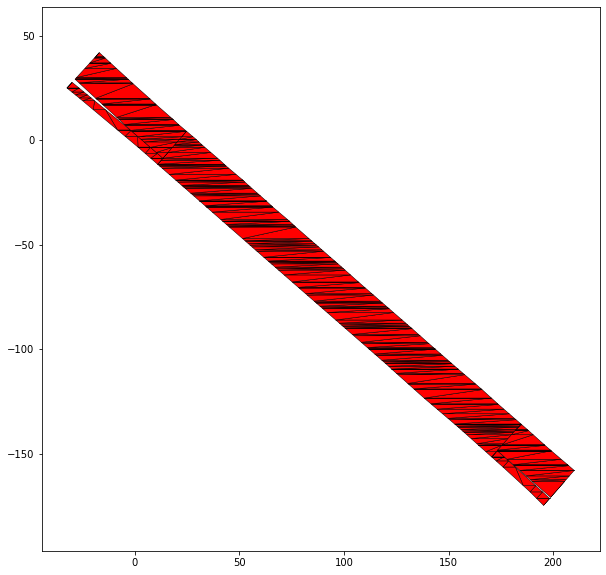

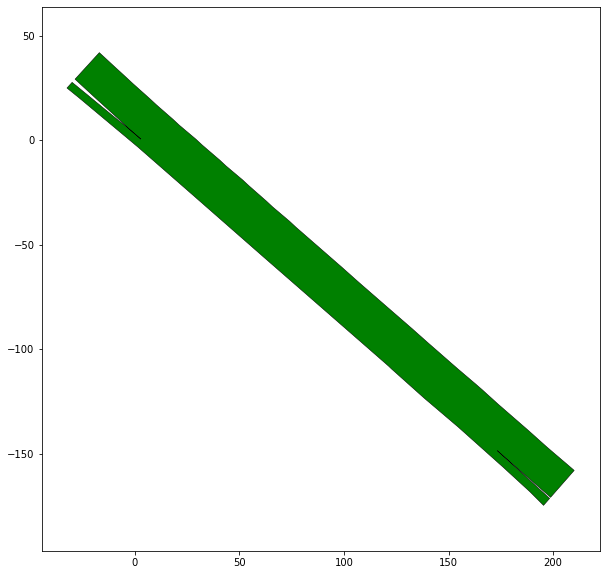

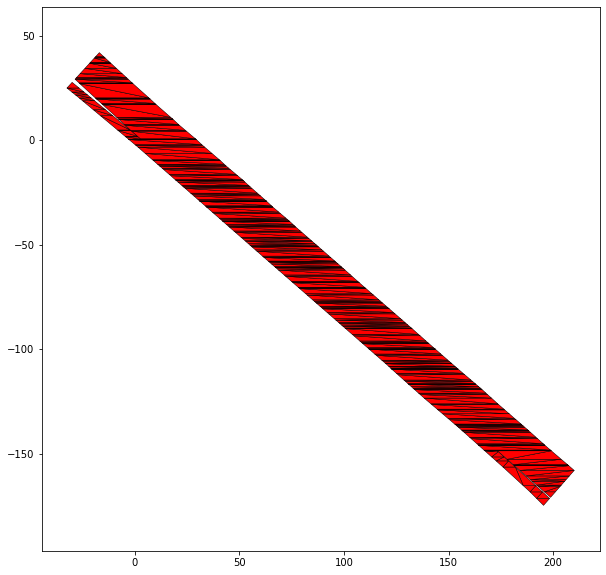

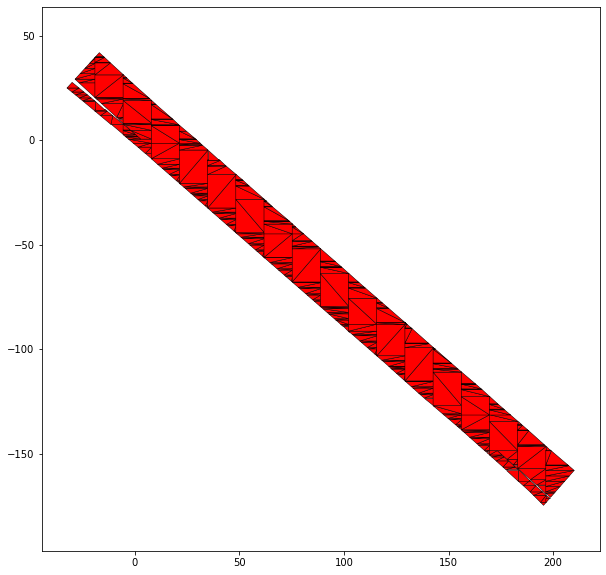

211 DEU_Muc-26_1_T-1


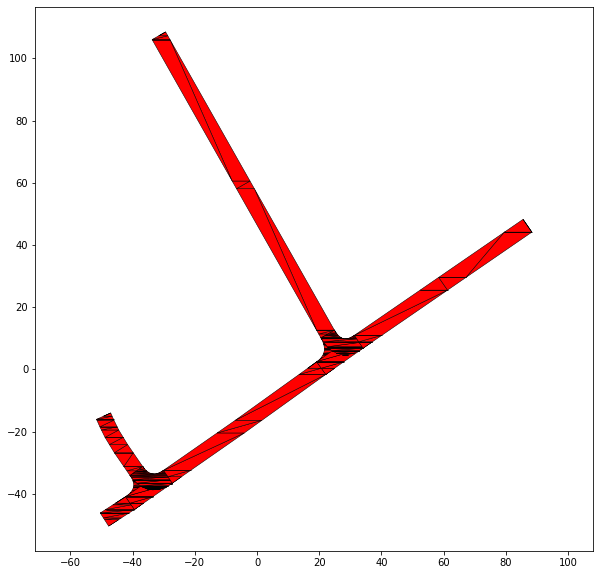

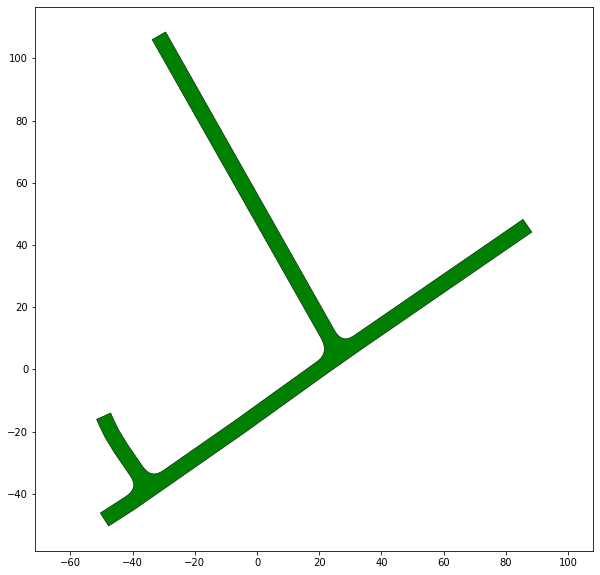

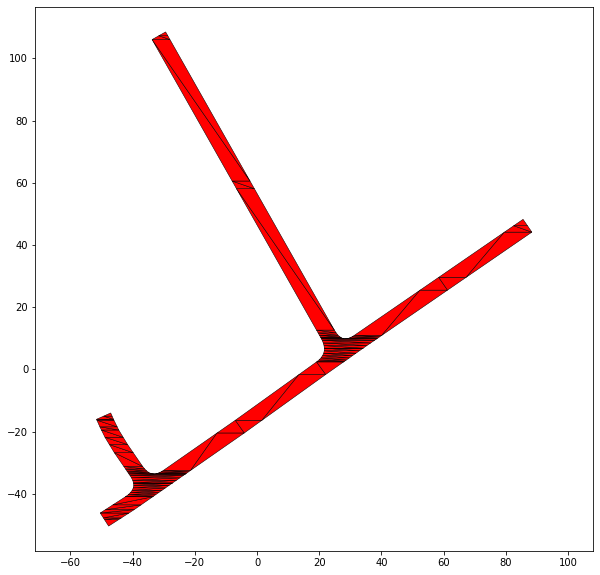

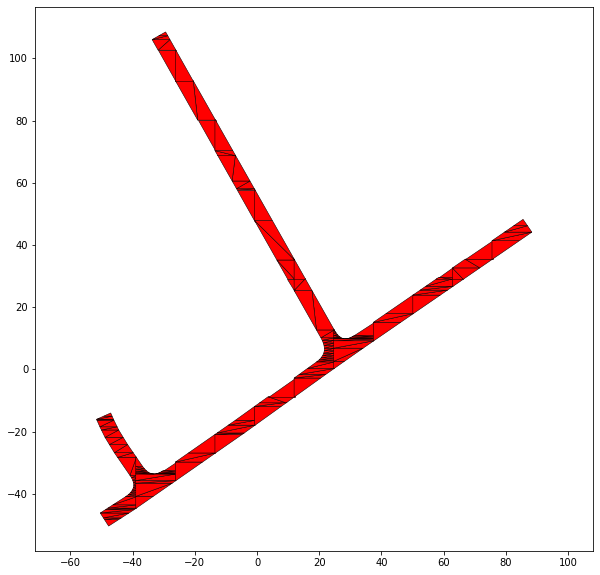

212 RUS_Bicycle-14_1_T-1


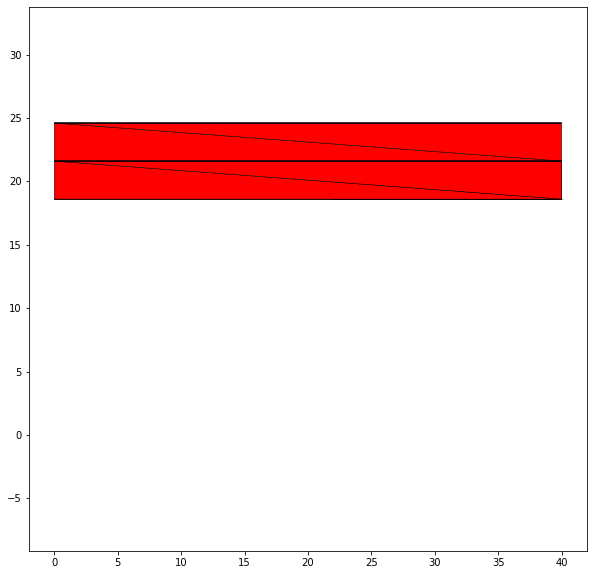

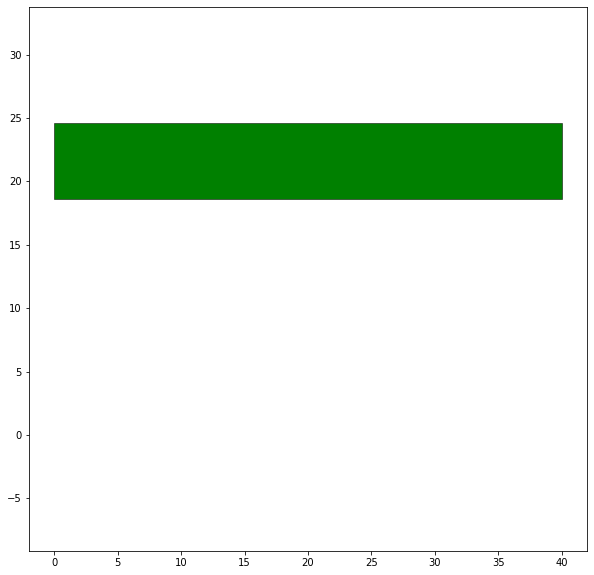

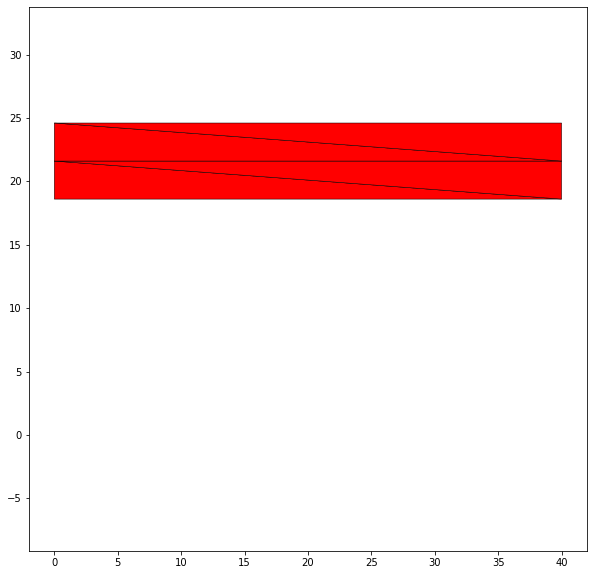

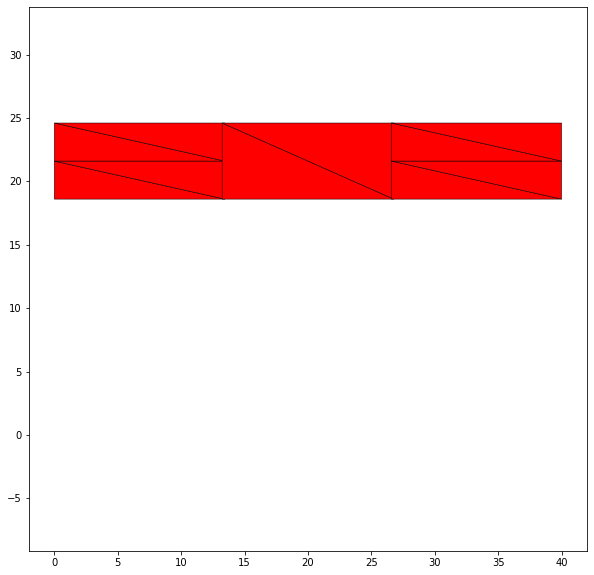

214 USA_US101-14_2_T-1


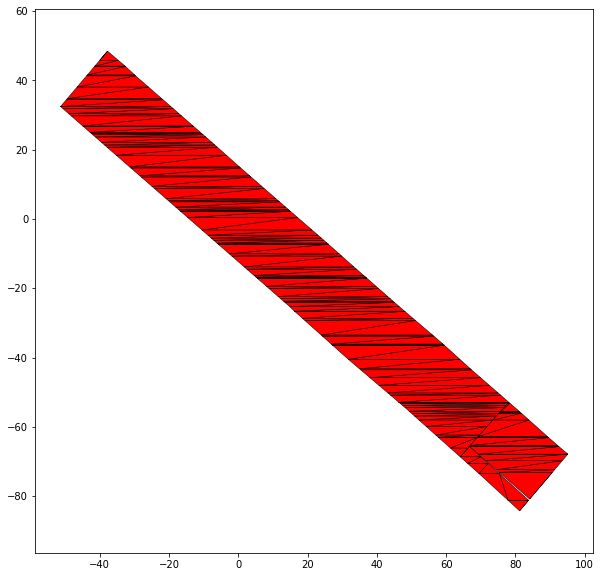

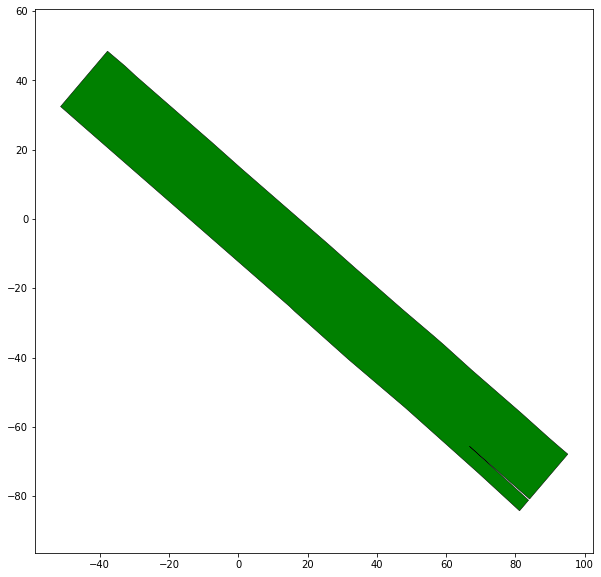

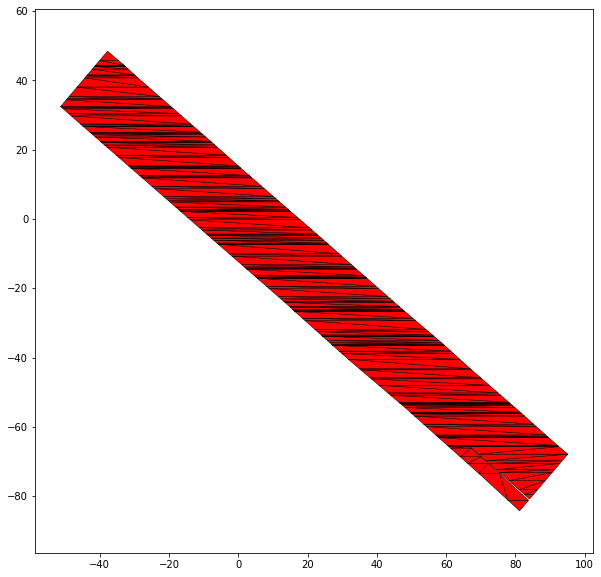

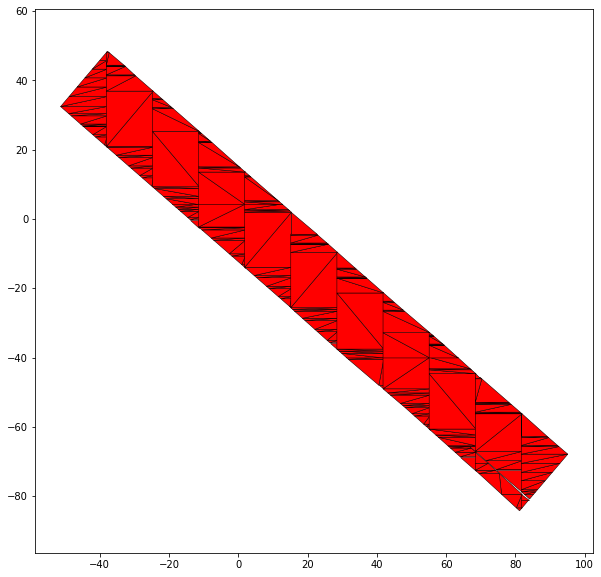

223 DEU_Muc-16_2_T-1


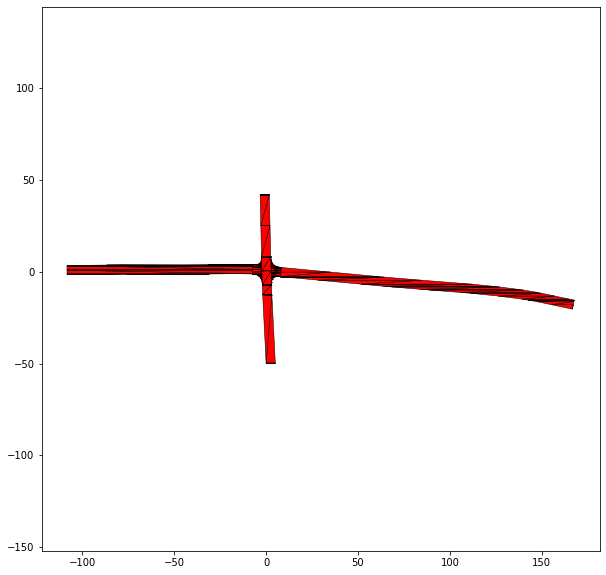

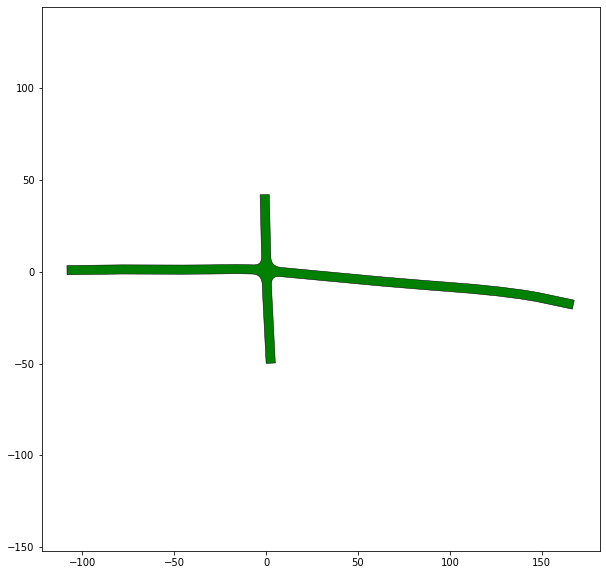

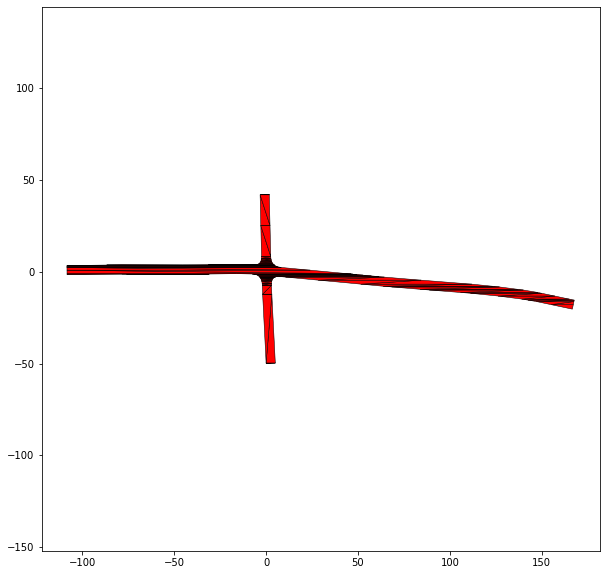

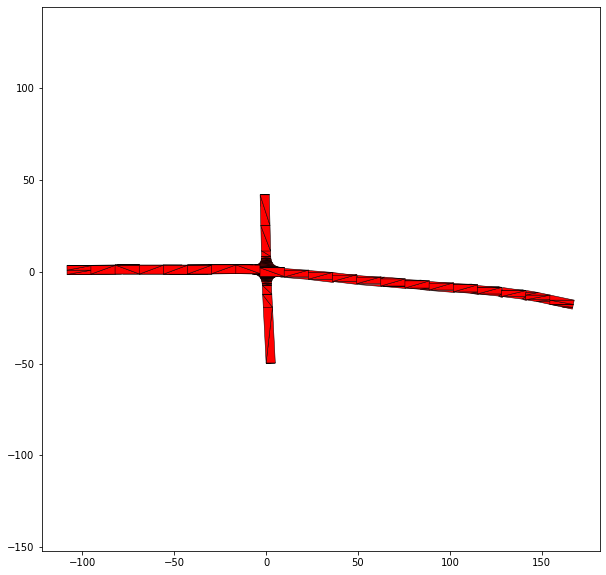

228 RUS_Bicycle-3_1_T-1


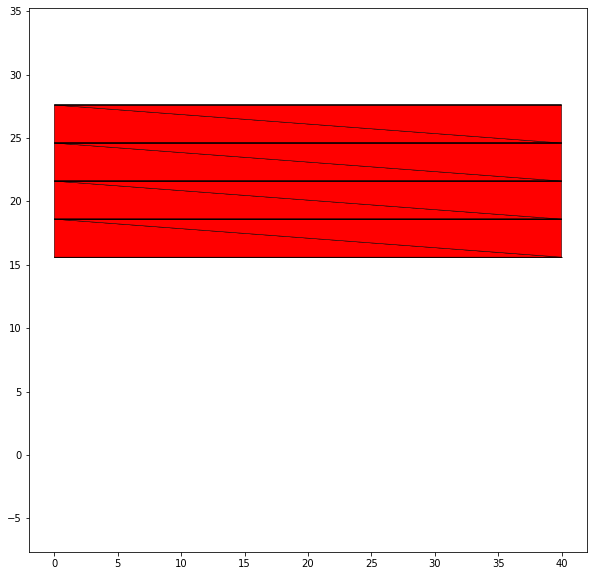

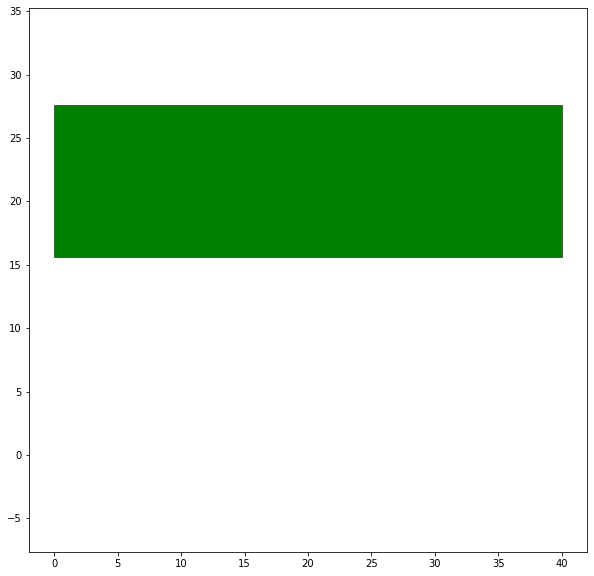

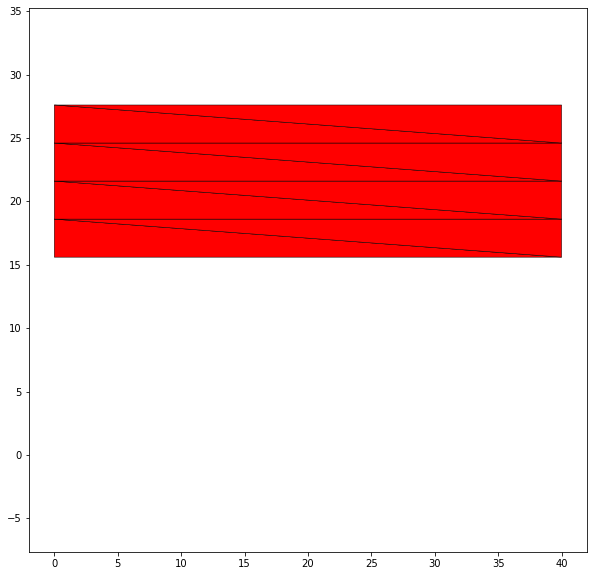

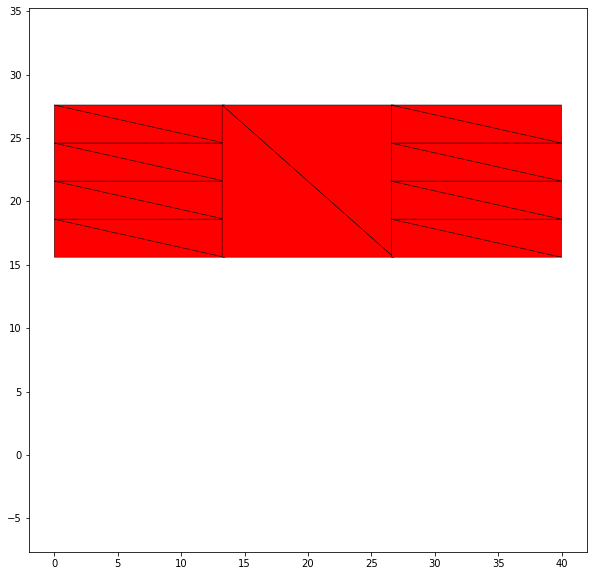

229 CHN_Sha-6_9_T-1


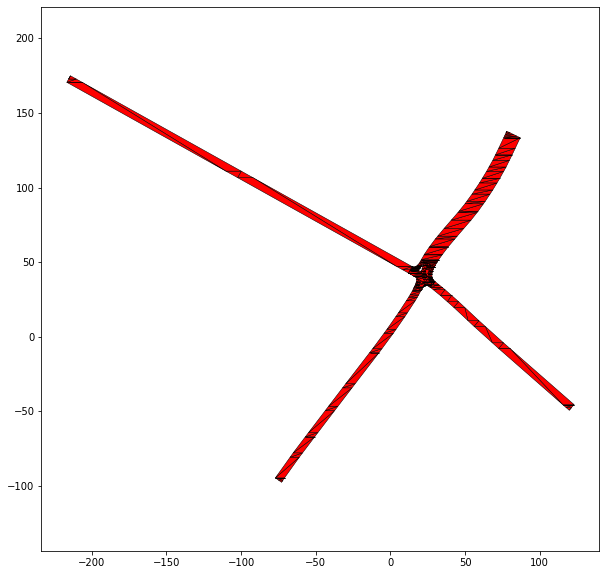

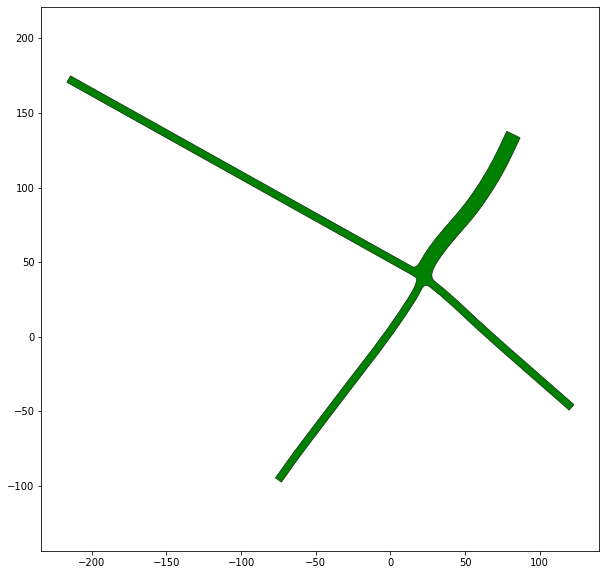

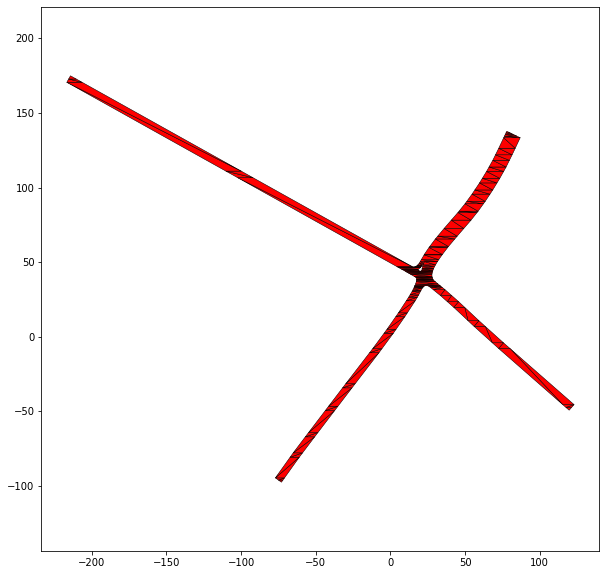

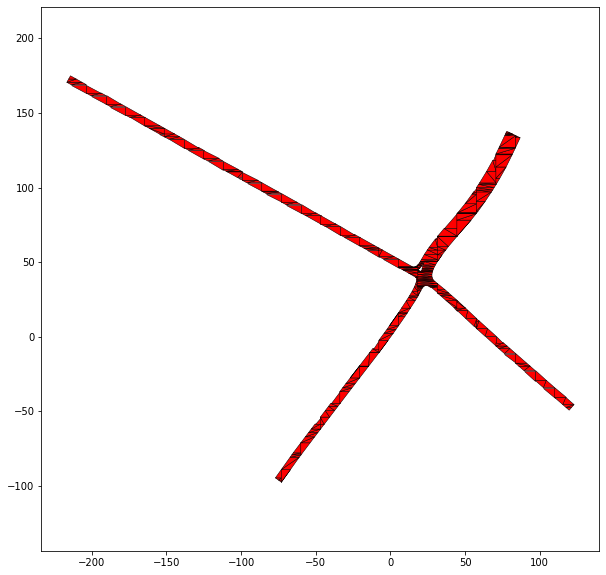

230 DEU_Muc-14_1_T-1


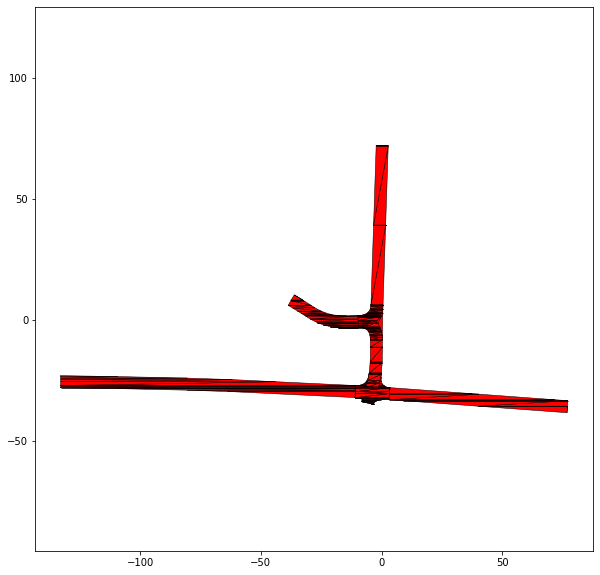

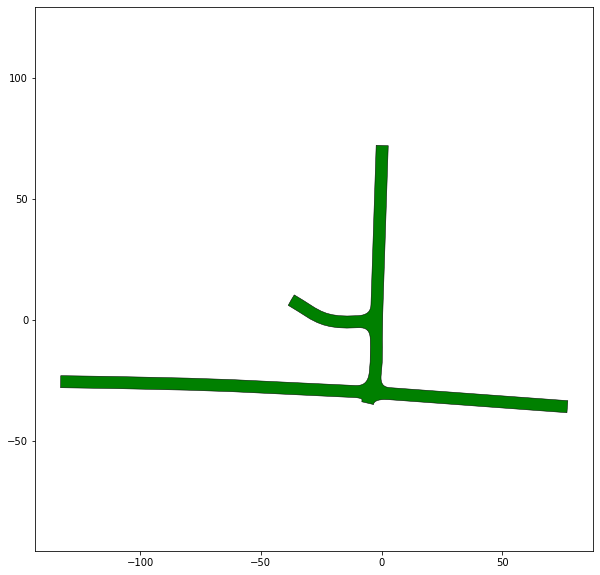

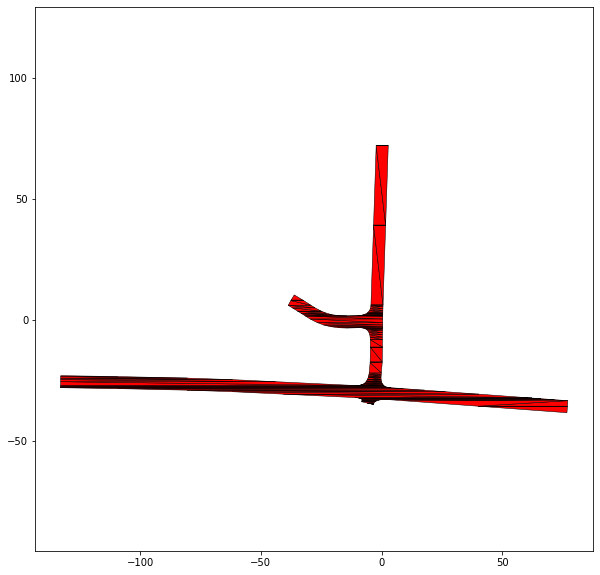

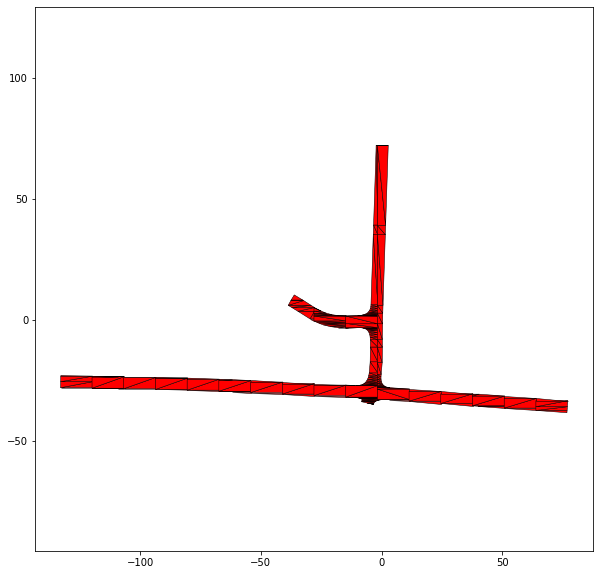

231 USA_Peach-4_2_T-1


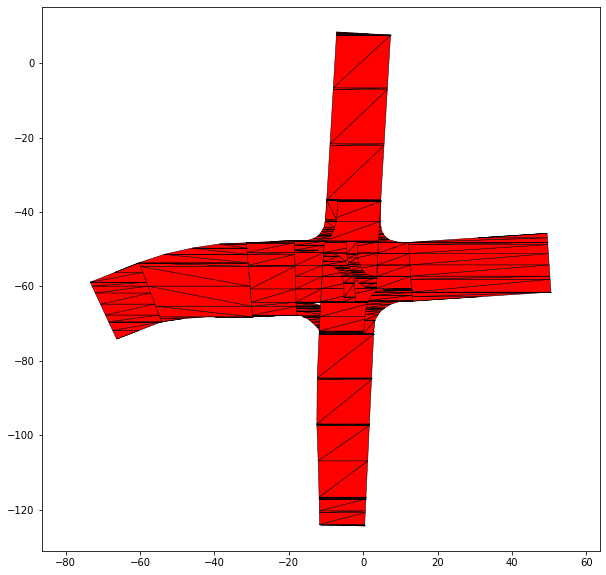

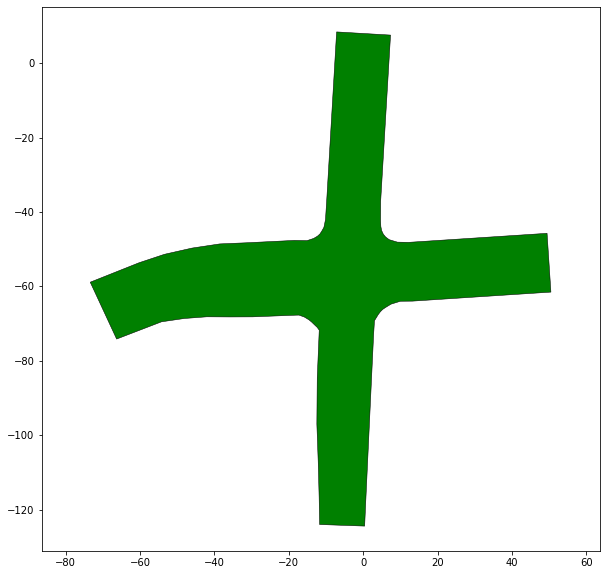

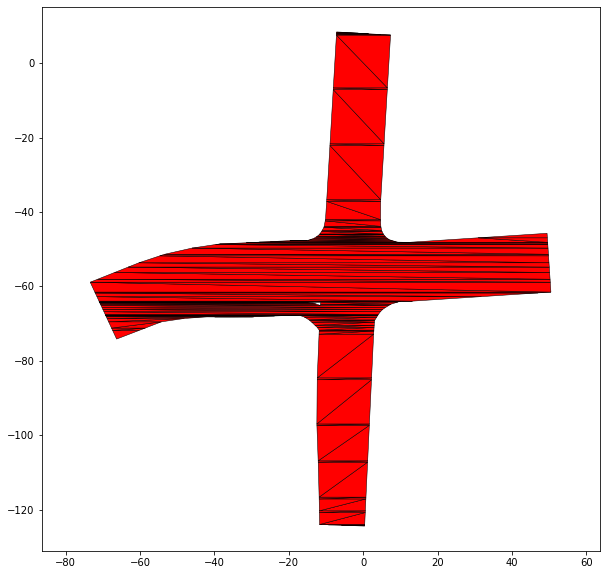

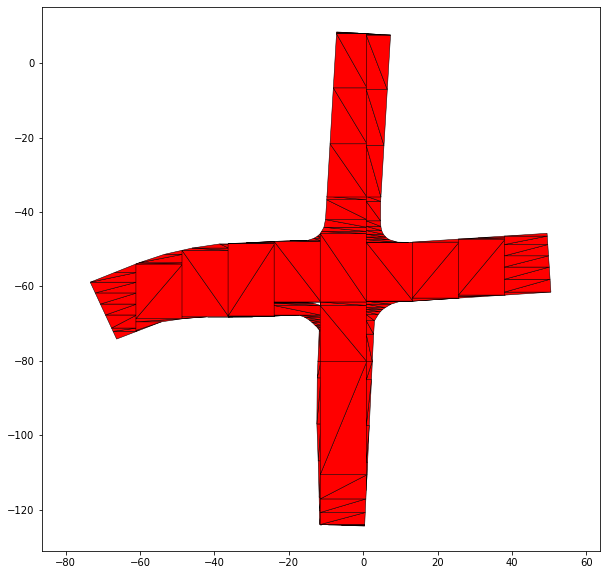

235 CHN_Sha-2_8_T-1


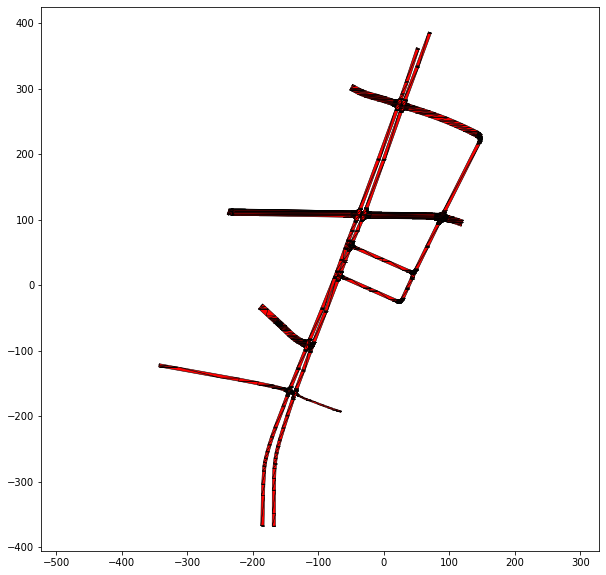

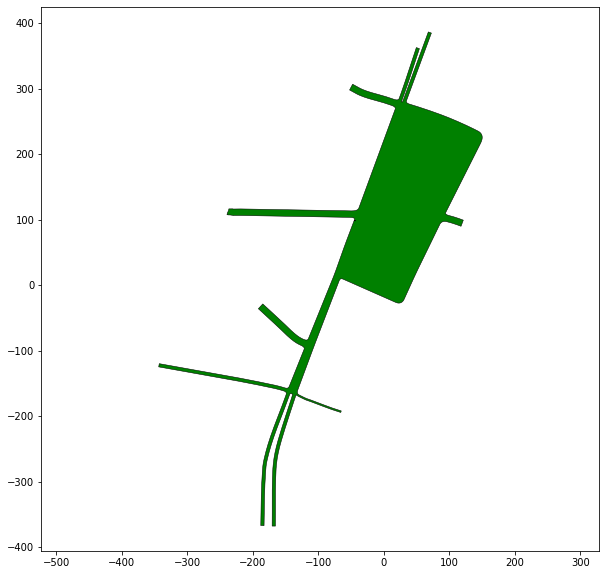

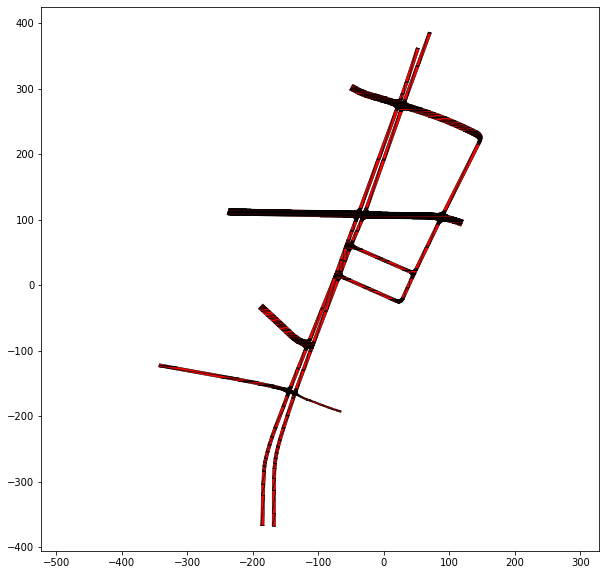

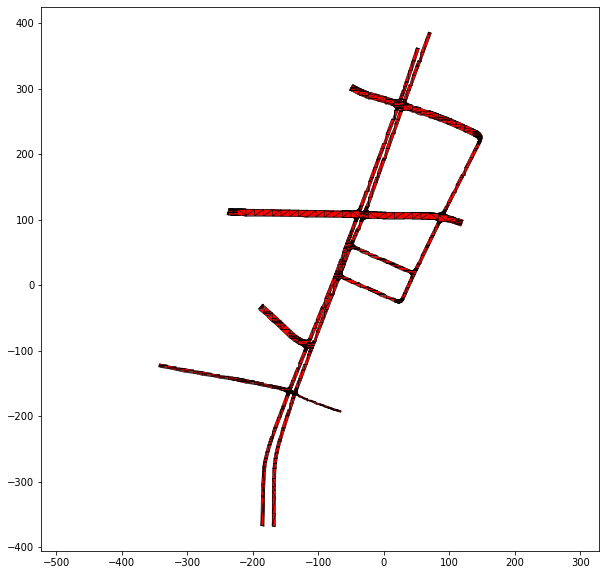

238 DEU_Muc-1_1_T-1


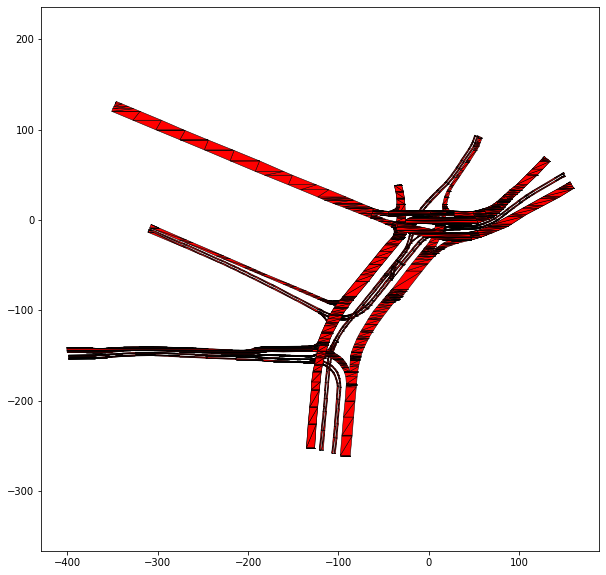

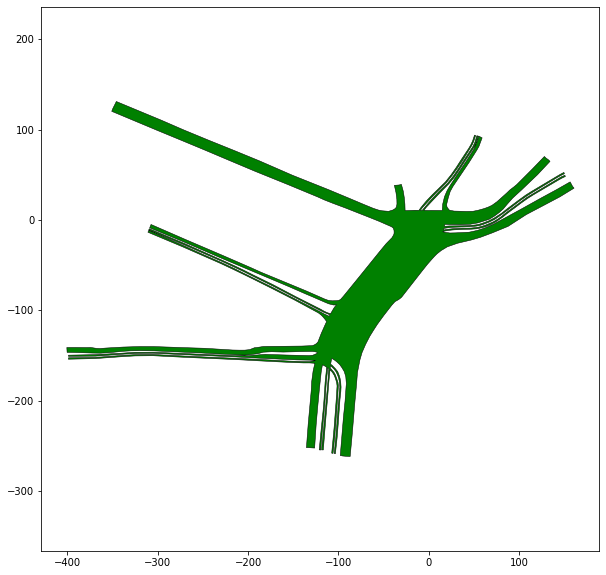

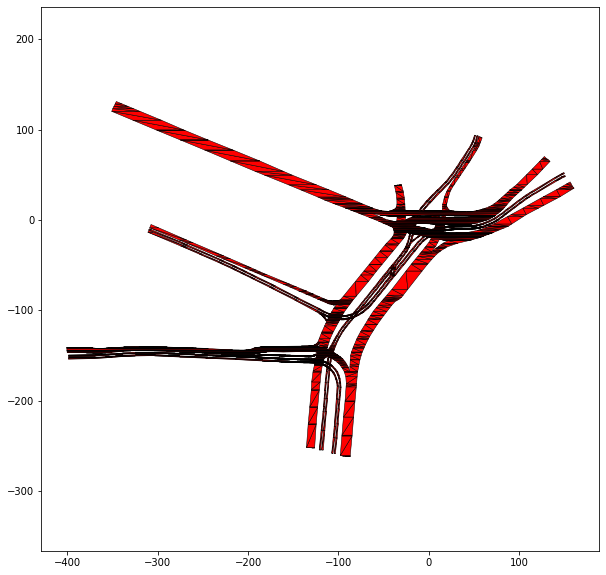

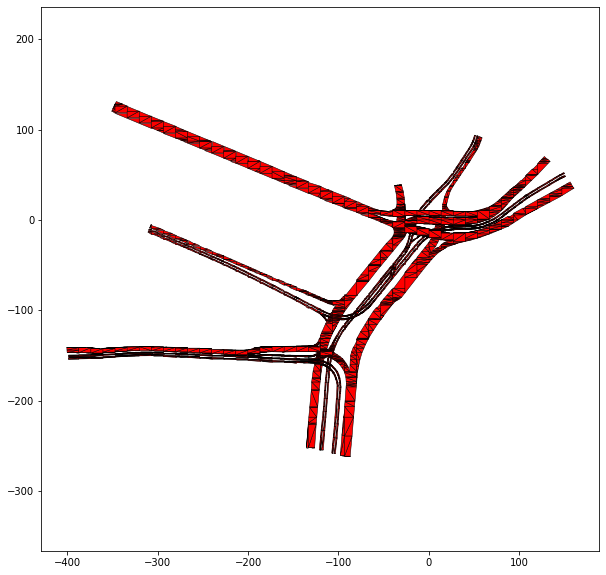

240 CHN_Sha-1_8_T-1


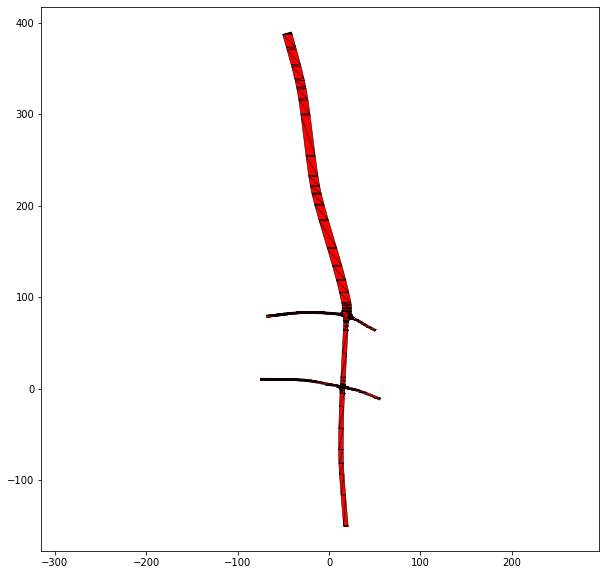

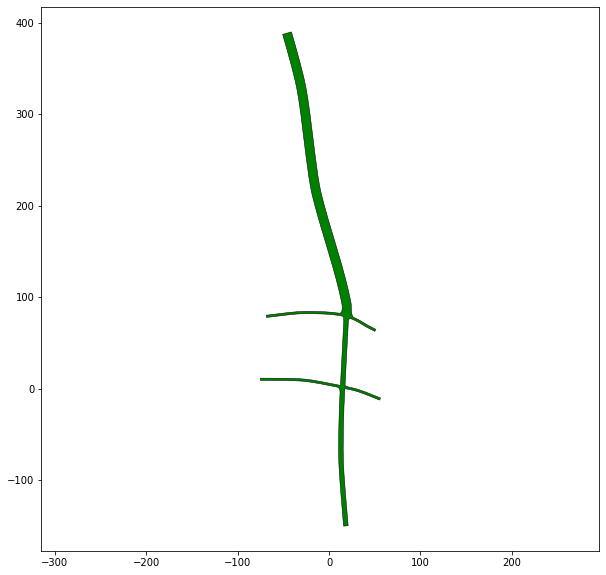

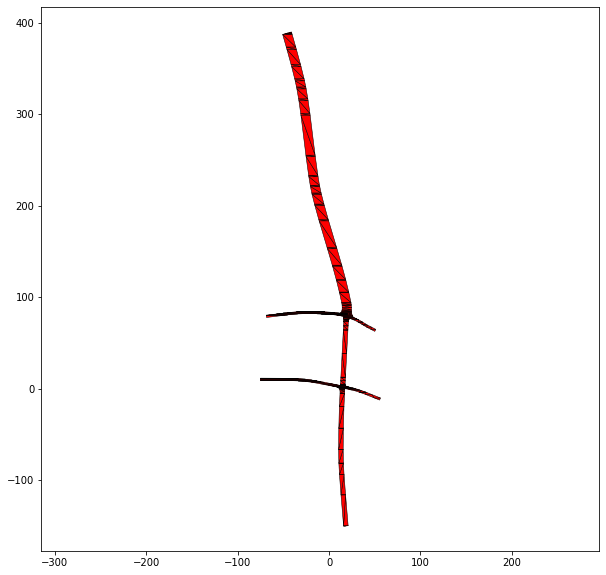

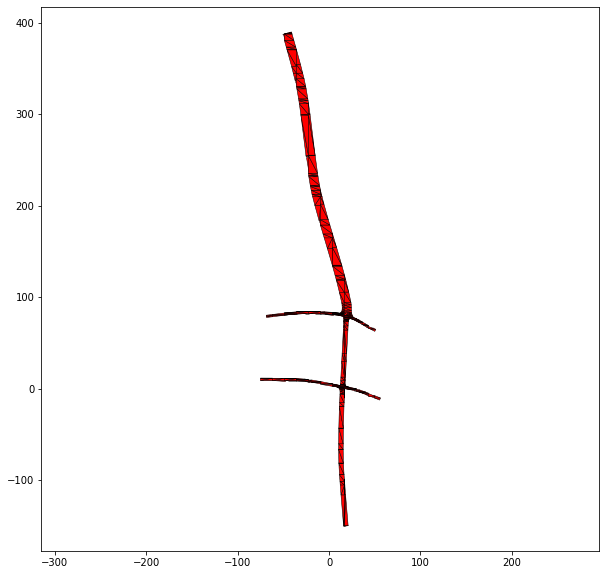

241 CHN_Sha-2_2_T-1


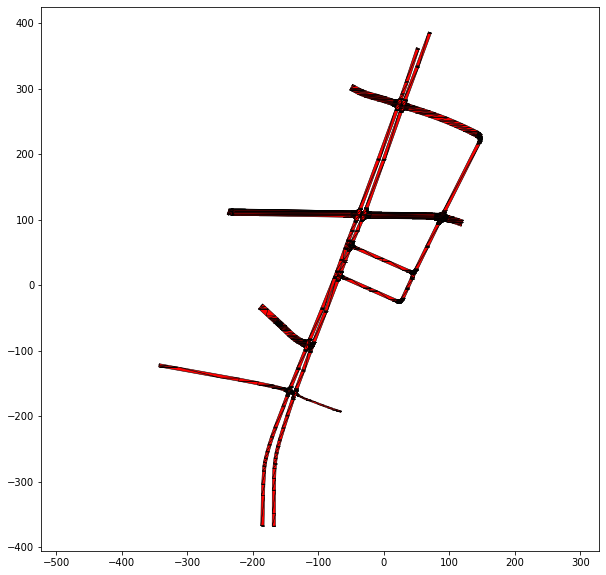

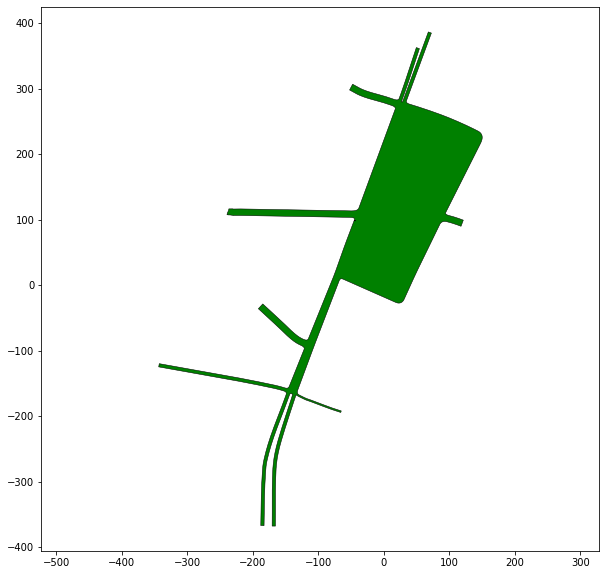

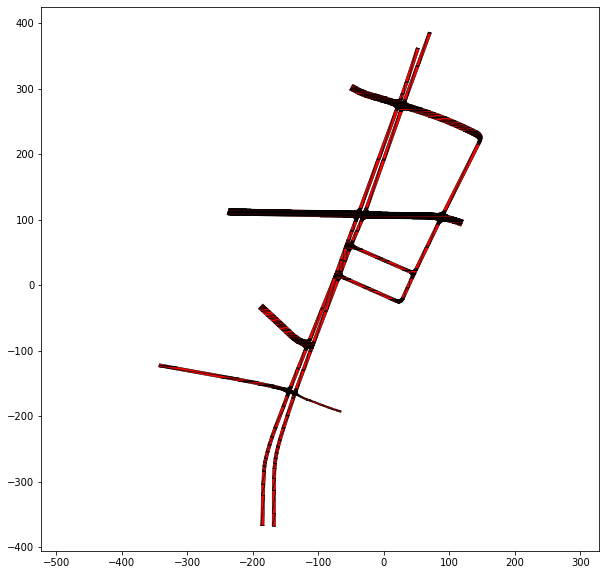

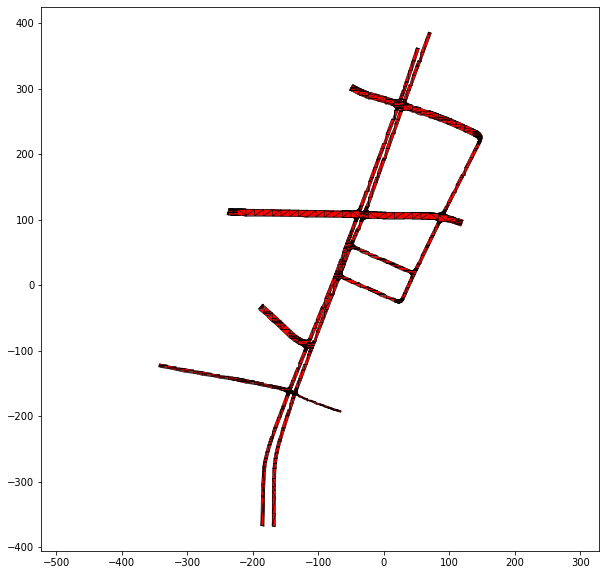

245 USA_US101-14_1_T-1


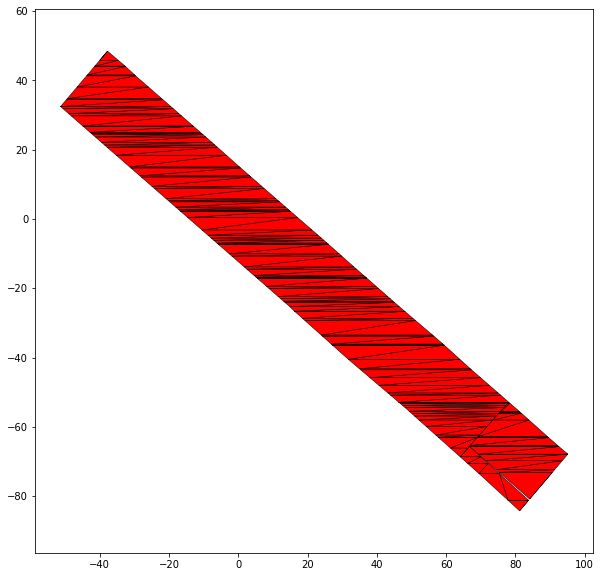

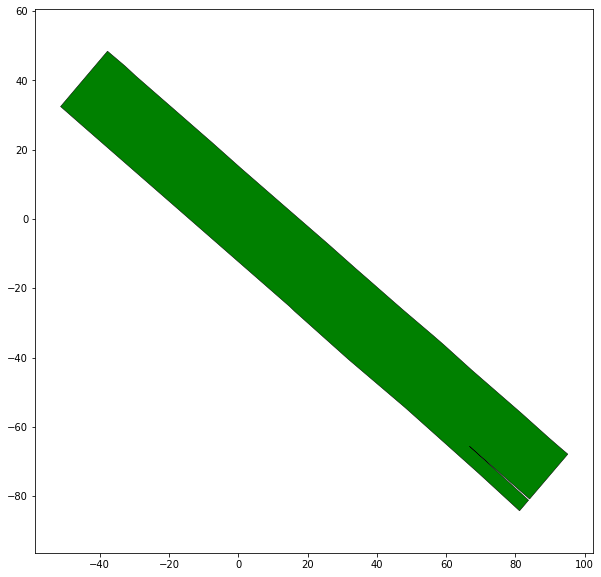

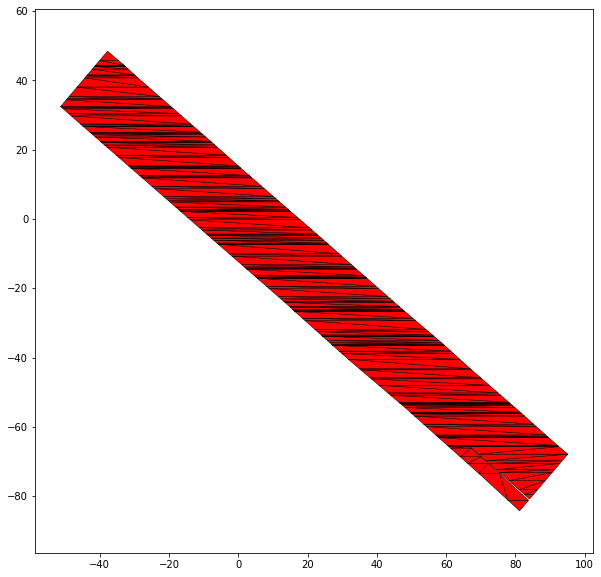

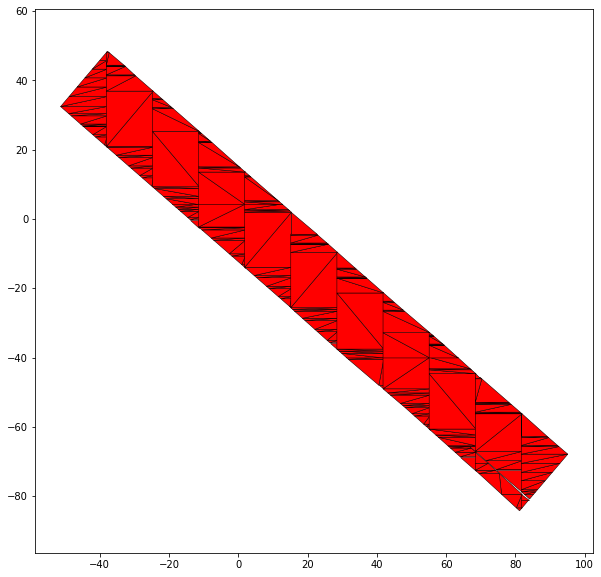

246 USA_Lanker-2_18_T-1


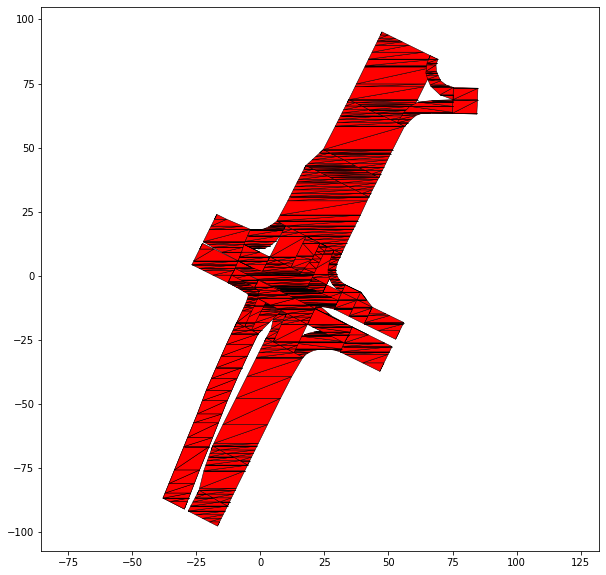

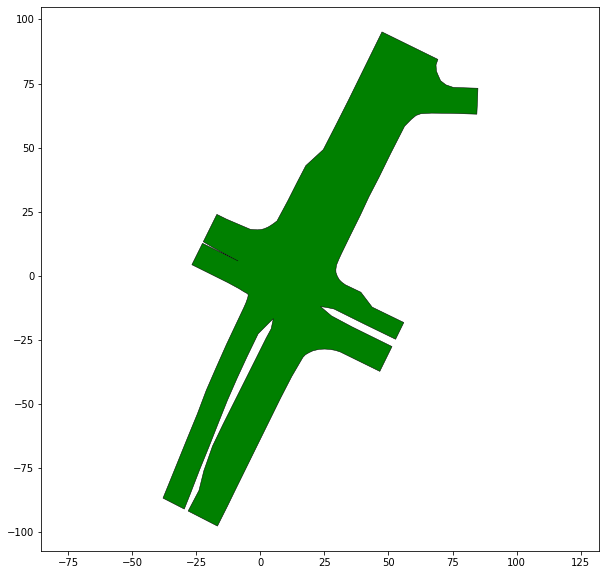

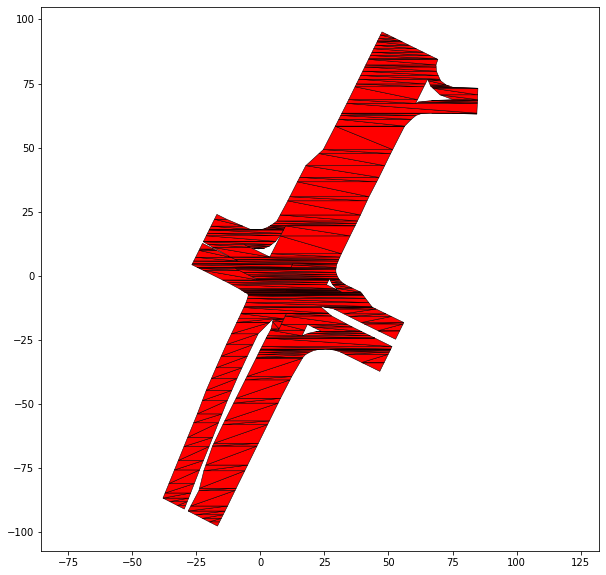

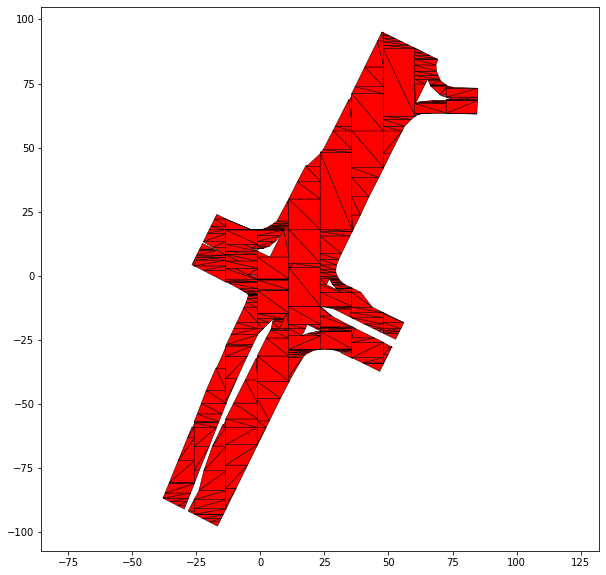

271 DEU_Muc-28_1_T-1


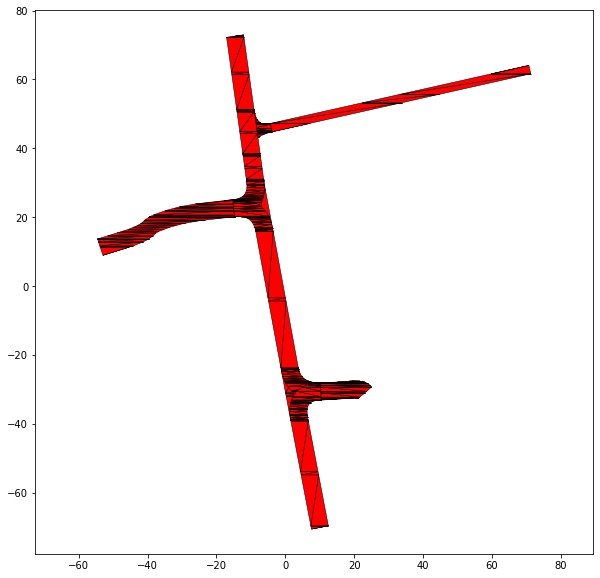

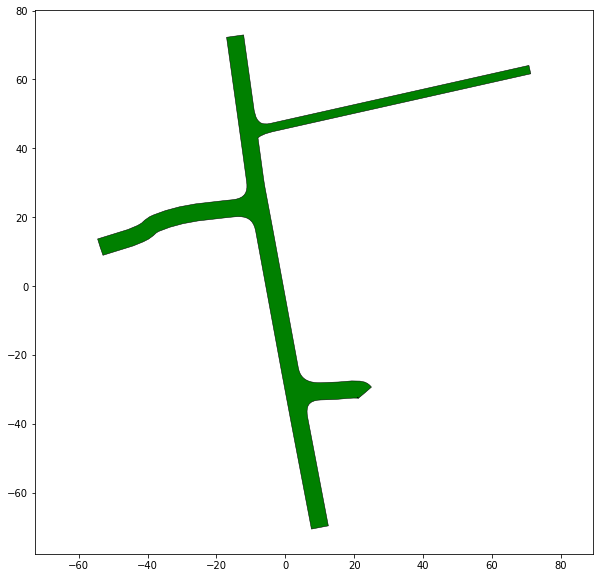

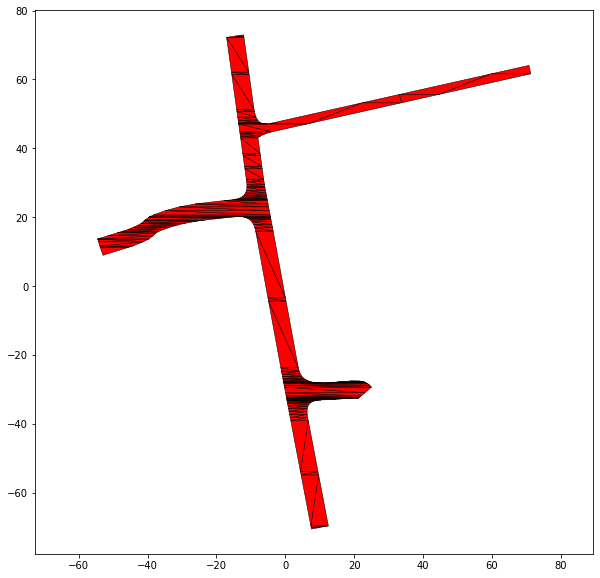

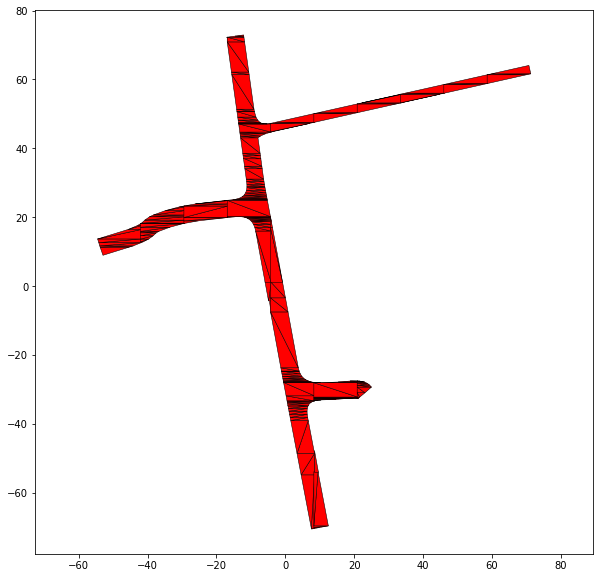

273 USA_Lanker-1_2_T-1


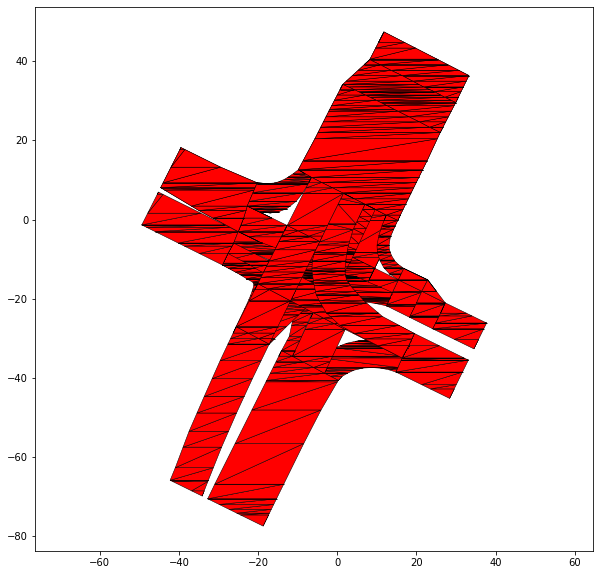

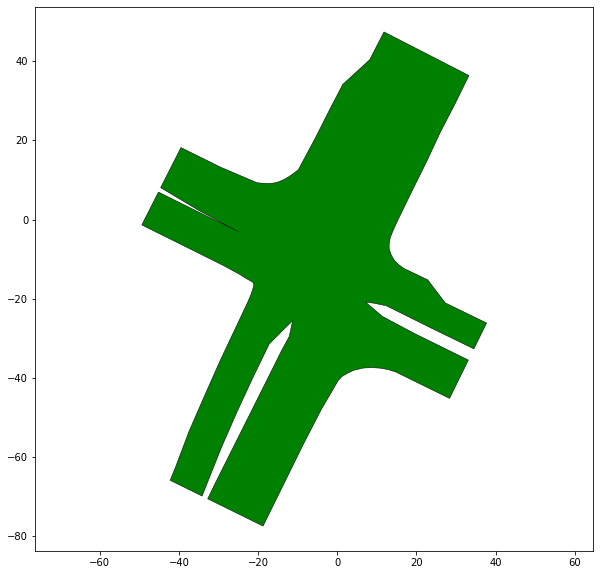

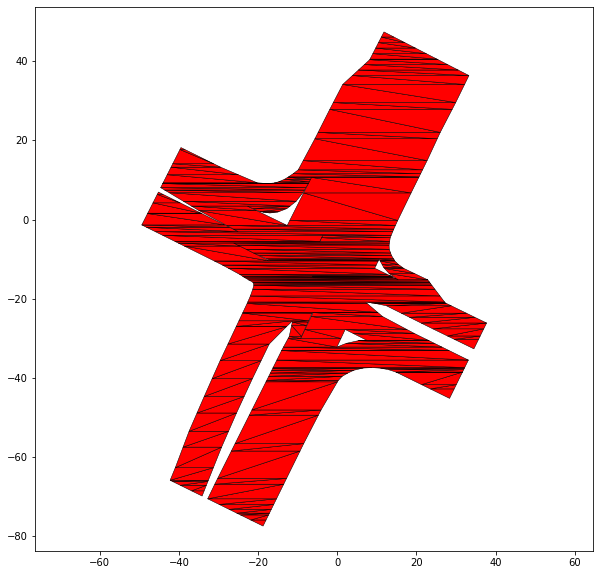

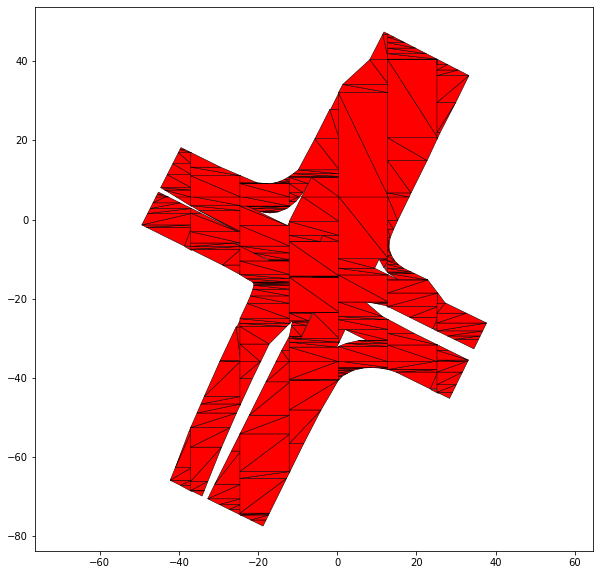

274 USA_Lanker-2_20_T-1


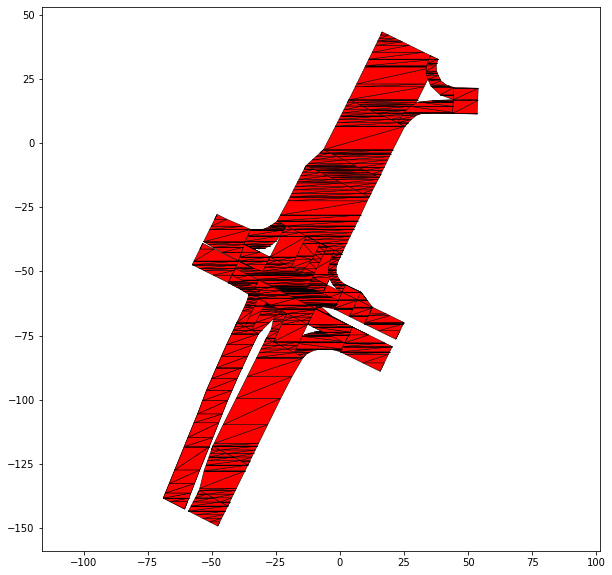

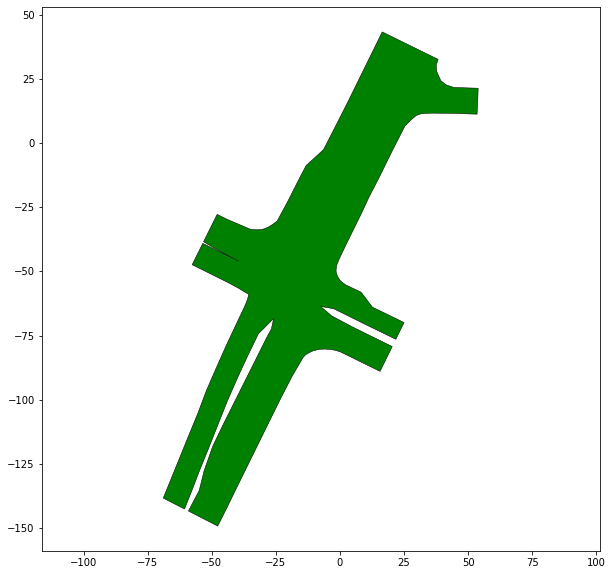

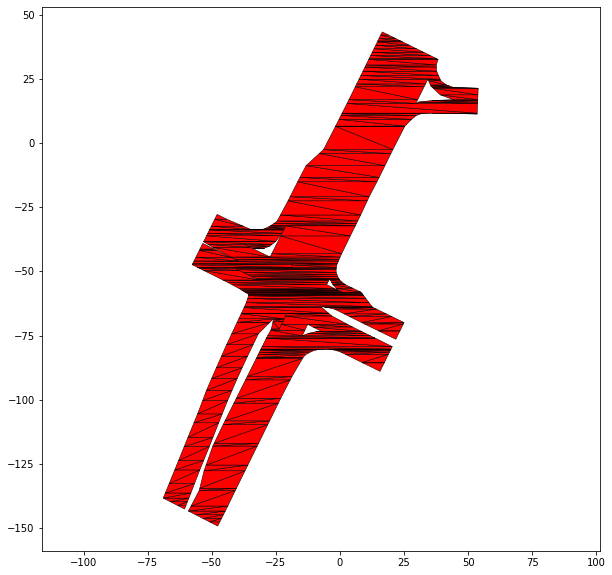

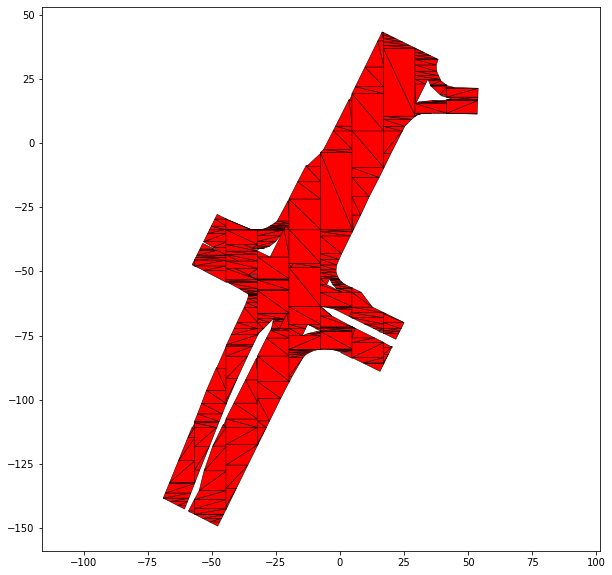

275 DEU_Muc-11_1_T-1


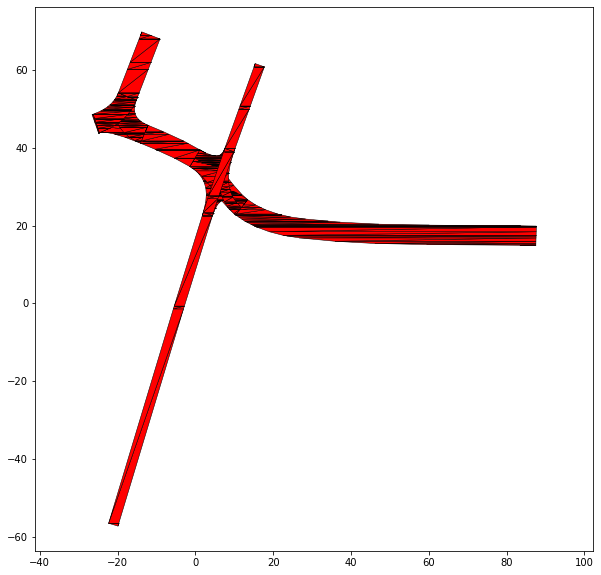

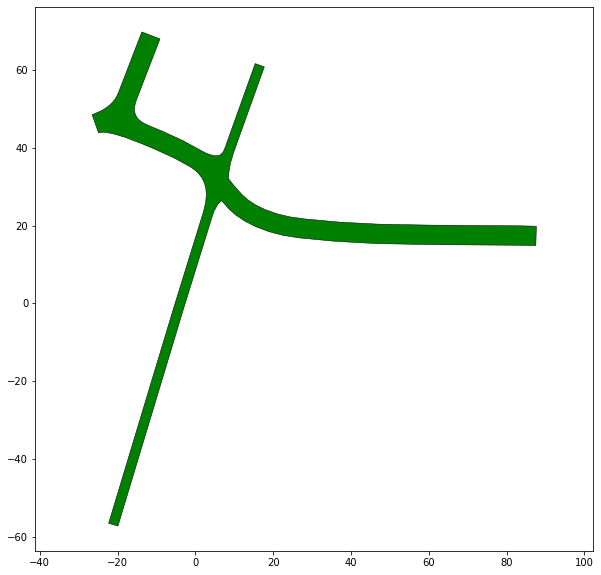

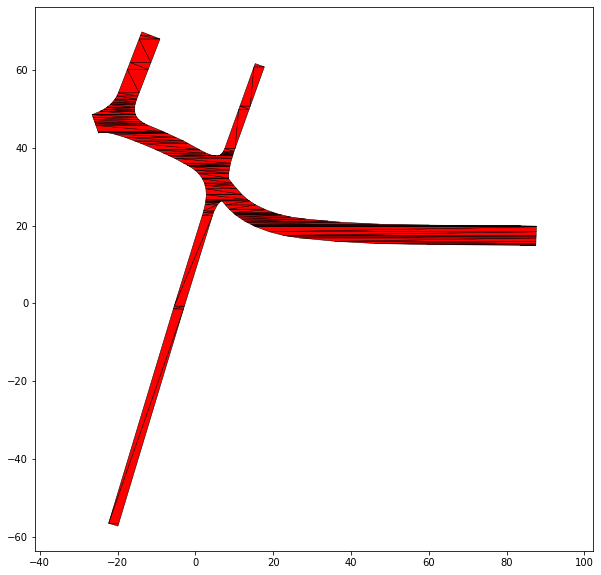

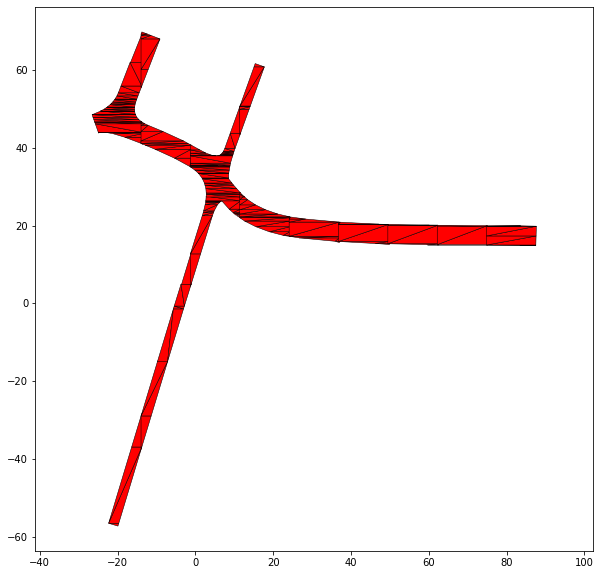

283 DEU_Muc-18_2_T-1


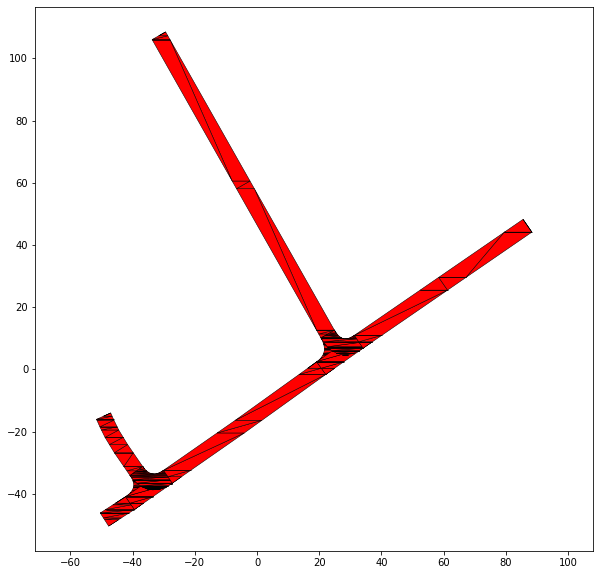

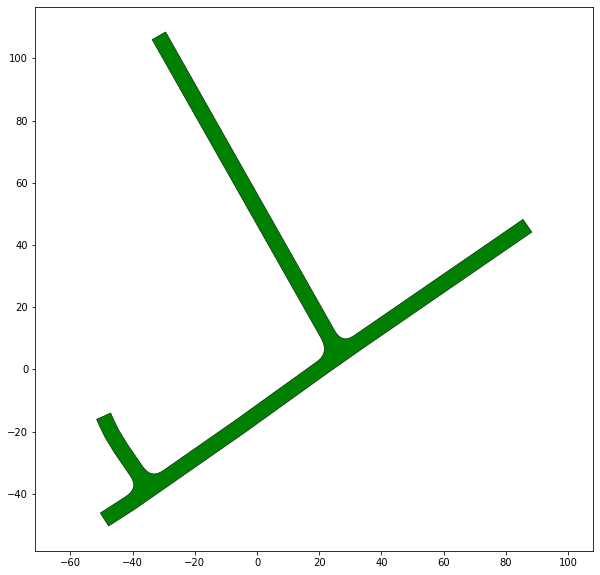

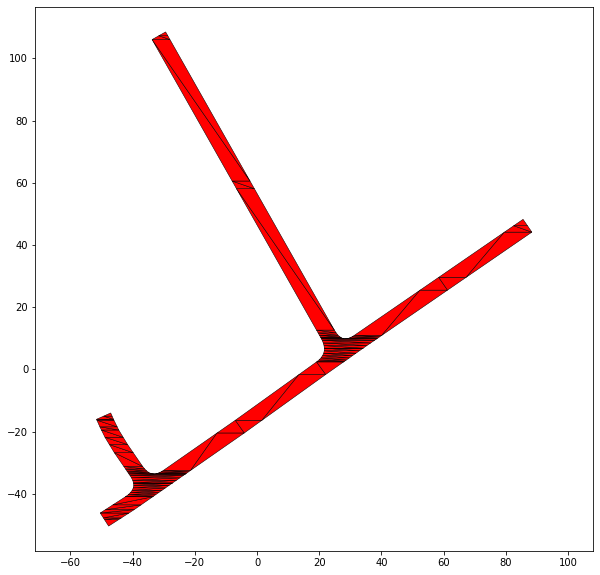

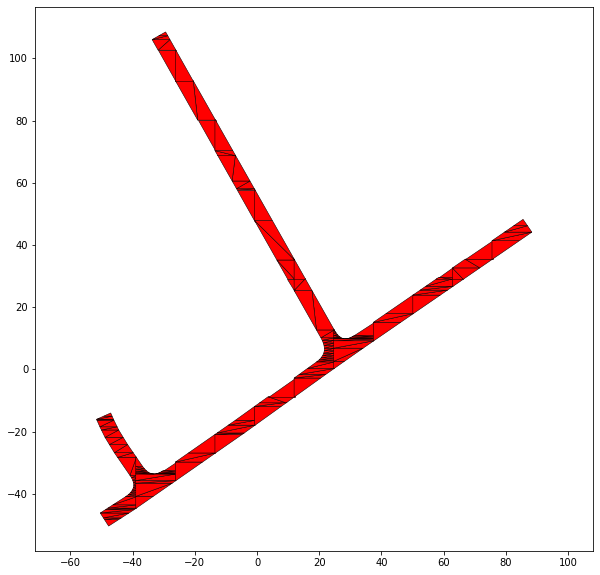

284 USA_Lanker-2_23_T-1


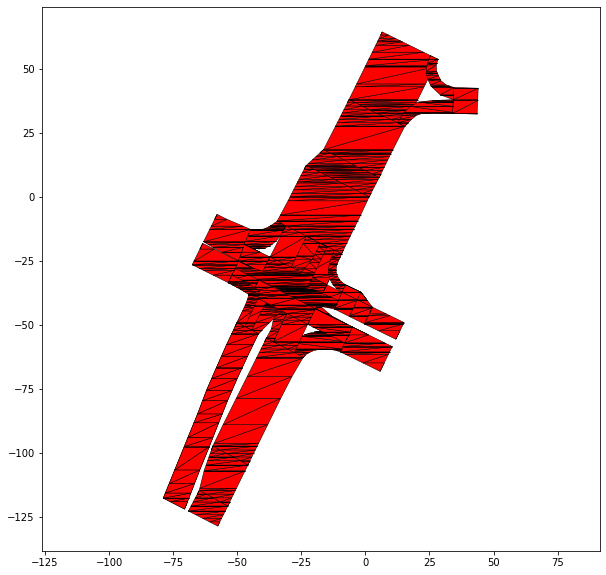

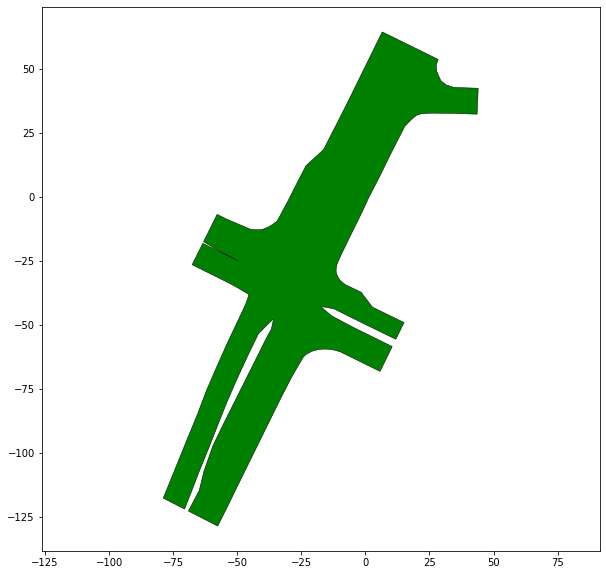

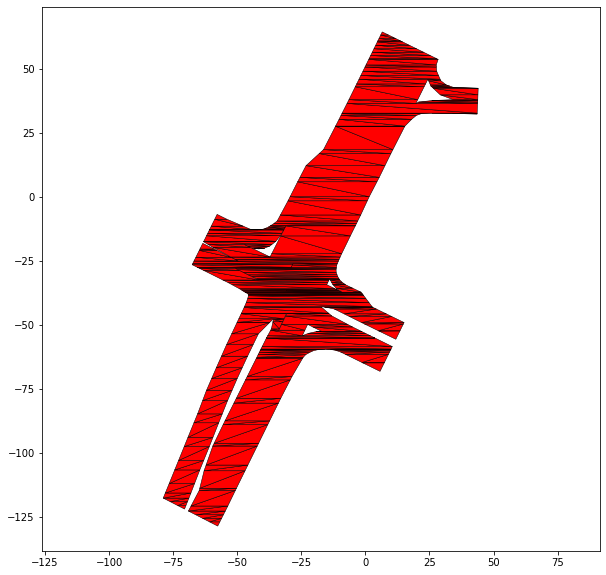

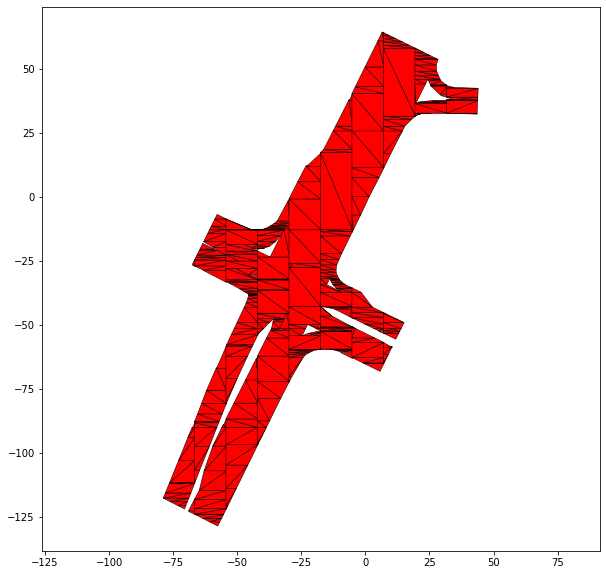

285 USA_US101-14_4_T-1


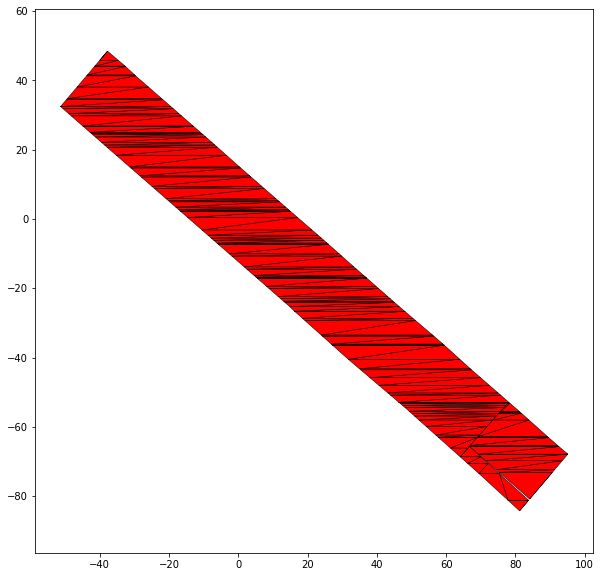

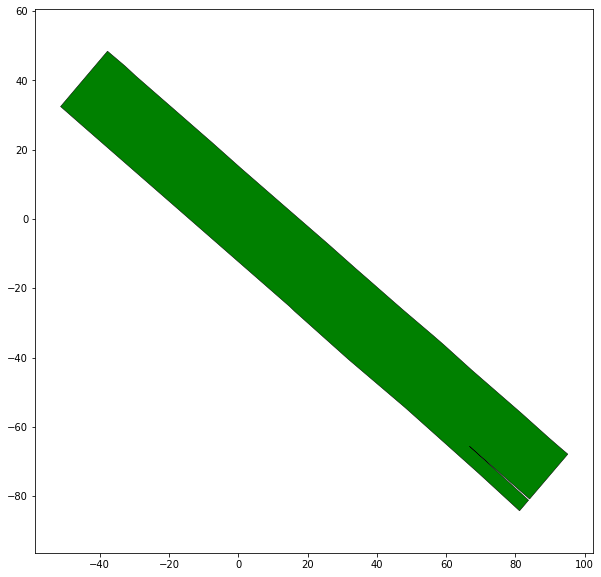

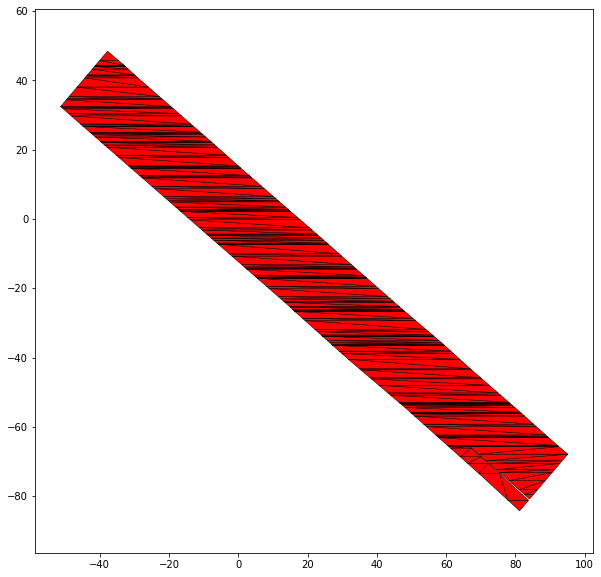

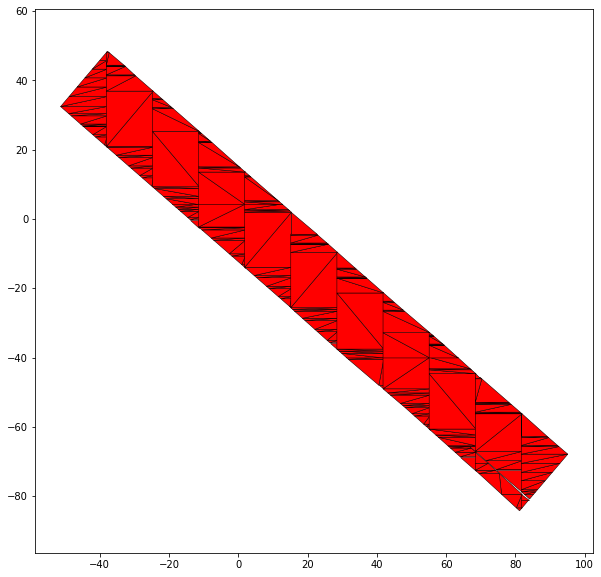

286 DEU_Ffb-1_7_T-1


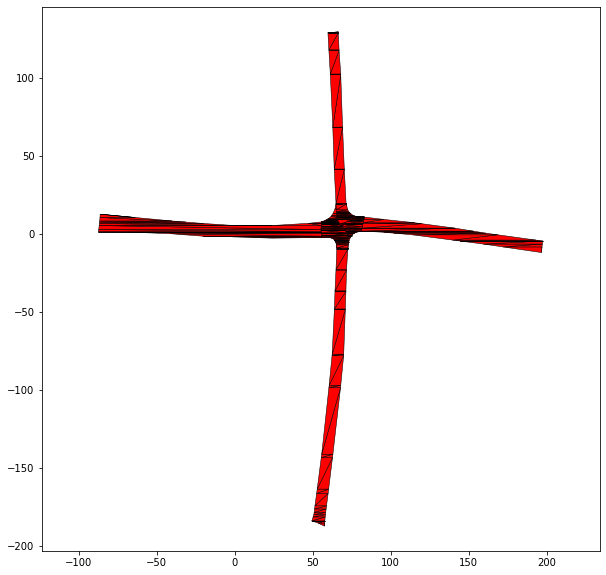

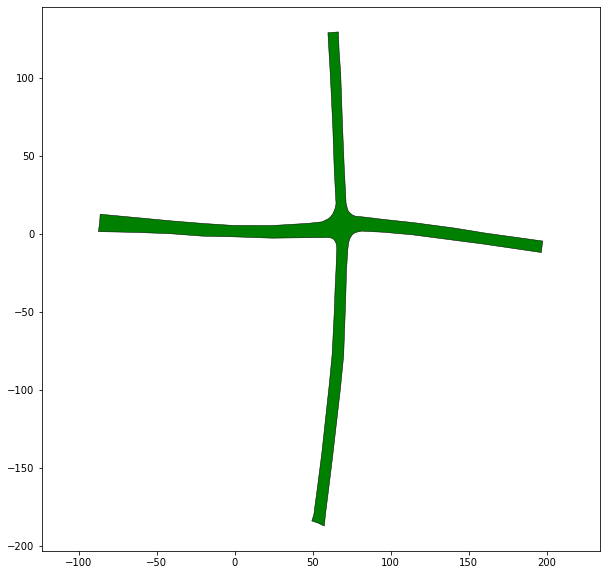

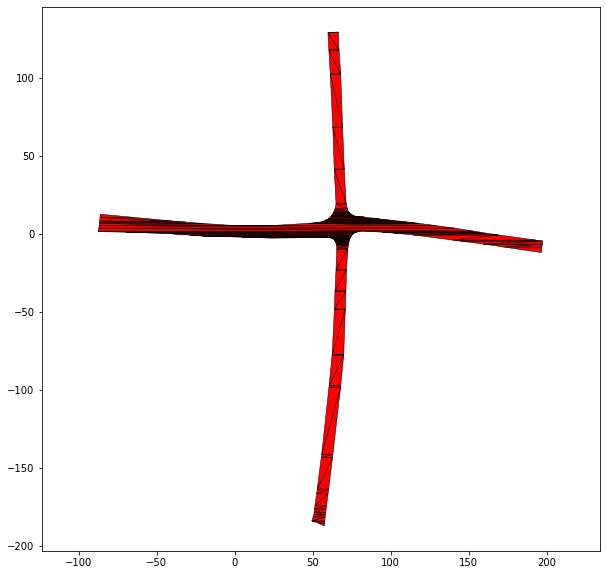

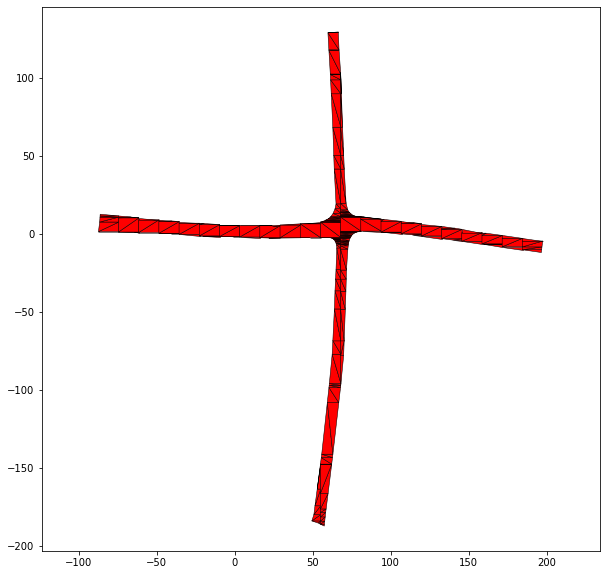

296 CHN_Sha-4_8_T-1


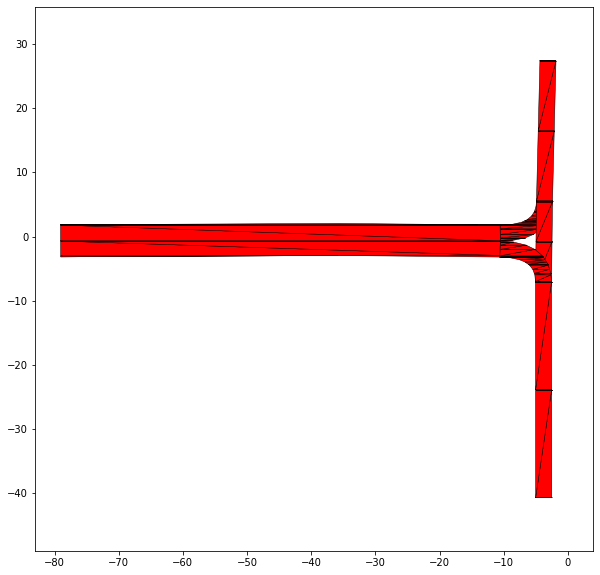

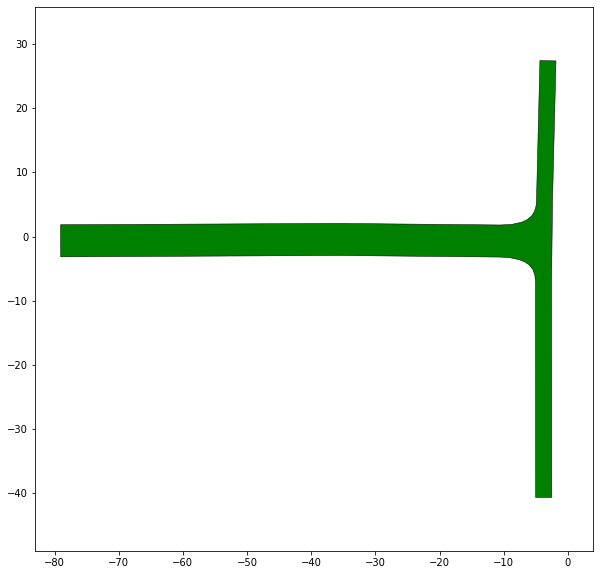

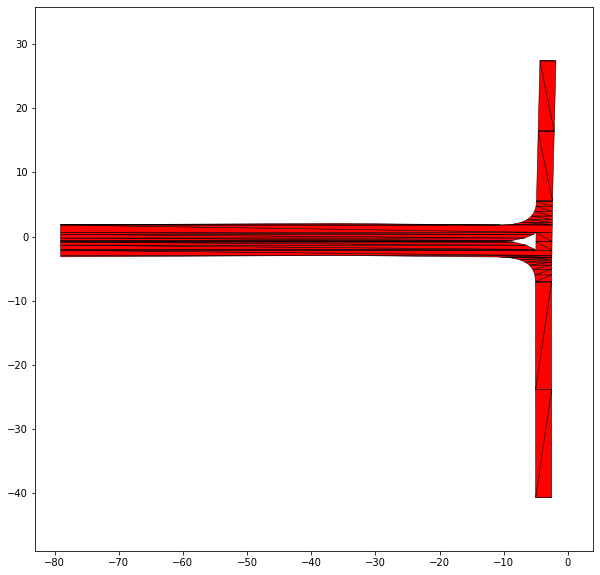

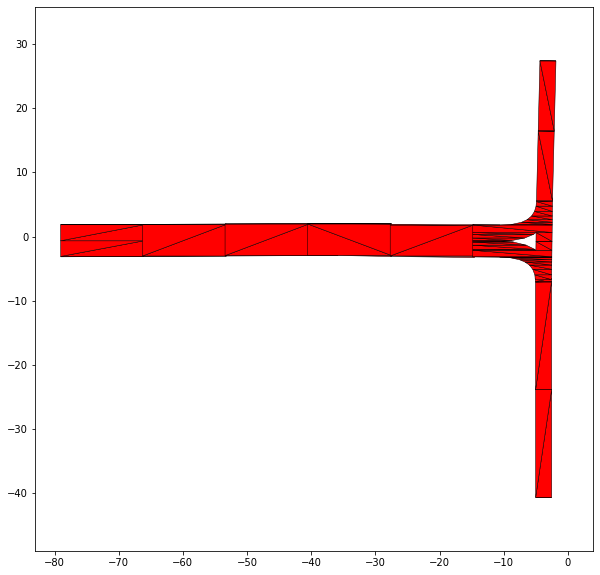

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt

directory = 'scenarios/exercise/'

dict_res = dict()
dict_ct = dict()
dict_obst_num = dict()
for ind, el in enumerate(os.listdir(directory)):
    # open scenario
    scenario_name = os.path.splitext(el)[0]
    
    # pre-processes scenario for all different methods for road compliance checking
    init_list = scenario_init(scenario_name)
    if init_list is None:
        pass
    else:
        print(str(ind) + ' ' + scenario_name)
        #print(scenario_name)
        
        # extract all return values
        scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
        
        # time measurements for pre-processing for road-compliance check, e.g., construction of road boundaries
        #print("Pre-processing time: triangulation: {}, axis-aligned triangulation: {}, orientated-bounding boxes: {}, occupancy inclusion(Grid): {}".format(time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid))
        dict_ct[scenario_name] = (time_triangles, time_aligned_triangles, time_rectangles, time_polygons_grid, time_polygons_lanes, time_polygons_whole)
        #print("Number of objects: triangulation: {}, axis-aligned triangulation: {}, orientated-bounding boxes: {}, occupancy inclusion (Grid): {}".format(road_boundary_sg_triangles.size(), road_boundary_sg_aligned_triangles.size(), road_boundary_sg_rectangles.size(), road_boundary_sg_polygons_grid.size()))
        dict_obst_num[scenario_name] = (road_boundary_sg_triangles.size(), road_boundary_sg_aligned_triangles.size(), road_boundary_sg_rectangles.size(), road_boundary_sg_polygons_grid.size(), road_boundary_sg_polygons_lanes.size(), road_boundary_sg_polygons_whole.size() )
        
        # time measurements for road compliance check with multiple trajectories
        res_tri = (get_result_triangles(trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles,road_boundary_sg_polygons_grid, broadphase='grid'))

        res_poly_grid = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_grid))
        res_poly_lanes = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_lanes))
        res_poly_whole = (get_result_polygons(list_trajectories, road_boundary_sg_polygons_whole))
        
        polygon_settings_list=[{'buffer':1,'resample':1,'triangulate':True}, 
                              ]
        res_poly_lanes_list=list()
        
        for ind,el in enumerate(polygon_settings_list):
            init_list = scenario_init(scenario_name, poly_creation_settings=el)
            scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
            #cur_res=get_result_polygons(list_trajectories, road_boundary_sg_polygons_lanes)
            plt.figure(figsize=(10, 10))
            for el in road_boundary_sg_polygons_lanes.unpack():
                draw_object(el.triangle_mesh(), draw_params={'collision': {'facecolor': 'red'}})
            plt.autoscale()
            plt.axis('equal')
            plt.show()
            plt.close()
            #res_poly_lanes_list.append(cur_res)
            #print('tri=poly_lanes '+ str(ind) + ': '+str((res_tri==cur_res).sum()))
        
        polygon_settings_list=[
                       {'buffer':1,'resample':1,'triangulate':True} 
                      ]
        for ind,el in enumerate(polygon_settings_list):
            init_list = scenario_init(scenario_name, poly_creation_settings=el)
            scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list
            cur_res_whole=get_result_polygons(list_trajectories, road_boundary_sg_polygons_whole)
            
            plt.figure(figsize=(10, 10))
            draw_object(road_boundary_sg_polygons_whole, draw_params={'collision': {'facecolor': 'green'}})
            plt.autoscale()
            plt.axis('equal')
            plt.show()
            plt.close()
            plt.figure(figsize=(10, 10))
            draw_object(road_boundary_sg_polygons_whole.unpack()[0].triangle_mesh(), draw_params={'collision': {'facecolor': 'red'}})
            plt.autoscale()
            plt.axis('equal')
            plt.show()
            plt.close()
            plt.figure(figsize=(10, 10))
            for el in road_boundary_sg_polygons_grid.unpack():
                draw_object(el.triangle_mesh(), draw_params={'collision': {'facecolor': 'red'}})
            plt.autoscale()
            plt.axis('equal')
            plt.show()
            plt.close()
            
            #cur_res_grid=get_result_polygons(list_trajectories, road_boundary_sg_polygons_grid)
            
            #print(road_boundary_sg_polygons_whole.unpack()[0].hole_vertices())
            #print('tri=poly_whole '+ str(ind) + ': '+str((res_tri==cur_res_whole).sum()))
            #print('tri=poly_grid '+ str(ind) + ': '+str((res_tri==cur_res_grid).sum()))
            

### 1.2 Export Data

### 1.3 Error Statistics

In [6]:
tri_tri_errors=0
box_tri_errors=0
poly_grid_tri_errors=0
poly_lanes_tri_errors=0

total_count=0
for key in dict_res.keys():
    el=dict_res[key]
    if el[0][1]!=el[1][1]:
        tri_tri_errors=tri_tri_errors+1
    if el[0][1]!=el[2][1]:
        box_tri_errors=box_tri_errors+1
    if el[0][1]!=el[8][1]:
        poly_grid_tri_errors=poly_grid_tri_errors+1
    if el[0][1]!=el[9][1]:
        poly_lanes_tri_errors=poly_lanes_tri_errors+1    
    total_count=total_count+1
    
print("Number of scenarios where triangulation yields different result than Orientated Rectangles (number of colliding trajectories differs): {}".format(box_tri_errors))
print("Number of scenarios where triangulation yields different result than Axis-Aligned triangulation (number of colliding trajectories differs): {}".format(tri_tri_errors))
print("Number of scenarios where triangulation yields different result than Occupancy Inclusion - Grid (number of colliding trajectories differs): {}".format(poly_grid_tri_errors))
print("Number of scenarios where triangulation yields different result than Occupancy Inclusion - Lanes (number of colliding trajectories differs): {}".format(poly_lanes_tri_errors))
print("Number of tested scenarios: {}".format(total_count))

Number of scenarios where triangulation yields different result than Orientated Rectangles (number of colliding trajectories differs): 0
Number of scenarios where triangulation yields different result than Axis-Aligned triangulation (number of colliding trajectories differs): 0
Number of scenarios where triangulation yields different result than Occupancy Inclusion - Grid (number of colliding trajectories differs): 0
Number of scenarios where triangulation yields different result than Occupancy Inclusion - Lanes (number of colliding trajectories differs): 0
Number of tested scenarios: 0


## 2 Collision-Detection in Dynamic Scenarios 

In [7]:
def create_tvobstacle(state_list,box_length,box_width):
    traj_list=create_traj_list(state_list)
    start_idx=0
    if len(state_list)>0:
        start_idx=state_list[0].time_step
    print(start_idx)
    retObj=pycrcc.TimeVariantCollisionObject(start_idx)
    for time_step in traj_list:
        retObj.append_obstacle(pycrcc.RectOBB(box_length, box_width, time_step[2],time_step[0],time_step[1]))
    return retObj   

def create_traj_list(state_list):
    traj_list=list()
    start_step=0

    # add all trajectory steps from Step 2 onwards to traj_list
    for el in state_list[start_step:]:

        new_el=list()
        new_el.append(el.position[0])
        new_el.append(el.position[1])
        new_el.append(el.orientation)
        traj_list.append(new_el)
    return traj_list

scenarios=""

dict_res_dyn = dict()
for ind,el in enumerate(os.listdir(directory)[0:]):
    scenario_name = os.path.splitext(el)[0]
    if(True):
        init_list = scenario_init(scenario_name)
        if init_list is None:
            pass
        else:
            scenario, cc, tv_dyn_obstacles_list, trajectories, list_trajectories, box_length, box_width, road_boundary_sg_triangles, road_boundary_sg_aligned_triangles, road_boundary_sg_rectangles, road_boundary_sg_polygons_grid,road_boundary_sg_polygons_lanes,road_boundary_sg_polygons_whole, (time_triangles,time_aligned_triangles,time_rectangles,time_polygons_grid,time_polygons_lanes,time_polygons_whole) = init_list

            if(len(tv_dyn_obstacles_list)>0):

                print(scenario_name)
                #print('Number of dynamic obstacles: '+ str(len(tv_dyn_obstacles_list)))
                res_dynamic=dict()

                broadphase_list=['grid','fcl','box2d']
                for broadphase in broadphase_list:
                    res_dynamic[broadphase]=get_result_dynamic_obstacles(scenario, cc, list_trajectories, tv_dyn_obstacles_list,broadphase)
                
                res_dynamic['gt']=get_result_dynamic_obstacles_bruteforce(scenario, cc, list_trajectories, tv_dyn_obstacles_list)

                print('fcl=gt: '+str((res_dynamic['fcl']==res_dynamic['gt']).sum()))
                print('fcl=grid: '+str((res_dynamic['grid']==res_dynamic['fcl']).sum()))
                print('box2d=grid: '+str((res_dynamic['grid']==res_dynamic['box2d']).sum()))
                
                dict_res_dyn[scenario_name]=res_dynamic


USA_Peach-2_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
USA_Lanker-2_12_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
USA_US101-21_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
USA_Lanker-2_11_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
CHN_Sha-13_2_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
RUS_Bicycle-1_2_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
USA_US101-17_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
RUS_Bicycle-5_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
CHN_Sha-1_4_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
DEU_Muc-27_2_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
USA_Lanker-2_5_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
USA_US101-9_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
RUS_Bicycle-11_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
CHN_Sha-2_7_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
DEU_Muc-7_1_T-1
fcl=gt: 1000
fcl=grid: 1000
box2d=grid: 1000
RUS_Bicycle-6_2_T-1
fcl=gt: 1000
fcl=grid: 1000
b